In [13]:
import numpy as np
from math import e
import math
import random
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

In [14]:
class Calculate_xjLs:
    def calculate_xjLs(self,x):
        xjLs = [x]
        sjLs = []
        for layer in range(self.N_layers-1):
            x_l = [1] if layer != self.N_layers-2 else [] #self.N_layers-2 bc layer 2nd gives layer 3 and layer 2nd is actually 1
            s_l = []
            weights_for_layer = self.weights[layer]
            for w_jl in weights_for_layer: #picking specific weights of one output (j)
                s_jl = np.matmul(x,w_jl.T)
                x_jl = self.activation_func(np.matmul(x,w_jl.T))
                x_l.append(x_jl)
                s_l.append(s_jl)
            xjLs.append(x_l)
            sjLs.append(s_l)
            x = x_l
        return xjLs, sjLs

class CalculateDeltas:
    def calculate_deltaL(self,x,y):
        x_1_L = self.xjLs[self.N_layers-1][0]
        return [(x_1_L-y)*self.derivative_of_activation_func(x_1_L)]
    
    def calculate_deltas(self,layer,deltas_layer):
        #when layer is three gives deltas for two (already made deltaL), when layer is 2 it gives deltas for 1 --> stop at layer 2
        if layer == 2:
            return [deltas_layer]
        layer_m1 = layer-1
        d_layer = [1] if layer == self.N_layers else range(1,self.layers[layer_m1]) 
        d_layer_m1 = range(1,self.layers[layer_m1-1]) 
        
        deltas_layer_m1_i = []
        
        for i in d_layer_m1:
            sum_of_j_paths = 0
            for j in d_layer:
                deltaj = deltas_layer[j-1]
                sum_of_j_paths += deltaj*self.weights[layer_m1-1][j-1][i] 
                #j-1 because the weights for j=1 are actually the first weights as j=0 is 1
            
            delta_layer_m1_i = self.derivative_of_activation_func(self.sjLs[layer_m1-2][i-1]) * sum_of_j_paths #-2 becuase no sjs for layer 1
            deltas_layer_m1_i.append(delta_layer_m1_i)
            
        return self.calculate_deltas(layer-1,deltas_layer_m1_i) + [deltas_layer]
    
    

In [15]:
class Plot:
    def simple_plot(self,X,preds):
        data = np.concatenate([np.array(X),np.array(preds).reshape(-1,1)],axis=1)
        df = pd.DataFrame(data, columns = ["x1","x2","y"])
        sns.scatterplot(data=df, x="x1", y="x2", hue="y")
        plt.xlim([-1, 1])
        plt.ylim([-1, 1])
        plt.show()
        
    def plot_ein(self):
        preds = self.calculate_preds(self.Xorig)
        if self.activation == "tahn": preds = np.sign(preds)
        self.simple_plot(self.Xorig, preds)
     
    def plot_eout(self):
        X = np.random.uniform(-1.0,1.0,(1000,2))
        preds = self.calculate_preds(X)
        if self.activation == "tahn": preds = np.sign(preds)
        y = self.find_actual_y(X)
        self.simple_plot(X, preds)
        self.simple_plot(X, y)
        preds = self.calculate_preds(X)
        plt.plot(preds,preds,"go")
        plt.plot(preds,y,"bo")
        plt.vlines(preds,preds,y, colors='k', linestyles='solid', label='')
        plt.show()

In [16]:
class Line():
    def create_line(self):
        if self.type == "linear regressor":
            self.mbs = np.random.uniform(10.0,0.0,self.input+1)
        if self.type == "PLA":
            self.mbs = np.random.uniform(1.0,0.0,self.input-1+1)
        if self.type == "circle":
            self.r = np.random.uniform(.8,0.0,1)
    def find_actual_y(self,X):
        if self.type == "PLA":
            return np.sign(np.matmul(self.add_thresholdCol(X)[:,:-1],self.mbs.T) - X[:,-1])
        if self.type == "linear regressor":
            return np.matmul(self.add_thresholdCol(X),self.mbs.T)
        if self.type == "circle":
            return [1 if x else -1 for x in np.sum(X**2,axis=1)>self.r**2]


    
    

In [17]:
class SGDGradient:
    
    def sgd_gradient(self):
        
        for layer in range(2,self.N_layers+1):
            layer_m1 = layer-1 #wij_2 where 2=layer is the weights between layer 1 (layer-1) and layer 2 (layer)
            delta_layer = self.deltas[layer-2] #delta layer 2 is the first delta at index 0
            dj_l = self.layers[layer-1]
            if layer==self.N_layers: dj_l +=1
            for j in range(1,dj_l):
                deltaj_l = delta_layer[j-1]
                for i in range(self.layers[layer_m1-1]):
                    wij_l = self.weights[layer_m1-1][j-1][i]#weights for layer 1 to go to layer 2 is at index 0
                    xi_layer_m1 = self.xjLs[layer_m1-1][i]
                    gradient = -self.n*xi_layer_m1*deltaj_l
                    self.weights[layer_m1-1][j-1][i] = wij_l + gradient
        
        
        
    def sgd_epoch(self):
        vals = list(range(self.N))
        random.shuffle(vals)
        for v in vals:
            x, y = self.X[v],self.y[v]
            self.xjLs,self.sjLs = self.calculate_xjLs(x)
            self.deltaL = self.calculate_deltaL(x,y)
            self.deltas = self.calculate_deltas(self.N_layers,self.deltaL)
            print(self.deltas)
            self.sgd_gradient()
        return self.weights 

In [18]:
class ActivationFunc:
    def activation_func(self,sj):
        if self.activation == "relu":
            return max(0,sj)
        if self.activation == "tahn":
            return (e**sj-e**-sj)/(e**sj+e**-sj)

    
    def derivative_of_activation_func(self,s):
        if self.activation == "relu":
            return 0 if s<0 else 1
        if self.activation == "tahn":
            return (1-(self.activation_func(s))**2)
       

In [19]:


class NeuralNetwork(Line,Plot,ActivationFunc,Calculate_xjLs,CalculateDeltas,SGDGradient):
    def __init__(self):
        self.N = 100
        self.input = 2
        self.layers = [self.input+1,4,1]
        self.n = .1
        self.N_layers = len(self.layers)
        self.type = "circle"
        self.activation = "tahn"
        self.init_weights()
        self.createData()
        
        
        self.ein = self.mse(self.X,self.y)
        print("Pre Adjusting Ein %s" % self.ein)
        self.runSGD()
        
        print("Final Weights %s" % self.weights)      
        print("Num Iterations %s" %self.num_iter)
        self.ein = self.mse(self.X,self.y)
        print("Ein %s" % self.ein)
        
        self.eout = self.eout()
        print("Eout %s" % self.eout)
        
        self.plot_ein()
        self.plot_eout()
        
    
      
        
####################################################
    def runSGD(self):
        self.num_iter = 0
        hump = 0
        for x in range(1000):
            wt = self.weights_list()
            self.num_iter += 1
            self.sgd_epoch()
            wt1 = self.weights_list()
            if np.sqrt(sum((wt-wt1)**2)) <.01: #np.linalg.norm
                hump += 1
                if hump>1000:
                    break
    def add_thresholdCol(self,X):
        return np.concatenate([[[1]for x in range(len(X))],X],axis=1)
    
    def createData(self):
        self.create_line()
        self.Xorig = np.random.uniform(-1.0,1.0,(self.N,self.input))
        self.y = self.find_actual_y(self.Xorig)
        self.X = self.add_thresholdCol(self.Xorig)

        
        
    def weights_list(self):
        change = []
        for layer in range(2,self.N_layers+1):
                layer_m1 = layer -1
                jss = [0] if layer == self.N_layers else range(self.layers[layer-1]-1)
                iss = range(self.layers[layer_m1-1]) 
                change += [self.weights[layer_m1-1][j][i] for i in iss for j in jss]
        return np.array(change) 
    
    def init_weights(self):
        self.weights = []
        for layer in range(1,self.N_layers):
            N_l = self.layers[layer]-1 if layer+1 != self.N_layers else self.layers[layer]
            N_lm1 = self.layers[layer-1]
            self.weights.append(np.random.uniform(-1.0,1.0,(N_l,N_lm1)))
        
    def mse(self,X,y):
        w = self.weights
        return sum([(self.calculate_xjLs(X[v])[0][-1][0] - y[v])**2 for v in range(len(X))])/len(X)
    
    def calculate_preds(self,X):
        X = self.add_thresholdCol(X)
        return [self.calculate_xjLs(x)[0][-1][0] for x in X]
        
    
    def eout(self):
        Xorig = np.random.uniform(-1.0,1.0,(100,2))
        X = self.add_thresholdCol(Xorig)
        y = self.find_actual_y(Xorig)
        return self.mse(X,y)

    

   

Pre Adjusting Ein 1.1828034923069666
[[-0.016325469103072247, -0.29757405495963124, -0.03845968268976309], [-1.1064057374719138]]
[[-0.0027656279942743335, -0.2448466470056452, -0.0727430369084262], [-1.1550441415849133]]
[[0.0832725217153234, -0.21518259470998322, -0.05393619362943787], [-0.9631593574845497]]
[[0.04394372597121584, -0.011580038684814956, -0.08748492857607183], [-0.9900331642943822]]
[[-0.11653871288122573, 0.08703736091583342, 0.10767122395236137], [1.137220879568787]]
[[0.16083663719399036, -0.008998558658675776, -0.05982705177755036], [-0.9672061105536758]]
[[-0.21072312497938947, 0.05254249790712311, 0.10614733873212268], [1.1807822400333219]]
[[-0.12240855911830982, 0.08349892743024849, 0.07097545490438345], [1.0826240421828441]]
[[0.11939604404960982, -0.03327530920973038, -0.050407703752008204], [-1.1607402723593123]]
[[0.09228705581729701, -0.010665762937315368, -0.07573974761801701], [-0.9713058736917235]]
[[-0.12747949052740534, 0.04184141318985713, 0.1235611

[[0.06492362048020871, -0.00032909375995630446, -0.05471630314651846], [-0.06355006181361691]]
[[-1.0772267857399047, 0.5773786494790089, 0.014648701348908909], [1.151737176963904]]
[[-0.20989803043172764, 0.07055194971965606, 0.06407470569685365], [0.24709553506988477]]
[[0.5196684572843788, -0.5451237297672508, -0.0026488113619475588], [-0.48364227590048947]]
[[0.15453969108487636, -0.4932763609194326, -0.03422574951791761], [-0.6064322581531338]]
[[0.07059894925723903, -0.8799891932032534, -0.4377962152808911], [-0.7517280838662881]]
[[-0.8146267380397707, 0.10723670752265205, 0.2723779468364365], [0.8313173110928658]]
[[0.12959447711192432, -0.20844423138984997, -0.000432852259269148], [-0.20516575010532342]]
[[0.00043681121790871316, -0.03848071202117262, -0.016322399706142902], [-0.03748397406933698]]
[[-0.7325452625499839, 1.1045302446857153, 0.05319251459443575], [0.9633891181005265]]
[[0.03524123477979059, -0.540825960755662, -0.23372701957339917], [-0.5271155637525842]]
[[-0.

[[0.009673461347615377, -0.015230000693830688, -6.703570223307423e-05], [-0.16476576504333332]]
[[0.7222609180819214, -0.05765110279330065, -0.0017892379590356202], [-0.6056667651107124]]
[[-0.021960902302808623, 0.0014501151230390148, 0.0029592445040265104], [0.01706077370048611]]
[[-0.09055297949320766, 0.01087787574959914, 0.0012871815535365398], [0.0503517499196471]]
[[-0.10354340245210349, 0.0007680700113387551, 0.11159364691590878], [0.08042402196734333]]
[[0.016376320788445416, -0.0011184451017805463, -0.10013014919827994], [-0.14125016497031534]]
[[0.019063558026470126, -0.8100203954739379, -0.02456733884724655], [-0.6612429223145538]]
[[-0.03053743792919129, 0.0010108018909721149, 0.012187281350917152], [0.025883381609088683]]
[[0.6184905496309941, -0.006887435569308546, -0.02097811210327348], [-0.48299085017356863]]
[[-0.0030977245628714847, 0.1534958508202412, 0.042773855170637025], [0.0920278386065958]]
[[-0.013329066429105177, 0.030733307999665407, 0.0010833368591726495], 

[[0.02491246161670558, -2.8846000517437823e-06, -0.012454515329457799], [-0.0225751175111337]]
[[-0.015828269175181726, 0.12303039617953686, 0.00036334699156999193], [0.05194402313652732]]
[[-0.041431528996446185, 0.6949999687034867, 0.0022507398958530127], [0.29291160150072226]]
[[-0.23012937456111926, 0.0004509943358288236, 0.03355502760423471], [0.09336532468848505]]
[[0.8868232190208696, -2.5792537141988605, -0.0011390353626985566], [-1.0545745081015891]]
[[-0.004553904513855976, 2.316520810815954, 0.42619719099169207], [1.1868504473088282]]
[[-0.1064085294755749, 0.00028473852052135224, 0.021632239229509468], [0.04458729899474776]]
[[0.09193327285899372, -0.036971482914825965, -6.51506474021188e-05], [-0.1305407133090075]]
[[1.6813683039155891, -0.001954260364896237, -0.2839669472150016], [-0.849586977861709]]
[[0.1460670990176098, -0.14698545027732954, -3.3315272019027436e-05], [-0.11923105140151187]]
[[-0.09763778638129943, 0.0003228540135019243, 0.09638293264055828], [0.0584635

[[0.2488324451125682, -0.00017070790313618832, -0.062516905459671], [-0.15715460655707816]]
[[0.02001141399366533, -2.968467486282769e-05, -0.07224576920322243], [-0.07662282518248723]]
[[0.003976059587254876, -1.7321698991112117e-06, -0.0029658135224872465], [-0.030136288993270536]]
[[0.21458186181887834, -0.21239756208858362, -2.9054388811574937e-05], [-0.08388951192989241]]
[[0.014297568482623278, -0.016431081706631333, -9.098885623798438e-06], [-0.023744177772704416]]
[[0.000578396908714767, -1.7027434546392894, -0.3351194427210348], [-0.81479673263092]]
[[-0.2452156820822684, 2.5041828115037172, 0.006619316615420777], [1.1947796575493153]]
[[0.04147371852199077, -0.14093600107371493, -0.0001222172312845579], [-0.1749029497936883]]
[[-0.0018395664598704667, 0.004108600206971768, 3.364944753275534e-05], [0.002661846030668384]]
[[0.0007251441862722234, -0.00011022211356673105, -0.019925669113826764], [-0.04804803880632204]]
[[0.0021027263320176613, -0.00015741455295124654, -0.0503142

[[4.457665990575752e-06, -0.11385789347608227, -0.1386262718036219], [-0.059433773598825165]]
[[-0.0006389304487742082, 1.1189610266599362e-05, 0.0005103242536648283], [0.0006573523560804353]]
[[0.028837004519470636, -7.487182274663288e-06, -0.04789260137679737], [-0.04362208100720572]]
[[0.03726980704064854, -1.4939212555003997e-06, -0.03453544451789596], [-0.01711933482933293]]
[[1.593079476646308, -0.29118732477772324, -0.0010707146354754042], [-0.7300740112042732]]
[[0.10561339965804833, -1.0537816618060493e-05, -0.09760659084214042], [-0.0442057540688285]]
[[-0.00010082163260040441, 0.002186655107211733, 0.020186337908039594], [0.007815244322642514]]
[[-0.000221031380959921, 0.07326178385558353, 0.007941022652801635], [0.027131986542803868]]
[[0.00023405134283614374, -0.7095048102391126, -0.27161498213307356], [-0.45337209803245243]]
[[0.19741979050248218, -0.00010387207175121781, -0.07452525916926694], [-0.11906263371196797]]
[[0.08844079965586579, -0.0017434835467704235, -0.0017

[[1.9063702672594328e-06, -0.044808390012972314, -0.05705059756991528], [-0.030174372943454136]]
[[-0.0006327859127660776, 0.36017037887026404, 0.033990917308187325], [0.11855699536581515]]
[[3.523253406170292e-05, -0.006363722551239654, -0.0021576486647165416], [-0.06363143252604996]]
[[-1.9091130063224886, 0.6493925390463315, 0.0023415675677885255], [0.6888021338046472]]
[[0.004059991128192602, -0.009026997461626605, -3.9557229994031335e-05], [-0.06898041736474451]]
[[0.00036777868360176463, -0.022936755642538973, -0.000835108898334939], [-0.08123453428432999]]
[[0.015412266524933294, -2.9277276677177245e-07, -0.006077525534693588], [-0.01647099868475758]]
[[-0.0014152746286836165, 0.009977506662827687, 4.52792362206623e-05], [0.0036183330777586147]]
[[-0.00041398424950478706, 8.736952971662551e-06, 0.00183663763716777], [0.0008879693299664698]]
[[0.0012071849348600774, -8.393613360836858e-06, -0.00673422398265761], [-0.0374323826858486]]
[[0.1565693164487264, -0.0002098424817665828,

[[0.015328617960111524, -7.154007203012633e-07, -0.013732706335827644], [-0.016764565603705435]]
[[-0.006580855750937716, 1.1914514377771022e-05, 0.015061350995486424], [0.00544688781066836]]
[[-1.6193171168422749, 0.0008187275856659657, 0.30105715821454027], [0.5284422343735004]]
[[-0.00035540494056762295, 0.0157150141453568, 0.37747702602081473], [0.10813639639826972]]
[[0.028649445965852383, -0.06678945348385969, -0.0001324900455247898], [-0.18875410357514524]]
[[-2.4080792095857954e-06, 0.0009864943650669008, 0.001291513468636736], [0.0007617457506886556]]
[[-1.5831972765595632e-05, 1.6646010309789212e-05, 9.001433543592356e-06], [5.369870089938755e-05]]
[[-7.410903571318063e-06, 1.2020744335103927e-05, 2.4516718011262517e-05], [5.5181957301545034e-05]]
[[0.07527036901916202, -0.04191133784672101, -9.704418881842633e-06], [-0.05448862635705349]]
[[0.3864590964536921, -2.0907899075724573e-05, -0.7007477248358697], [-0.24383575085829792]]
[[-7.075214317067955e-05, 0.00018479569708556

[[0.00038152583320620766, -5.030267612169087e-05, -0.019949598188152114], [-0.0381786002287126]]
[[-0.015813325907535553, 0.0019403377507619883, 1.0930957455918489], [0.3321718842866217]]
[[0.472038989712056, -1.8196985453398205e-05, -0.7903823245922339], [-0.2673042363586052]]
[[-1.297543931902862e-06, 0.0003643768233686876, 0.0006614142150282433], [0.00037291203894366544]]
[[-0.13546987594460927, 1.6386905320500955, 0.003144009075285458], [1.0960791609860325]]
[[0.00016914379556107645, -3.585602182687589e-05, -0.009516125633510904], [-0.03222662863818398]]
[[-0.026994840494052003, 1.069811245166258e-05, 0.007320515561448586], [0.007828279525975724]]
[[-1.7466458561457515e-05, 7.810925940281637e-05, 1.759233860294845e-06], [6.014459019302579e-05]]
[[-2.0578994121281084e-06, 0.015226711446953832, 0.011368972308865624], [0.005668492023627489]]
[[0.014268159927557372, -0.0052328970339078976, -2.3489437345552316e-05], [-0.42490225654411]]
[[-4.342529106646518e-06, 2.9887882514241e-06, 1.3

[[-0.004918204747885058, 0.00033573887297730755, 1.6019563425568198e-05], [0.0014619670881058932]]
[[-0.015535309941845507, 0.00221074148662696, 1.030804251007681], [0.3094184768828457]]
[[1.4651038926945052, -0.0002034207769384096, -0.36647097597813494], [-0.6444389846587799]]
[[0.011086717116676349, -1.0527335910890335e-07, -0.007845763606516558], [-0.0032750172454141732]]
[[3.332264908426555e-07, -0.023180101972385223, -0.0436968528995016], [-0.014147744496077808]]
[[-0.004283157572265069, 0.00017811608557710725, 3.124412060523569e-05], [0.001282838706799545]]
[[0.0013935324298374626, -3.447659228530711e-06, -0.0032179151906389725], [-0.03257299052484653]]
[[-0.00031041972955705093, 2.0433092637146983e-06, 0.0010453670363596663], [0.0004108374882125862]]
[[-3.7427765362070615e-05, 0.43795928226051756, 0.28982325165585565], [0.13122863983422176]]
[[0.00035056621672932683, -0.10463880965210959, -0.008558420168473484], [-0.31047945556054]]
[[0.007723513472917512, -0.0009152305476191659

[[1.4601387075257075e-07, -0.017190775304673903, -0.028661360851479866], [-0.008246369089138094]]
[[0.000618558301203591, -0.1257386254904056, -0.005440364393835105], [-0.2488009081137211]]
[[-0.03592159990312191, 0.003201302583377416, 1.9846115287751622], [0.6117245892844454]]
[[0.030796105361530265, -6.709945247487775e-07, -0.03020751969844002], [-0.027225010822626364]]
[[-0.2898595344796559, 0.02444723632348062, 0.00030101828496496087], [0.0817243723361196]]
[[1.2694027138522305e-08, -0.00808200810501694, -0.0028400784703172923], [-0.003542246394982267]]
[[-0.0009840284065666396, 9.95911547949263e-07, 0.0021887503844729085], [0.0007805885950161545]]
[[-6.764616844768392e-07, 0.00023636757387451203, 5.3003079670577096e-05], [0.00011085668388389388]]
[[0.273902303547501, -0.0019539161279407613, -0.003770806080787781], [-0.22253137754886296]]
[[-8.239193077403519e-06, 0.13004502817155578, 0.0747391235916915], [0.037275271086705274]]
[[0.047626688498627355, -0.021633536431485204, -2.647

[[-4.13585668878063e-07, 0.00017079834349815903, 0.00023794536675359626], [0.00013682011783033385]]
[[0.007395673322424102, -1.9300640407551097e-08, -0.0023000503659920874], [-0.005155672291281774]]
[[6.210461798649439e-06, -0.0007066254861962303, -0.014171488383460405], [-0.027999022205319444]]
[[-5.248802685396067e-07, 0.0001892625009355723, 0.0004350994291780042], [0.00019566498996465476]]
[[-0.00016633385244832873, 8.418351716629609e-07, 0.0005640047245235274], [0.00022658830134085603]]
[[-3.4570868154792047e-06, 1.6519144481060652e-06, 4.141189292970091e-06], [1.1148656781258076e-05]]
[[0.00015586727328691154, -0.024149638090468335, -0.0024985763893281016], [-0.10958061698953286]]
[[-7.097381894029001e-06, 6.276358389011034e-05, 0.001926937894116366], [0.0005846559173312908]]
[[0.5773967085539404, -1.4011082222740908e-05, -0.5263217861911901], [-0.17759729932044152]]
[[0.00604165220998721, -1.4329195226585907e-06, -0.015523717776859205], [-0.024082799093527788]]
[[0.02172928940744

[[-1.6170691760257362e-05, 3.270451500502993e-05, 0.002642816016351597], [0.0007644832110330791]]
[[-0.010164972659912761, 0.001032208455554503, 1.0596606280484477], [0.2829608213955086]]
[[0.000210049222935153, -7.632823932892641e-07, -0.0035294967115732765], [-0.01643843347804489]]
[[0.1196532641466672, -0.06330651102810864, -0.00010789768150481357], [-0.10940303980453588]]
[[0.011044764073673908, -0.024097276390562396, -1.0636717475267426e-05], [-0.03269492065060711]]
[[0.2674586624594547, -0.000703690133972571, -0.011747777009464758], [-0.21810246514858195]]
[[0.0050252289427765075, -0.00013772305946590792, -3.5864628629223355e-06], [-0.07249871018837083]]
[[-1.4159035178648548e-05, 0.016039068475850536, 0.0017258726887295402], [0.004479800750896483]]
[[-0.7303118875190905, 0.0001589604270360512, 0.11601816698138691], [0.21304250715361314]]
[[-0.15204848265412277, 1.9797377578529096, 0.004595699440191933], [0.8174796072134074]]
[[-0.19058309933515236, 1.7876237698128483, 0.00292144

[[-0.2879334625498674, 1.9884051166950432, 0.004734983483941449], [1.107483404480495]]
[[-2.198046331511276e-06, 7.12377067291527e-07, 1.5205386949444734e-06], [4.92327309495897e-06]]
[[0.03165635368874291, -0.0002964157138259653, -0.0014379362136324382], [-0.05892345062785316]]
[[0.001405441745646595, -0.0035538539678705156, -8.66518409753027e-06], [-0.029337122688175756]]
[[-0.00029877604582042113, 4.5337527572707785e-07, 0.0006664664238762786], [0.00024457663658958436]]
[[-0.00521731822803545, 0.053295723578879906, 0.00011250580949401205], [0.013876394489480264]]
[[-2.69546822196542e-05, 0.0008849021441643998, 0.03128122803902682], [0.0076641774879218656]]
[[-3.042790303340442, 0.0007822767892941298, 0.5497281475539231], [1.0381838466848872]]
[[-9.78915994238239e-07, 6.315380400041286e-07, 3.4852727183722135e-07], [2.6147700096663776e-06]]
[[-0.15363929579193578, 1.206676404095543, 0.0020250938425049807], [1.1297285345053953]]
[[0.00011008312329758038, -1.4242782120463333, -0.443115

[[-0.1357565124939053, 1.0063656180514022, 0.004777291843497836], [0.55452749064532]]
[[0.0003531145070508206, -7.070016759408862e-07, -0.0012432544806915274], [-0.01675075080431658]]
[[-0.0013429581287527114, 0.05805799990923115, 1.9361060582113692], [0.5376570866830778]]
[[0.002388334829720158, -9.310447318235413e-05, -0.00036386860394263293], [-0.03793475918502473]]
[[0.03152983248454427, -0.0006682737920271764, -0.0009369932591359148], [-0.060471747443560944]]
[[-2.953015485270698e-07, 2.093818545180499e-07, 7.472055857669585e-07], [1.2258866388472475e-06]]
[[0.009216094207788022, -1.3322638991389841e-08, -0.002166712224241697], [-0.006294180555348088]]
[[0.02838525387265952, -4.545819973163902e-07, -0.035815551175644084], [-0.011785636238108193]]
[[1.3172982307708624e-07, -0.010881670726512211, -0.008342016447626846], [-0.019698544527560275]]
[[0.04556508156337715, -0.022873612610923542, -0.0003162690119814178], [-0.6217549677849594]]
[[0.006138958562140681, -6.6719045408647685e-0

[[0.015442789241523711, -9.730580027388769e-05, -0.0007726765624761344], [-0.0929199683403466]]
[[2.1424224992676542e-05, -0.0005357806015793913, -0.050738237102256174], [-0.051829162895595686]]
[[-3.9614424339476043e-07, 0.013227447130098638, 0.007945441958569737], [0.0034204312984386365]]
[[-2.919905882524364e-07, 2.580713241536626e-08, 4.0970329310437416e-07], [8.281554556366772e-07]]
[[-6.405985715600395e-05, 4.8112121366553976e-05, 8.910209556558244e-08], [2.911648141611287e-05]]
[[-1.8824706225975352e-07, 8.719461185115875e-08, 1.0778144295187554e-07], [6.261593645201272e-07]]
[[0.00015416770975524113, -5.936702784771233e-07, -0.002087145555010905], [-0.018674540662824906]]
[[0.06013136507975503, -0.1897327872586133, -0.00017441050803982826], [-0.43252246948441786]]
[[0.8675935203973884, -4.516548414741018e-06, -0.7419595940332118], [-0.251301005978222]]
[[1.605572024642403e-05, -0.1375092587780389, -0.07384272862187656], [-0.2727871540683286]]
[[5.3582362611243756e-08, -0.019368

[[-1.349256469244872e-05, 2.3389376263313786e-05, 1.5530748762206306e-07], [1.2134142088665774e-05]]
[[0.001821095762449688, -4.744494500508779e-10, -0.00015971426410260828], [-0.0006363016657668789]]
[[-0.00011073259742222432, 1.1614184399894927e-07, 5.665466058884065e-05], [4.184528739885146e-05]]
[[0.012188962999289128, -1.2602528982867838e-06, -0.014979481070859266], [-0.01811730570295678]]
[[0.005161542368927393, -3.4674831728900826e-09, -0.0006470817009534684], [-0.002867160138174291]]
[[2.55292075037433e-11, -0.00011832645749569892, -6.768098704690638e-05], [-3.015317741108669e-05]]
[[4.153076630712402e-05, -0.03378984927689718, -0.015042448538058292], [-0.3145074682318278]]
[[0.007228474598882685, -3.0754632973297694e-07, -0.009184406566725348], [-0.019808431827465986]]
[[1.8361752458104072e-06, -0.4798147250497821, -0.5383547091415475], [-0.1224493067432417]]
[[4.295129061648472e-13, -1.142252337048777e-05, -1.491346002680518e-06], [-2.90091079773577e-06]]
[[0.0001025977759135

[[0.0849184142547833, -0.00019906006691040824, -0.011536753426565467], [-0.12656318072805992]]
[[0.03287275516566295, -6.916590013368972e-05, -0.008395198118363817], [-0.0810084672258566]]
[[5.003005334659346e-06, -0.5942176594842674, -0.4475644348074057], [-0.251226264652321]]
[[-9.638069828608535e-05, 2.2701352309356491e-07, 0.00041499573200609987], [0.00011295217499785124]]
[[0.0010464283603149767, -1.3951400256168318e-05, -0.032425343220437275], [-0.04339441024258086]]
[[3.052181726196332e-08, -0.020693639152316076, -0.0162006246092844], [-0.008589248471658834]]
[[-5.011171100023869e-07, 2.4635084906570636e-05, 0.0004747644333154461], [0.00011928655937312731]]
[[-4.0155786752193386e-07, 1.9058441419876642e-07, 1.7813959835144438e-07], [8.092610720003441e-07]]
[[0.008083792116601783, -0.0021417804123764236, -0.00014395131244262526], [-0.05927550933617407]]
[[0.006934190721136845, -0.020501540840109418, -9.62561823572023e-06], [-0.030477304006155132]]
[[2.163307639666295e-05, -0.0005

[[-7.281009110487974e-08, 1.4314939134082941e-05, 4.862576663769976e-05], [1.6054950691319622e-05]]
[[0.007627077395563089, -0.003932891403268795, -4.1998657540031376e-07], [-0.0017611405090123993]]
[[0.007273977426098493, -5.571633751842661e-07, -0.014881878799354714], [-0.030266418452677957]]
[[0.21870923905939504, -1.256606612091895e-06, -0.2183532948716524], [-0.049270070863908]]
[[-0.0019754504721308137, 4.061620947628051e-07, 0.000906897770575232], [0.0004845038195062413]]
[[0.9735692054394849, -4.7126348511728254e-05, -0.44926495141562517], [-0.3482508179040536]]
[[-0.00016000518356701113, 3.5531125634440692, 3.044518393032516], [0.8416975698295065]]
[[-0.0019210217499656893, 7.553795109224097e-07, 0.000255955396812491], [0.0004193584623932787]]
[[9.435398647683881e-06, -0.07107788620310337, -0.05740586109729432], [-0.2404203455211636]]
[[0.009969637630720798, -1.3603946415618381e-08, -0.0022785956033249113], [-0.015774919733530554]]
[[0.04089290444793173, -0.04315066670845079, 

[[-2.538893549806056e-05, 0.11876599368443769, 0.018229537137580135], [0.02802627094857203]]
[[-5.962572340269097e-07, 4.8938364878942505e-09, 7.192577983363359e-07], [6.510693698046735e-07]]
[[0.16522713761617222, -1.21545039555373e-06, -0.288905412201207], [-0.1068482309125038]]
[[-2.1708578215481527e-07, 0.00032904620221920286, 5.9074099949681666e-05], [8.008032344569146e-05]]
[[-2.9564631272692994e-05, 1.1252149747673041e-07, 0.00031120497638910735], [7.163027061659023e-05]]
[[-1.4560197805785031e-08, 2.3059884036434393e-06, 8.079819385576727e-06], [3.2158582206566543e-06]]
[[-1.8642952737893304e-05, 0.00016866923456027217, 5.207963195541199e-07], [4.2268681498857885e-05]]
[[-6.322088211905167e-08, 1.559602380226473e-08, 1.566932713186298e-07], [2.2922140852203557e-07]]
[[0.26678691867099324, -0.2866095939149564, -4.658067668315511e-05], [-0.11927170117808232]]
[[1.4644046383922933e-10, -7.235360407952976e-05, -0.00013313935088774727], [-2.703635874922054e-05]]
[[-6.388200136349872

[[-3.378921193962892e-06, 2.8815641092731952e-05, 1.0092701893029333e-07], [8.226664893814467e-06]]
[[1.340880115893515e-05, -0.2083476043895591, -0.11230946454089791], [-0.2639252531170558]]
[[0.0006578024463478161, -6.032400969759699e-05, -4.547951720019565e-09], [-0.00014843013778540094]]
[[0.030522931964261736, -4.7535767206870246e-08, -0.03086857938140567], [-0.013985654859375776]]
[[-0.002158453240626023, 8.641615416750487e-07, 0.00016897327251207852], [0.00045694033599136784]]
[[-5.2373208685954097e-08, 3.5787513198076064e-08, 1.606232874621807e-08], [1.2660298194791888e-07]]
[[3.218340100001332e-08, -0.009417233648614791, -0.027098189735977073], [-0.009132638137792899]]
[[-0.3466163990379639, 1.2001071271432158, 0.00044183946970573147], [0.3688936767882225]]
[[0.023590305812761496, -5.524510265684313e-06, -0.013530661020841567], [-0.09301359741494042]]
[[-7.604016499286906e-05, 0.00014918704512749842, 1.1938174038995492e-07], [4.219563011169527e-05]]
[[-6.623349978101499e-06, 1

[[-1.931221116461166e-06, 1.9966792247683457e-05, 1.044945182394233e-07], [5.622601223824221e-06]]
[[0.00143134452242195, -1.8530695547825664e-07, -0.0019427145413314954], [-0.023192598205524963]]
[[-0.00012199467595297137, 0.0003114673661004414, 3.0865690829729297e-07], [7.637394458431832e-05]]
[[-0.12841362264191053, 1.7611732518161949, 0.0025090391993577285], [0.8926727980592957]]
[[0.003125159871348333, -3.1087631747522034e-07, -0.005786448701625717], [-0.025861401337246792]]
[[1.3027431023315021, -1.2773114108469104, -8.952147598073124e-05], [-0.36804373648417327]]
[[0.0010447366027375809, -0.0010271049074698105, -2.792061395150123e-05], [-0.03802703622302097]]
[[1.101084272369371e-06, -0.18758114767510234, -0.2542042882994092], [-0.09973394857451896]]
[[0.00013095863298296842, -5.001578642554899e-07, -0.000715023902473428], [-0.022951515618024276]]
[[0.0007559582296747429, -0.0044818154647994195, -5.65049888205181e-06], [-0.032591488921947145]]
[[8.628957239765862e-05, -0.0036488

[[-0.0020323683218451856, 0.08347931036448025, 3.44383265874616], [1.1981098292373136]]
[[0.005459968042144768, -4.856096843552893e-09, -0.00032393380064663687], [-0.002214193988667279]]
[[-3.0021017341470056e-07, 0.0007668619580086746, 4.2164467854683534e-05], [0.0001575383224550322]]
[[5.897067966979233e-06, -0.08469119713331733, -0.03267487492844561], [-0.24274171757736648]]
[[0.01021046725771245, -1.4648181623187018e-07, -0.0020415120155151054], [-0.024936337757651597]]
[[-0.06854868295179198, 0.0015596140472621373, 2.772490808249355], [0.9814939571403838]]
[[0.0003349238492718895, -0.059173568316742794, -0.0008126524791527736], [-0.2205160294967326]]
[[-1.2726201348272266e-07, 1.2580541275621224e-07, 1.974259828544362e-05], [4.658174019452296e-06]]
[[-0.19577075491807228, 0.008830806932552728, 0.0003118588519218071], [0.045409691352694216]]
[[-0.26918337709462775, 6.48997514850926e-05, 0.04244670847696539], [0.061211933700097684]]
[[-3.9664530291249355e-06, 4.46149351086958e-09, 1

[[-1.0995887643711725e-05, 0.8164713673455164, 0.7061345400362967], [0.17162983332746948]]
[[-2.1160603402663643e-09, 1.2316638986957838e-07, 8.081960047949618e-07], [3.1453461397792384e-07]]
[[-0.0064742067525251825, 2.0024851751866564e-06, 0.0006094062477567508], [0.0012061694718221289]]
[[-9.94774912516916e-07, 2.0078427951187604e-06, 0.00038058398618814524], [7.175461648480646e-05]]
[[2.495701522681378e-05, -0.7385761467087312, -0.5877737525462959], [-0.5419389519012398]]
[[-2.751114964869766, 0.41668055765637413, 0.003491795899129432], [1.1859122805456126]]
[[0.00015948684038580286, -5.0229650520129815e-06, -0.01344029601577907], [-0.02680780867531943]]
[[0.021348532415973766, -2.1440752451648926e-08, -0.018101079080913223], [-0.009880043554487301]]
[[-0.011861363741939685, 0.0012433558949737798, 2.661943139919782], [0.738009354732887]]
[[5.251266583107898e-10, -0.006128529160267088, -0.0011762838982867373], [-0.0025781101642926925]]
[[-2.0097965317052123e-07, 4.039864543407803e-0

[[-7.535163330907116e-08, 2.2753604663964238e-10, 8.730678854991896e-08], [7.444410039792007e-08]]
[[-0.005724246784343068, 2.836855848386703e-07, 0.0008782604028563538], [0.001110818175575172]]
[[-6.673286794165691e-05, 0.0024868894785026394, 3.2517489776572046e-06], [0.0004816047331736609]]
[[-0.0006697846935562364, 3.6224801965827816e-05, 6.38478470000546e-07], [0.0001302256055910722]]
[[4.362872201309426e-09, -0.0064064435491824005, -0.010468276671017223], [-0.0020690320572637768]]
[[1.1542746627241451, -2.014005325330293e-06, -1.1092025298529202], [-0.2626348715120735]]
[[-3.771300721470142e-09, 3.881099602212568e-06, 2.459338671844625e-05], [5.686645390000778e-06]]
[[0.017218410805354994, -0.0036219946396166018, -3.0031173307437696e-07], [-0.006087175936523214]]
[[0.025627044639532557, -5.467295331844085e-06, -0.022527360579233952], [-0.10082640947456475]]
[[-0.0024902897153826486, 1.3931268967463192e-07, 0.000823070394926972], [0.0004865825537233127]]
[[-3.39461727578681e-07, 6.

[[-3.5742611446846076e-10, 5.245421344934404e-07, 2.453651772253604e-06], [6.76359175520374e-07]]
[[-2.75987115458342e-08, 2.7118831615252265e-10, 3.7532381991315865e-09], [1.9226142563236102e-08]]
[[0.40749887120911665, -5.377671110034144e-07, -0.7525835511715818], [-0.22318904573457746]]
[[3.1839590933433146, -5.060199939372879, -0.00028633676650513404], [-1.1974901251881491]]
[[0.0017282405600631378, -7.445061521954841e-08, -0.0046473331745744955], [-0.02048391614080268]]
[[2.4477588081856334e-06, -0.037511471135465525, -0.04970779409822343], [-0.05246844293541374]]
[[-0.19686694951029204, 0.2654839676996884, 0.0011659369973353263], [0.9575557722563032]]
[[0.00978864575966587, -0.0008605429239922569, -2.5527896108268465e-05], [-0.1449411849037912]]
[[0.035977971949649946, -0.004699939796986319, -1.971271151231539e-05], [-0.09154180580512457]]
[[-2.3255049884429452e-07, 5.939080056163105e-10, 2.1238049029012123e-07], [1.4261642225189532e-07]]
[[0.0007866698301991865, -6.7180019718703

[[-6.561127884343098e-06, 0.001050008975359634, 0.07757135082121008], [0.014788149578540462]]
[[1.8164869471609215, -1.7317214498657192e-05, -0.6645801212327194], [-0.6765859203716463]]
[[0.09103504697496091, -5.1154036115043246e-05, -0.007112085240502175], [-0.10092957386633368]]
[[-8.664194784660137e-07, 0.145134361673842, 0.0763777035248782], [0.0279634788673908]]
[[0.00025669332359660156, -3.831283396967424e-06, -0.015945732500159977], [-0.028795820315080833]]
[[-2.1206857485370774e-05, 1.49589049610354e-08, 0.00017144085525367596], [3.3273085998641705e-05]]
[[0.0037726395098436815, -0.0060086764358714476, -1.461745158067978e-05], [-0.08551858744673668]]
[[-6.166866371394984e-07, 0.003387475790268916, 0.00018050759101059772], [0.0006415230585536018]]
[[-1.2943683075923916e-07, 2.4194182291506347e-06, 0.00021477254349235058], [4.014125148157753e-05]]
[[-8.543848035506557e-05, 2.3379969711010147, 0.4669412306843834], [1.1978310018028762]]
[[0.030020703830898603, -3.012573607077867e-0

[[0.006455845765895147, -1.8090577997992096e-08, -0.004746589993087596], [-0.01428060998549563]]
[[3.547377419478424e-05, -3.4574929587340693e-06, -0.0026188097187443376], [-0.018562468829896605]]
[[-4.840393378391485e-06, 3.446584652594085e-07, 2.201635586492667e-08], [1.0999966983423808e-06]]
[[0.0497817053366085, -0.01174800861482979, -0.00015780038015153022], [-0.1861556982851749]]
[[9.366405652787609e-14, -8.614963076443527e-08, -4.2832118864853706e-07], [-7.851292959947133e-08]]
[[0.0001887859421665046, -9.364427432548074e-09, -0.00015542699989379486], [-0.015766161457688735]]
[[-2.2709109830969212e-05, 0.13655435336132962, 0.02791781994282636], [0.030910473001500086]]
[[-2.6587196570435127e-08, 0.00013222754438446227, 0.0002988223009582054], [5.726284817767664e-05]]
[[4.446306860989748e-05, -1.4560674736232636e-07, -0.00035350853226549556], [-0.015977706168790507]]
[[-9.320672194137499e-06, 0.0879205031924135, 0.02425364238412137], [0.018389092801822046]]
[[2.488078171483537e-10

[[0.01683618570105898, -0.051220716691190715, -8.274138435417778e-05], [-0.42247725143773407]]
[[0.00013282622939059423, -6.2568727121596826e-09, -0.00023245434103598818], [-0.018646812543533023]]
[[3.215265105706126e-05, -0.009324907863459294, -0.001871778675163625], [-0.27261057323172755]]
[[7.764507361815407e-14, -6.794350935710285e-06, -1.7679791491138513e-06], [-1.2288819485791594e-06]]
[[-3.040692559520117e-08, 6.249290049413431e-10, 1.3135838718144584e-06], [3.076350661151506e-07]]
[[-0.09404867003377641, 0.0021167411290522217, 4.756040025353028e-05], [0.020638623567571252]]
[[0.003814232244575631, -2.7266153741101357e-09, -0.001845891600151326], [-0.016083056663155525]]
[[-8.496402784666478e-09, 0.002080161413962552, 0.001626387188585244], [0.0004107954625933451]]
[[0.9382124975258435, -0.00023946451165733927, -0.02896473293658091], [-0.5829582010215951]]
[[-1.5106666537719312e-06, 8.97728383088787e-07, 8.93833247157478e-10], [4.801148278798997e-07]]
[[7.740251791270799e-05, -6

[[-8.07146437679217e-05, 1.36616145949713e-08, 0.0003140263868123382], [5.3711348175865866e-05]]
[[-6.177695834168373e-06, 5.007257032247748e-09, 4.488889719875443e-05], [8.0568546417285e-06]]
[[0.011226806158910588, -1.05662100346177e-08, -0.0031943743944697544], [-0.012052217308760367]]
[[-1.9263920203085579e-10, 2.644915260711001e-10, 8.99442887671634e-10], [1.6213713962221456e-09]]
[[4.668933900572417e-07, -0.1998715782931937, -0.1886434953564097], [-0.0964644064998889]]
[[-1.8569555514172317e-09, 3.7808155339616287e-06, 3.1497734067965015e-07], [7.970459111634994e-07]]
[[0.0004594591237821323, -5.042907727697841e-06, -0.021353218273985185], [-0.04218012142065034]]
[[-6.258839778904437e-05, 2.826272367781077e-06, 1.5392511326101978e-07], [1.1359611736157992e-05]]
[[-5.1545488045233666e-11, 6.161099692615002e-09, 2.2905219726447576e-08], [1.1459188773918406e-08]]
[[7.844226918023895e-15, -3.868522629303144e-07, -2.6988939634359296e-07], [-8.001352163475058e-08]]
[[-8.74216547008366e

[[-6.70262869031438e-05, 6.700285621232046e-05, 3.003769430385977e-08], [1.69983712144285e-05]]
[[0.14001058159646215, -0.0003815615105290043, -0.0031349945016897786], [-0.1652071560794327]]
[[-0.051342266560349695, 1.8502913712151949e-06, 0.007611676064640261], [0.009615877459857139]]
[[0.013836629083199716, -0.0069990935766766635, -1.1097692368386437e-05], [-0.06436078718853865]]
[[0.01379667126451825, -3.2855402227355305e-09, -0.008415827218150231], [-0.003992977773607064]]
[[1.544850873007967, -1.8895208931228528e-06, -1.43936387313498], [-0.278913922255803]]
[[0.0004482823567673258, -7.368335935082683e-10, -0.0009289648592197887], [-0.00016752348236616618]]
[[0.022349940656521346, -2.5764220274454956e-05, -0.00500535779886053], [-0.06308580740917348]]
[[3.0211059396625892e-05, -0.005275471377741526, -0.0011600861662794673], [-0.0723433328310391]]
[[0.00012652852951372396, -1.53453668650019e-07, -0.0006822293796410581], [-0.025673219588058998]]
[[-0.00011630552188352532, 2.25090316

[[6.53592873817352e-11, -0.0014639144117994862, -0.00021117676937466566], [-0.00044072519087546105]]
[[-1.9659753499089696, 0.1495338512331607, 0.0004930519094576185], [0.5892167466026502]]
[[-0.00012864300723914741, 0.0024828725273378476, 6.93210433843086e-07], [0.00042136220206224557]]
[[-0.07016683847907987, 1.1587625594175548, 0.0006901670890707746], [1.0604139114355078]]
[[-8.371406385741317e-11, 5.6325351120106456e-11, 4.012988330844759e-10], [8.975083999379712e-10]]
[[-1.445901698719315e-09, 1.566917854196066e-08, 8.273408045111539e-11], [7.107790660690124e-09]]
[[-1.3972247156380358e-08, 9.06227515356465e-05, 3.823356346325165e-06], [1.5787030335150824e-05]]
[[-5.179775762147242e-09, 4.7698992673227916e-05, 3.0841889749539464e-06], [8.489821212195106e-06]]
[[-1.1494383713691223e-06, 1.114616159882202e-10, 4.881645293346852e-06], [1.0161488433991176e-06]]
[[-3.888660293974901e-11, 5.421142135234783e-08, 8.09576240397716e-09], [1.9349390643022506e-08]]
[[4.506857899767973e-06, -0

[[7.560456899881411e-14, -8.464788975221172e-09, -7.501060007522288e-08], [-1.2913658754944105e-08]]
[[0.00011297922451230374, -1.3919619533138712e-10, -0.0002312010434022421], [-3.64541679614765e-05]]
[[-0.0006443753483091279, 0.15985865564083387, 1.4600544958280877], [0.9185898054313646]]
[[-3.368559863224657e-05, 6.185184110303414e-08, 0.00031401157783012527], [4.960737404815417e-05]]
[[0.061683169818455674, -0.017954724360544592, -8.230656015945733e-05], [-0.20975535959604522]]
[[-0.00011489069940591467, 0.0040339026252152665, 0.15160395402246882], [0.028770895915609912]]
[[-1.404869742604927e-09, 1.1664615538272943e-10, 3.6743536010721863e-09], [2.5649294626605224e-09]]
[[-4.120366057418806e-10, 2.324167847599886e-10, 1.654602911410027e-09], [1.4978005368944443e-09]]
[[0.0001458226475498638, -1.9425893127281823e-07, -0.000279107481702408], [-0.01923944291809797]]
[[0.0020106634143972164, -0.0007273213445169109, -2.645403488685813e-05], [-0.0674514024254873]]
[[0.001475834839631729

[[2.6980307734681602e-11, -0.0008678306269711658, -6.138953384195873e-05], [-0.00020760573720059013]]
[[0.0037282222347891263, -1.7333803337362136e-07, -0.01395635354966097], [-0.04504446034232825]]
[[3.0755147747474675e-05, -5.1313292805448495e-06, -0.0039510843988189446], [-0.03782051480685027]]
[[-0.0018226588299547553, 0.00010678967367653975, 7.424459368212994e-07], [0.00030563349004288526]]
[[-0.4364834132595308, 0.062064349887675944, 7.980633038392822e-05], [0.11547538304106403]]
[[-3.9842609940703996e-10, 8.036778414083607e-07, 8.031008721802049e-08], [1.6538955312096165e-07]]
[[0.022740859027651602, -0.06676271589605447, -3.344976146954293e-06], [-0.09308238492422254]]
[[-1.88607832428654e-06, 7.087774072599642e-06, 2.694113079723554e-09], [1.3411458578723831e-06]]
[[1.7610739196234568, -2.1874779221178204e-05, -0.5240475204192694], [-0.8459900515609909]]
[[0.002821925020598988, -4.350801337502212e-05, -0.0002754657413666743], [-0.07574958838302435]]
[[0.00014457969804627837, -

[[3.4034107440606263e-17, -1.3822912495392492e-08, -1.4653163712699715e-09], [-2.703656879185691e-09]]
[[0.00011190842288891005, -2.9632800012293946e-06, -0.008923042363955202], [-0.02929726480801373]]
[[0.00018747128287760863, -0.022865832322579004, -0.0004804301319330419], [-0.15516948200240055]]
[[-4.206701763022898e-05, 0.001132943932992504, 4.784693246099771e-07], [0.00019164187764888436]]
[[0.010756175617076216, -4.508466507881063e-09, -0.003948999353728267], [-0.008898205803054265]]
[[0.0021524957444730795, -3.231997229149613e-05, -2.1429904196952084e-07], [-0.11170335919748102]]
[[-5.148275715735052e-07, 1.5668046962666803e-10, 2.3608445542435342e-06], [5.018062520653028e-07]]
[[0.01467200422170177, -8.029724245873601e-06, -0.001389530561084891], [-0.04352664592836218]]
[[-5.604715689864475e-10, 2.0576926144922477e-11, 3.824944870441715e-10], [9.565390646540625e-10]]
[[1.7931448468696947e-08, -0.03459770794011386, -0.04282453971172186], [-0.007464112616051578]]
[[0.003806565148

[[-3.013627554315143e-07, 1.3891355162350455e-05, 0.002706328017544364], [0.00041444458106981307]]
[[-2.0805525790960427e-09, 1.0958086857643793e-05, 2.5984513972844864e-07], [1.9077313491527015e-06]]
[[-9.385983092521964e-07, 2.8099460497357884e-05, 8.319178724985802e-09], [4.7740840792177985e-06]]
[[-1.8652016122028763, 0.046428270048075405, 0.0004978013856138624], [0.6424065789160809]]
[[-2.860089287000341e-10, 2.987074631104245e-09, 4.986921770917769e-07], [9.662037991484273e-08]]
[[-1.510846352825522e-12, 2.0567886600486317e-09, 8.897312618574232e-09], [3.3332686653744896e-09]]
[[5.171986122924856e-06, -0.00015582585696149252, -0.033978027394145946], [-0.04338287174398828]]
[[-1.7890697336442947e-12, 1.0010906072329896e-10, 6.991519156840045e-10], [4.929476761018077e-10]]
[[-5.5494392803596e-05, 0.0008578951389195448, 6.113651949801465e-08], [0.00014517458956087858]]
[[0.3967607002655431, -0.0002806402035514494, -0.0034423571041794034], [-0.38652647495773435]]
[[-5.427142127414408

[[-0.0002207992069520246, 1.546258467732325e-08, 2.8476998262704392e-05], [3.420524461061694e-05]]
[[6.585231985667159e-10, -0.0038743194786491795, -0.0004926012030512555], [-0.0013122346742501562]]
[[-2.053207300313921e-06, 3.0079690784091035e-05, 0.0041767583086829985], [0.0006496829046049303]]
[[-6.03949852334963e-08, 0.0005320306959801427, 4.275819593561424e-05], [8.811552495840882e-05]]
[[1.194086406050501e-08, -0.009112394884722968, -0.001416255182322446], [-0.019109284913171046]]
[[-0.03157329843268371, 0.0007397203163075934, 2.5591502628350735], [1.181670330620759]]
[[0.022311821811188366, -0.0015800838006323902, -4.258304027160345e-05], [-0.11874260436038264]]
[[0.011788279528996122, -1.3976222428646723e-07, -0.011232508733240816], [-0.0765477447054381]]
[[0.005693037030396115, -0.005795651108763372, -3.120122855370232e-06], [-0.08726257979351161]]
[[-1.1080873739189627e-09, 8.939528893165864e-05, 5.18010992442408e-05], [1.5513391068184304e-05]]
[[0.011032790490619183, -6.0160

[[6.367600284457531e-16, -3.5743005957050697e-07, -8.2192391834822e-09], [-5.7083560796177204e-08]]
[[2.0324817705723493e-05, -2.868142662381017e-12, -3.439223612954373e-06], [-3.4055012522812087e-06]]
[[-1.4637255324907474, 3.997396085152029e-05, 0.6998971267479182], [0.2934162068730196]]
[[4.780258245337201e-05, -1.5711478175647582e-05, -2.5846683694313815e-10], [-7.595335604869516e-06]]
[[0.014181521970372212, -0.005964097860511684, -6.605687063696311e-06], [-0.08085324399371747]]
[[-4.195228027407173e-06, 1.2674101773442824e-05, 5.9139079212087914e-09], [2.3214833861332584e-06]]
[[0.006085805704637442, -3.1980713714640926e-10, -0.0001813575478080609], [-0.0047201641606393115]]
[[-0.00010936323727955216, 0.00010386239046658603, 2.783098046958606e-08], [2.2982538373197603e-05]]
[[2.620153021128573e-05, -2.898109254558228e-11, -8.485075406001456e-05], [-1.3300893495538209e-05]]
[[0.03688122606504759, -8.038285120217195e-07, -0.055016306208971376], [-0.041978868643208316]]
[[0.05195438

[[5.972921244926866e-09, -0.01235323565577659, -0.006239795469761965], [-0.021002236272966057]]
[[-0.3411084754857305, 0.01638233779986762, 4.159830498612465e-05], [0.07889135348741387]]
[[1.791759524011201e-06, -0.11083624454425843, -0.06452273008572736], [-0.15146298747048254]]
[[-2.256537186014463e-10, 9.217661372825687e-09, 7.576998922793312e-07], [1.397353790401937e-07]]
[[-4.3494114613757397e-10, 5.83166839076751e-12, 3.124589301990927e-11], [3.1978443307273583e-10]]
[[0.003788236977388035, -0.007310380346863592, -9.164735040554629e-07], [-0.059299366550671403]]
[[0.00019363170542265778, -4.072092650752949e-06, -0.0369279089497723], [-0.057535632025512824]]
[[-1.1197288807453516e-08, 2.962835263035137e-07, 3.0738850862890987e-10], [6.07217039214368e-08]]
[[0.080709622670546, -1.4267936521308868e-08, -0.09102873163311781], [-0.038274308031386206]]
[[-3.49631413657209e-09, 0.0004093027843753975, 0.00012112321185286564], [6.454360922559618e-05]]
[[-0.00011344993549545355, 6.36576405

[[-3.968489501900165e-10, 9.33545764486194e-13, 4.295739719556964e-10], [3.4666047122430573e-10]]
[[0.01662354308991351, -7.074954455571422e-09, -0.01109961069627933], [-0.0069478853659138045]]
[[-6.200424310202367e-10, 6.828109148452893e-05, 2.5752893562700385e-05], [1.1027335266052318e-05]]
[[-3.822304774831043e-06, 5.712370471029123e-10, 2.670632726927397e-05], [4.019747452528664e-06]]
[[4.0470719057560185e-09, -0.015728474681831688, -0.020939587279863798], [-0.003197774823155584]]
[[0.006758293790778601, -3.5324617332758945e-10, -0.00042867721142910017], [-0.008056156324314665]]
[[0.0014361631681334675, -1.3046785986810177e-08, -0.0013896201969210685], [-0.01844140764855705]]
[[1.9858822802646804e-06, -0.00011234320734014579, -0.009933232544747114], [-0.026842352415363733]]
[[3.464465294369962e-06, -0.0031074717857634574, -0.0023509886814463096], [-0.19355854516702917]]
[[-5.601897878139104e-09, 1.8388080438556822e-08, 5.577365146710631e-06], [8.621904934546922e-07]]
[[8.2117851753

[[1.324582454752158e-05, -4.151431150524761e-06, -0.00509918067893141], [-0.030823321582844312]]
[[0.00011114870484122395, -9.952475228129525e-08, -0.0016631987939123723], [-0.026796074744354057]]
[[-0.2322093466556025, 1.3499037478753815, 0.00010800369878630707], [0.36269614561611496]]
[[0.34789112090508584, -1.2998136933242755e-07, -0.48963086366537184], [-0.12865135471849443]]
[[0.007418746195569985, -1.7317619729443321e-09, -0.0021891258814036845], [-0.01630846710010389]]
[[-0.00010858394473847358, 8.971235635118746e-09, 4.0674092019718196e-06], [1.6719170972935452e-05]]
[[0.004862292039191308, -0.0016341368531493513, -1.7952585103826782e-05], [-0.1717627643130258]]
[[0.0003067769414161531, -4.915413257412902e-06, -0.043304292307778346], [-0.054217139760249604]]
[[4.880757274033744e-05, -3.620297325456843e-06, -0.010996972138339315], [-0.031407322315416236]]
[[-1.1837123993396065e-09, 7.310091910416771e-12, 5.003016130964272e-11], [4.949338725389253e-10]]
[[-0.00021280246045895623,

[[0.0069604127479197635, -3.0010970836894713e-10, -0.0005726528800897279], [-0.005282229866237465]]
[[0.0014255386622554188, -1.3774220340693836e-07, -0.008214755901617396], [-0.025829359994933614]]
[[0.0038123843420601847, -0.004130938127650843, -4.108597275911381e-06], [-0.09685808429139633]]
[[1.5638887601409077, -1.910376093355923, -2.3599246877061277e-05], [-0.42171127526327884]]
[[2.8549503013765106e-06, -0.00038488667061139175, -0.022862225804820516], [-0.0366964348838384]]
[[0.00046645492464994856, -2.956316957282243e-05, -6.908737214930935e-10], [-9.264399616542314e-05]]
[[-4.329850436768646e-08, 0.004243904132803854, 0.0012393671018485165], [0.0006513953710038136]]
[[-1.585136574540572e-07, 7.038082726785115e-11, 9.65935228931903e-07], [1.7941451806867383e-07]]
[[1.2810261808463439e-11, -0.0002610567389482967, -8.05795208297977e-05], [-4.790728283267818e-05]]
[[0.0021477466423003326, -6.527308029607144e-08, -0.005665637163488601], [-0.021800560230796687]]
[[-0.164501254406042

[[3.26942138949906, -0.5431963668860902, -0.000341277527320543], [-1.148394169645039]]
[[-9.022836704897125e-08, 4.121069478297581e-11, 4.154142767741476e-07], [7.474820943945446e-08]]
[[0.0032413615414692014, -1.4070990476289263e-07, -0.006696816485835748], [-0.029772652009299017]]
[[0.00044115185579853667, -9.871133953698024e-06, -0.0001821089677071595], [-0.03694790990571743]]
[[-0.004568184728623979, 0.021356106628226155, 2.7451115042610005e-06], [0.0041733190205626375]]
[[0.00013436203977007939, -1.1641348084133052e-07, -0.0005519998661075625], [-0.026098527724186377]]
[[0.00038301088425064355, -0.0003087663260036032, -8.925100652506683e-06], [-0.035630929794759694]]
[[0.0006044206814079827, -5.253631252215389e-05, -9.543425160327312e-10], [-9.858382412374348e-05]]
[[0.00020443434878203684, -3.242766502085311e-11, -6.452390541097107e-05], [-3.422642351643412e-05]]
[[1.1886346519785886e-05, -0.8416649640204328, -0.5048444018437911], [-0.890867118531025]]
[[-0.00019252608557667687, 

[[0.00010037702342325709, -2.6366707358943357e-08, -0.00048428561118373393], [-0.014115038292640382]]
[[-2.1332215657003005e-06, 0.00022390273527567216, 0.02545468112991581], [0.004022800872934772]]
[[0.005033670994778404, -6.027007954016708e-10, -0.0006246453048983767], [-0.007004075457575222]]
[[0.01939998840072835, -0.0032195053710635853, -3.1682333552846124e-06], [-0.06986028811758178]]
[[0.0015157539162544442, -1.3480004657019502e-08, -0.001990105125074213], [-0.014013639531724976]]
[[-2.8916343133963083, 1.174663161369701, 0.0006396526030825792], [1.1334136164195998]]
[[-1.826840314821426e-08, 0.007660688652584661, 0.0032346140250361726], [0.0011493281774563942]]
[[0.015683374669201826, -0.0038571032509521156, -3.7146549426929144e-05], [-0.10726847874500055]]
[[7.853132563610446e-09, -0.04235411527609761, -0.049988184312472234], [-0.007590983017998698]]
[[-0.00997357420088817, 2.2691673816201694e-07, 0.0012489800978179677], [0.0016238668872580815]]
[[0.021914709392138867, -7.2178

[[0.002541056086972628, -3.2991247726399465e-08, -0.01056642555739911], [-0.032010229759493074]]
[[0.036223561862609166, -6.309883791250286e-08, -0.09949255697506423], [-0.06899978290555071]]
[[0.7385823462695469, -2.6082381151553187e-07, -0.4820870949880824], [-0.19175816395130987]]
[[0.002930261104638334, -9.494009189110505e-05, -6.9030304078914e-07], [-0.23162373876257217]]
[[-2.759016940334695, 0.0628896017130241, 0.0004928336275571762], [0.7804963104811226]]
[[5.492975457905153e-05, -9.444481973892079e-08, -0.0009510282775179373], [-0.02404398941620981]]
[[-1.905983601985095e-08, 0.011974985717421591, 0.0079937407239034], [0.0017887304968704696]]
[[0.00010061497618745873, -3.060627537287056e-08, -0.0006704431901680793], [-0.0232619919856978]]
[[2.1252867150526833e-06, -0.5524458356469479, -0.4019846286209245], [-0.34965328235557336]]
[[1.208906263287182e-12, -5.7255495546054876e-06, -2.242489242238283e-05], [-3.1863605674372506e-06]]
[[6.833491091332178e-05, -0.03215529176435599, 

[[0.0001240348427184753, -6.812545135053971e-12, -4.925066818228839e-05], [-1.9017126792121654e-05]]
[[0.3209843346041317, -0.0007674995968493747, -0.003738498589152114], [-0.48689690022201454]]
[[-6.061692600273104e-12, 1.7821584650878234e-08, 1.5154615424903578e-09], [3.538329720373031e-09]]
[[0.00046812230205372374, -3.6286142888670444e-08, -0.0006927217118089351], [-0.03433015808001174]]
[[1.3098442959250165e-10, -0.0005438715974137836, -0.0008370518149829852], [-0.00011365950174566127]]
[[-8.732526400545915e-11, 9.593685693812195e-13, 1.2493651846041545e-09], [3.3293390393816684e-10]]
[[-0.0003430026711410489, 3.202160218737158e-08, 1.4189878045752899e-05], [4.968753810781102e-05]]
[[-2.583572699933201e-10, 1.5515954034826605e-12, 1.2116153282513105e-11], [9.049820220652574e-11]]
[[-0.000584580790012216, 1.4201933938936843e-05, 0.10166923186324445], [0.018684144190491456]]
[[-0.22343911376398498, 0.02838907847673757, 2.019237141214788e-05], [0.05101149828550456]]
[[0.0048268835988

[[0.0064476706679282274, -0.00264067541444452, -1.4105423846171833e-05], [-0.11237182854795626]]
[[8.922385668202715e-05, -3.023359230676868e-06, -0.007446209053821008], [-0.0350519229710166]]
[[-6.3441244219174954e-06, 0.000979968110781759, 0.07659545257921893], [0.013407631634172133]]
[[1.5002637247282791e-18, -1.621627646390798e-10, -4.153337162517508e-11], [-3.364742084913728e-11]]
[[0.00011453219599685245, -9.97137866423929e-08, -0.0007500652919293646], [-0.028124842285282364]]
[[0.006023850620492768, -6.272299752991909e-05, -0.0002300036356255212], [-0.10410743134773708]]
[[-4.691648524193867e-13, 7.753154344842855e-11, 3.948522299668714e-10], [1.4451082741049228e-10]]
[[0.020028349159115017, -2.9897055995583866e-08, -0.02114232558356718], [-0.02800560661533794]]
[[2.3657291748986444e-05, -2.3411233745671968e-06, -0.0023293496320221127], [-0.028541472110521538]]
[[0.23446173704830325, -0.0005024449489874627, -0.0023828386177262967], [-0.2582156854265044]]
[[0.0674764660481151, -3

[[0.004689544124369524, -0.0010521251345947244, -3.0795532727388707e-06], [-0.10114732706891061]]
[[-0.0061378112876511485, 1.789591249949766e-07, 0.0009788380176254487], [0.0009417535907809489]]
[[-6.216163409693153e-10, 7.373378613318095e-13, 2.0553632529531153e-10], [2.2695774901040552e-10]]
[[0.0018840678553742522, -0.018519249964692494, -1.4085547260021252e-06], [-0.07944257324322827]]
[[0.004283983593634062, -0.0009550988579392234, -2.8026746063187604e-06], [-0.09228633684207588]]
[[-2.9458998429246712e-06, 0.027627397794642496, 0.001381537917753234], [0.004863451299176076]]
[[-0.14573755837223829, 1.051729260276629, 0.00019197512043579184], [0.2889056601375889]]
[[0.012723618255339953, -1.0371819417039658e-08, -0.006386110200495202], [-0.010773511378771902]]
[[0.003199551354144418, -5.220129291285171e-11, -0.00011933525385022614], [-0.001247083524929424]]
[[-3.971352439842226e-08, 1.2442409493925834e-11, 1.909977852131373e-07], [3.3142512089633626e-08]]
[[0.0006531794996213076, 

[[-1.8468954715729147e-12, 4.919169749473121e-09, 1.7734738335959507e-08], [3.908679456599166e-09]]
[[0.036517264767564624, -0.00011812956693458702, -0.0006896077318962438], [-0.06892828383673633]]
[[4.618108683086708e-05, -0.008442840202115871, -0.0010883454670972423], [-0.1705506884451671]]
[[9.196332547989653e-18, -1.1763783519796383e-09, -3.586396721952058e-10], [-2.0708860419528618e-10]]
[[-0.0023748879058426604, 4.660695153338193e-08, 0.00040635963112663085], [0.00033354057613747427]]
[[0.002037156015446369, -1.4117750364034165e-09, -0.0037263607069434783], [-0.0006717388937943461]]
[[-3.058676979420413e-05, 2.6842634218366895e-05, 3.3750658294757427e-09], [5.43041740795455e-06]]
[[0.0031574575047386504, -1.1180968530587448e-05, -1.573797077985213e-07], [-0.13503416098821142]]
[[0.004213728916222062, -6.982169611004145e-07, -0.0038831081210126553], [-0.03690207399616523]]
[[5.3032975998567064e-05, -1.4867885708433148e-06, -0.0038741179237365745], [-0.021353700932219683]]
[[-0.017

[[8.518925176765084e-10, -0.008147168224731556, -0.003321260086716918], [-0.002772189415662575]]
[[-3.3183990136171153, 4.8178848836139946e-05, 0.7796526310387719], [1.1833255117324009]]
[[-0.001228783630084835, 3.20165737161639e-05, 3.058003511673371e-07], [0.00017541444204346798]]
[[0.02107664080599673, -3.0016036541295565e-08, -0.05035085393553528], [-0.048739564056382356]]
[[1.4626039633054958e-09, -0.00814185349007796, -0.010797049180837074], [-0.0014475396720428327]]
[[6.674369152240265e-06, -0.008649296486772614, -0.007238186401216791], [-0.3087477682586727]]
[[8.022383284473644, -2.1989928892721025e-06, -6.263719651875976], [-1.187434445260343]]
[[-2.1134621641769746e-11, 4.74307897666258e-10, 7.736871653125973e-09], [1.6007415861763515e-09]]
[[-0.0014616428300694019, 0.03740536324082714, 3.0888867631831887], [0.854623194524221]]
[[0.00010585394199921938, -7.64696749610702e-06, -0.0003951715051454549], [-0.03416584686732993]]
[[0.0020074964412441516, -5.82489239890554e-05, -0.0

[[-0.10323074831873487, 1.5688004507429786e-06, 0.057172840967240256], [0.015835250705821462]]
[[0.002220139762425398, -4.9766010646552605e-09, -0.00034186953366488866], [-0.009011892585912612]]
[[0.00028184719845820256, -0.0001087087077037688, -1.7221837918097273e-09], [-4.164522275165543e-05]]
[[-1.1594942158131185e-05, 4.923454626980127e-09, 8.680328972999225e-05], [1.1135254894924438e-05]]
[[2.859366674261776, -1.0958567968307833, -0.0005526395577889513], [-1.0615371748463434]]
[[5.1199292282232196e-11, -0.0015616979988717094, -9.396190207288115e-05], [-0.0005674252519705092]]
[[0.0018378230273696494, -8.316195667850251e-07, -0.019962704264083076], [-0.046409573367370234]]
[[0.010769366143408041, -0.002374778684606383, -1.127770012161772e-05], [-0.13337554938694213]]
[[-0.006335564254087561, 0.00017451733630358268, 1.7695727657151746e-05], [0.0009868288859582318]]
[[-4.1942947632362906e-11, 1.0642758028542899e-12, 4.9214638773829265e-11], [3.714389683692044e-11]]
[[0.00197596686260

[[-0.039125810836371185, 0.34277331013545037, 0.00034463027317633974], [0.0786377621993723]]
[[-5.111081407120899e-10, 4.5245663542267226e-13, 2.3107827688203706e-10], [1.667872993635037e-10]]
[[-4.6867530768779914e-11, 7.035180321761208e-08, 8.758980220980539e-09], [1.1701052294960442e-08]]
[[0.0002761471059600556, -1.45937657978746e-06, -0.013342693368894121], [-0.030402592912443877]]
[[0.0044837559363666325, -0.00533819428850399, -3.882866911432523e-05], [-0.10436520490987154]]
[[-1.8562476043399982, 0.48756134679038354, 0.0015934374131800306], [1.1809702004232163]]
[[0.003260232633012894, -1.970992383666034e-10, -0.0015146083767598917], [-0.0007396161431911014]]
[[4.7448927317169915e-06, -0.0014334150919957987, -0.004854897012997207], [-0.10668191489075235]]
[[-4.0287902767100667e-07, 3.0178072785028204e-11, 1.8299383570747345e-06], [2.5579284337206524e-07]]
[[-1.1470140698739604e-12, 6.04262115798738e-13, 4.178779452133037e-13], [2.203476005674859e-12]]
[[-3.578897238148413e-13, 3

[[-0.2961206193405872, 0.015297618061856935, 6.0826322369516305e-05], [0.06486284586010785]]
[[-2.431328428404798e-13, 5.018728561245555e-10, 2.5602613733659684e-09], [5.743058687013627e-10]]
[[-1.6275147969402847e-08, 2.097653661135869e-06, 0.00023247446543310773], [2.988744925978024e-05]]
[[-4.336387202609245e-06, 2.638283334705564e-10, 2.331854316584461e-07], [5.901983297516266e-07]]
[[-1.0660798634392755e-12, 5.613551982476335e-14, 1.407021361887821e-12], [2.7380490389245354e-12]]
[[6.062222653925576e-10, -0.0016470256939766195, -0.003957864415316449], [-0.0006643295944841411]]
[[4.342224781472488e-05, -6.862480574961252e-07, -0.004702267851266338], [-0.02073848130526899]]
[[-3.789025454213667e-13, 1.486584728306144e-13, 7.061396695897318e-13], [2.0090434240224184e-12]]
[[0.0029420018409843755, -1.1208224822232272e-10, -0.0013587329417554686], [-0.0006732245608709361]]
[[-1.5307085597064958e-06, 0.00010749769909968444, 0.02098413959316055], [0.003146145822053168]]
[[2.7037755650840

[[-0.01344596350365994, 0.11144141294884817, 1.6214198158671883e-05], [0.02156206784944142]]
[[-8.704285407533518e-05, 1.7237953712328244, 0.4626097142907203], [1.1808679697200264]]
[[1.8258387978353855e-05, -6.831020365974243e-06, -2.73005215492095e-11], [-2.439968195620962e-06]]
[[0.0026449670419335467, -2.3446156184680733e-10, -0.0013374655876251247], [-0.0005136714735618653]]
[[0.0024127132277351982, -0.0001351362030598322, -1.9958520415980673e-09], [-0.00047682224279514137]]
[[-0.3464256466910336, 0.05059573030763386, 3.389430692929687e-05], [0.100475580731877]]
[[1.1771922916990468e-08, -0.006416520156266766, -0.004016318850342078], [-0.020344012137414748]]
[[2.1026076517218523e-09, -0.010167367362595083, -0.004148103017093807], [-0.004147305341878495]]
[[0.013883561056928248, -6.519768211722179e-09, -0.007982433222196415], [-0.014423331102062112]]
[[-0.0002575594492044927, 2.9816785216139688e-09, 4.1324269170450495e-05], [3.54979741075607e-05]]
[[-1.0200030065125736e-13, 1.67377

[[0.02171258377529267, -7.9001431376165e-09, -0.02524951175276949], [-0.004302568160146221]]
[[-0.00022858356701959323, 0.0020579325077999316, 2.8718371818501364e-07], [0.00030245842845459355]]
[[0.0010299120175715744, -0.007278741492732566, -1.7073964562629268e-07], [-0.010779548204163965]]
[[-2.9189069104591745e-12, 6.943081046118397e-14, 1.9632252181167962e-12], [4.115955910159075e-12]]
[[0.004769796581321011, -5.054772492084772e-11, -0.000301382411874896], [-0.002444852165155075]]
[[0.0029051762969406368, -6.134960958966545e-09, -0.002510873585512553], [-0.01766144612487212]]
[[1.474904574884627e-06, -0.04016376156142947, -0.03705573358560803], [-0.13847221361988293]]
[[0.006877449404366967, -2.659744883826685e-10, -0.0007470040090946261], [-0.007149202378619205]]
[[2.6279264301071533e-06, -6.126663843373226e-05, -0.009912920576586466], [-0.026301999311534312]]
[[0.0011218987501182066, -7.686838347107752e-09, -0.0013989708919476937], [-0.017601820494599244]]
[[-1.5305980625482916e-

[[-3.1951325368090525e-11, 3.8493558663084287e-10, 8.453265390053353e-08], [1.214116638122451e-08]]
[[0.022614780415213195, -8.276108159557073e-07, -0.007988450339805407], [-0.1309516888749383]]
[[0.0018506177860537119, -6.487592628733519e-09, -0.002454285008973998], [-0.02140767607759734]]
[[-1.0461956295544869e-13, 1.8902037327037935e-10, 1.4646839523614718e-11], [5.021330994330274e-11]]
[[0.0002282576938068419, -0.026515482499303137, -0.0002946457167449108], [-0.19880155380606088]]
[[0.0011637867951687498, -4.157994572479306e-08, -0.00651951302028952], [-0.025486884869189343]]
[[-3.8849740882892244e-14, 7.861836386417125e-11, 3.654608778724549e-10], [9.593368859048564e-11]]
[[0.011091056079204771, -8.224739268154814e-09, -0.013229421093016062], [-0.022169683329219123]]
[[1.5796020206084643e-18, -2.385693980669598e-09, -9.843610603062697e-11], [-3.305295608855381e-10]]
[[-3.0088647556680838e-05, 2.200414519990801e-10, 3.375166311788474e-06], [3.956392061133019e-06]]
[[-5.370844713939

[[-1.1970457167305225e-10, 4.2938277567384166e-14, 5.949498742229764e-10], [1.3484939315345982e-10]]
[[0.16573920465534925, -0.06738023107575708, -7.481145231750552e-06], [-0.22856710175947215]]
[[0.0039677693343456895, -8.384314739124408e-08, -0.011212936232402774], [-0.04168395633979443]]
[[-1.6616103321088126e-09, 0.0006374946597335648, 0.0002518861146946334], [8.43117701453759e-05]]
[[-3.556364036638536e-11, 1.444436023515532e-14, 9.324241154993473e-12], [1.3047265506627813e-11]]
[[-1.4420172229376536, 0.050484941412459655, 0.0001738224387155884], [0.5086422174990806]]
[[-1.8996628622737283e-14, 4.968457250236099e-11, 1.983221903704193e-10], [5.23559383432696e-11]]
[[-3.2184988823970075e-11, 2.125747501103845e-10, 8.094388756675614e-14], [5.2932475243272906e-11]]
[[-9.275935873582074e-09, 3.0693727082682357e-13, 3.061690693071214e-08], [5.094683972897651e-09]]
[[0.022779936752219936, -1.2166253775131228e-08, -0.0172070091479748], [-0.02704003723060268]]
[[-9.45981910080878e-05, 2.2

[[-3.7398320394478957e-10, 2.643885242956088e-13, 1.828196976288762e-09], [4.030929662131533e-10]]
[[0.024530793410903508, -0.001020616466115459, -6.843843282332617e-07], [-0.04191052500995845]]
[[0.003228042520636957, -0.0028846038378796015, -6.2859071595669594e-06], [-0.07393944910746514]]
[[-0.09563203308079625, 0.8071727185209366, 0.00022944358271530165], [0.20306661615121194]]
[[0.0021785235108510953, -8.011332121322992e-09, -0.002172227990355937], [-0.019231750434986268]]
[[-6.141803371260758e-14, 6.1900383787215385e-12, 2.034359502341818e-11], [1.0098790990028746e-11]]
[[-1.1925704174398522e-10, 8.867707812514876e-14, 2.9156275080136406e-11], [3.948515420504473e-11]]
[[0.0002128964215149005, -0.003080165502498724, -0.00016064651093098008], [-0.09237018169796017]]
[[0.0014325043622975314, -3.673045506300189e-05, -6.966878534938341e-05], [-0.07140914491632089]]
[[2.313941066742985e-05, -0.00018946190690824447, -0.00010977573279552158], [-0.08231865743392436]]
[[-1.9609052253067865

[[6.382830536090873e-05, -0.014490849996224638, -0.00019400905237625487], [-0.09862950112365534]]
[[-2.2149144906995213e-07, 2.344947053755775e-09, 1.0443141563561708e-10], [3.1196619914073625e-08]]
[[0.004241040093308659, -0.005548625865177332, -8.990423287923211e-07], [-0.09527885091420121]]
[[0.2640105560145884, -0.00019069472857489512, -0.0014347405553936283], [-0.2752806416260339]]
[[7.513033669286333, -1.4144909787905965e-06, -6.237726953019378], [-1.098535214577805]]
[[0.003140645433470177, -5.656666363006383e-05, -0.0005209854516215005], [-0.03778567215830476]]
[[-2.457025549766131e-06, 3.0126309166736455e-09, 1.7431887159128694e-05], [2.249115108257652e-06]]
[[1.7183196010263394e-07, -3.668664036811455e-16, -2.1717204101766014e-10], [-2.2517468475619193e-08]]
[[-3.4262735703329954e-12, 3.2607711287661265e-09, 1.5354040946779447e-08], [2.8240869306252105e-09]]
[[0.001169453535098912, -1.5790899293720854e-08, -6.725221337094206e-05], [-0.017903149900794266]]
[[0.0016699793458351

[[2.7798438897626134e-14, -1.8567458953216856e-08, -2.754745514387176e-07], [-3.426192139694799e-08]]
[[-6.979253412967113e-05, 0.6589486063380015, 0.736262025631687], [0.9829470814547464]]
[[0.022071441972511104, -1.358612319372115e-08, -0.012534548450790706], [-0.023240644245241224]]
[[0.0034231409035975716, -1.1637355505773646e-07, -0.009004989375104308], [-0.041616916190095284]]
[[-2.425887150405259e-07, 6.432677018279218e-05, 0.0024877581289251605], [0.00033706151177509636]]
[[8.174235528358464e-09, -2.0391631849892953e-09, -1.5878704196158677e-14], [-1.152484491817742e-09]]
[[-0.270877190989649, 1.4655347236230065, 0.0012457384545820314], [1.1615021280574396]]
[[0.004956731526825956, -4.28154442325098e-08, -0.007019292241924117], [-0.03752284555790232]]
[[4.768370291719999e-06, -0.16976951766088463, -0.37411782169852076], [-0.3045842448331632]]
[[4.689223184679686e-09, -0.012789156985807215, -0.001356814177938989], [-0.01433868135632687]]
[[2.7735446925523765e-05, -2.212564948306

[[0.0023662209194839716, -1.4182365720489909e-08, -0.0006975846780507171], [-0.010825296301463462]]
[[2.265602239401323e-06, -4.589190546891459e-05, -0.0025689770627410663], [-0.014984167996717423]]
[[-1.4359131103542751e-09, 1.6627879759795e-05, 7.23097112155544e-07], [2.1317513580319247e-06]]
[[0.0009022295084046528, -6.437508802399291e-06, -1.2922444192836097e-08], [-0.06366241531365047]]
[[2.3578688605890574e-08, -1.3244549754284894e-14, -2.1943992912984914e-07], [-2.6812525304635744e-08]]
[[0.0003169197383095007, -3.6626035086827023e-07, -0.0020512930511226435], [-0.014118950490479017]]
[[-6.188107177937548e-09, 8.38385361837338e-13, 3.6766875318696635e-09], [1.3947838594758252e-09]]
[[3.394259041963372e-08, -0.03657337143607379, -0.0521552104369212], [-0.014321334329772131]]
[[0.030741215232975558, -0.02496445193017404, -1.1070000208873046e-07], [-0.004908311956486393]]
[[-4.457234517011859e-09, 9.633323079221707e-12, 5.338195891656741e-08], [7.945919486283777e-09]]
[[-1.59582754

[[3.8763784466938875e-06, -9.736233297427118e-05, -0.006072528540985945], [-0.029398065904455]]
[[2.038227240463799e-20, -3.388101765578151e-11, -6.675297870368676e-13], [-5.711981634403353e-12]]
[[0.0055283711644590495, -3.4450522364145744e-05, -1.3811817671492646e-07], [-0.2597969754335469]]
[[-0.1885622152155173, 1.1922527615589487, 0.0002469876613948909], [1.198367943038531]]
[[3.0688210830303504, -2.9006905029878163, -1.1552491786043568e-05], [-0.44154977293705694]]
[[0.002282852620036787, -0.006188245168115046, -8.471264957550709e-07], [-0.019143087535703936]]
[[-3.15034044426776e-08, 0.00010950238418779892, 4.197408967576558e-06], [1.5145000047248907e-05]]
[[-1.1463092437356717, 2.5113464445125478e-05, 0.6354050782767012], [0.9179007311429703]]
[[0.006352963691156702, -8.727699481102756e-11, -0.0001971999377477746], [-0.003482603265284647]]
[[0.008048517705325112, -3.533324903144809e-05, -0.00031754083011525334], [-0.05783292557990978]]
[[-3.01853605578287e-07, 2.651593491259833

[[2.7223939524754566e-06, -4.7747713959437785, -3.417163127532636], [-0.9941584374144564]]
[[0.0007416513326159316, -0.001551091815465372, -5.1751083579489305e-06], [-0.07759103957101432]]
[[0.006285451446768466, -5.280851279185658e-11, -0.0001693965772721038], [-0.0033419029918499046]]
[[2.1898743842249375e-05, -0.0012428242511780012, -0.0006512439383956117], [-0.06403056934076626]]
[[3.0137024774919263e-09, -0.008685761523470963, -0.0006796424876540237], [-0.012536734587921768]]
[[-2.2838761752027728e-10, 1.2415844529407012e-13, 9.149000107151159e-11], [6.444484239559457e-11]]
[[-0.3580531096176663, 1.4088519213729136, 0.00030161083973823983], [0.32630059309416054]]
[[1.931872215680199e-06, -0.0007425598305455486, -0.0028112001600859035], [-0.07538847801083716]]
[[-8.289895686371627e-07, 0.00525075819484122, 0.00033019103396859424], [0.0007681033442830832]]
[[0.0002722727571408791, -1.0839606692531753e-06, -0.006435966913738046], [-0.03081084051782449]]
[[3.117567251469247e-07, -0.01

[[0.0033729929926785704, -0.0008562629872694489, -2.5403159593872728e-05], [-0.09179892199331328]]
[[-0.00016563346831351808, 0.007711166145339705, 1.316130181764793], [0.30943978721045684]]
[[-1.6843533342552154e-09, 2.6748084343766424e-09, 6.749510586036201e-13], [5.929618848089425e-10]]
[[0.004705747904012485, -0.0018999391952124486, -2.712555496608634e-06], [-0.16255763818065636]]
[[0.009292754183087506, -0.005803982805790812, -3.494527812135139e-06], [-0.13865535133518184]]
[[0.0001374688129051078, -2.3394795835493698e-08, -0.0002095490977609837], [-0.02866789807687044]]
[[-2.528647404649678, 0.2989817217112969, 0.00045296637875578044], [1.1084471375471385]]
[[-2.071906009251387e-14, 8.693120171270858e-15, 1.2155549526724303e-13], [1.806311322087642e-13]]
[[-0.00020680773539286085, 0.0027609956969840174, 1.5352900706819975e-07], [0.00039588613881607]]
[[-5.6562687919685216e-14, 1.2548974969016955e-14, 2.2056024473067855e-14], [1.45288231275797e-13]]
[[5.2141734133774406e-09, -0.00

[[-1.4859319685905623, 0.06660688354343221, 0.000210282796643734], [0.43586553932936106]]
[[-0.10358475486551984, 0.0036892511304998637, 9.654057206279238e-06], [0.02034666895508364]]
[[-5.993365421609617e-12, 1.2826338844304417e-06, 6.007594369864778e-07], [1.805852287117127e-07]]
[[0.043989985750699574, -9.515840378563493e-07, -0.009015294940351512], [-0.12611002866360643]]
[[-3.517886583283872e-14, 2.2166938795016703e-14, 1.5267651652499615e-14], [1.5246871510650464e-13]]
[[-8.395563481949401e-09, 3.0167079943606737e-06, 0.00030438483503252554], [3.781941158878144e-05]]
[[0.003180384138352679, -0.0070556361583313165, -8.118386792837743e-07], [-0.07739688846992201]]
[[1.5557843793693324e-05, -0.001053262896802873, -0.0003374222124755841], [-0.18353030120276043]]
[[-6.4968610743358774e-12, 1.2776456133207698e-09, 8.695510846999171e-08], [1.1565259402814798e-08]]
[[-2.0533138230935867e-14, 1.1883439876776288e-14, 5.0862565025305846e-14], [1.7107269594061252e-13]]
[[-4.1640149669456684e

[[-2.5421091618496548e-05, 0.0006065645865464509, 2.9195472271903615e-07], [8.24017769890676e-05]]
[[-2.90581309448334e-10, 9.915335846927842e-10, 1.2058985800714956e-12], [2.0652433006899072e-10]]
[[-1.6540575562242278e-08, 2.8510876356152817e-08, 1.1395120222025344e-11], [5.209038777357214e-09]]
[[0.007998225492756068, -9.182507027043001e-09, -0.00037750454673890905], [-0.02320398503235073]]
[[-2.8663205393824136e-13, 3.981521765577195e-14, 5.606032991147519e-13], [5.957470253574744e-13]]
[[0.00811591357904421, -7.660327314192553e-05, -0.0006927112691384237], [-0.05486255942443602]]
[[0.006220069169625225, -9.84081815744832e-10, -0.0002161260757264404], [-0.0026916461612419666]]
[[1.7202612043622046e-06, -0.001892690093414875, -0.0027605239780268075], [-0.12172864506598263]]
[[5.948285589398177e-11, -3.9546539111842575e-17, -4.4075369335793386e-10], [-5.939160021072913e-11]]
[[5.327060998599787e-07, -0.00019479931665421815, -0.0008258694549080547], [-0.03289834336615165]]
[[1.9301269

[[0.004919751353631153, -5.207420186779854e-10, -0.002427266294130106], [-0.001277119549836848]]
[[-2.5944475322016508e-14, 6.074613928185716e-12, 2.8664497007232598e-11], [8.617466500958477e-12]]
[[0.00027443615072517667, -0.007055661731315204, -0.0008663785551967652], [-0.2866085554688818]]
[[8.109672926362307e-09, -1.5062253820007673e-09, -1.135322237930877e-14], [-1.0682387651977435e-09]]
[[-2.121143248538055e-10, 5.7413008217941586e-08, 1.936431793429199e-06], [2.3514382453580493e-07]]
[[5.567049259319224e-05, -1.695265825967122e-08, -0.00020915155594780911], [-0.0153039339890737]]
[[-3.1008062220716925, 0.9784810212219357, 0.0004127577701014978], [1.1984519042444206]]
[[-1.7044001398304872e-14, 1.506259584167631e-14, 5.513621694221943e-14], [1.315334083533384e-13]]
[[-0.10453925368897055, 0.7268581794326369, 9.378934821468604e-05], [0.22600461586069845]]
[[-2.626802782899367e-13, 2.7533570601296695e-09, 9.299986837157881e-09], [1.497212762997347e-09]]
[[-0.002381184845878578, 0.0

[[0.026399223066233293, -5.558379977438715e-05, -0.0003989019986118953], [-0.09181468912395144]]
[[-2.5490845796566397, 0.0567716285990144, 0.0006374694292260957], [1.143707340918871]]
[[0.2996056812652648, -0.00010893764359058194, -0.004316700350787072], [-0.39760415407268296]]
[[0.0005106229296653513, -1.2952033945331446e-08, -0.0012511310947013522], [-0.011934013403846252]]
[[-4.873070300886631e-12, 1.0456123499931449e-14, 3.5128317544460585e-13], [2.0990792310177946e-12]]
[[-1.160041246347919e-13, 3.4076577204423477e-15, 1.771868115780687e-13], [3.4153924714248084e-13]]
[[0.008922303334085335, -0.014271824644129183, -8.805321863404879e-07], [-0.0823761483532699]]
[[-5.3664053558869043e-05, 1.886593300409273e-10, 1.292832585399901e-05], [6.8057711091578686e-06]]
[[-7.353731337604248e-05, 0.0012867094616285017, 3.5430035392891026e-08], [0.00017469644662437012]]
[[-3.673169145370283e-14, 9.532839330336542e-15, 7.693667960336437e-14], [2.4357693202343816e-13]]
[[-2.090617203350452e-14,

[[0.002072250139613055, -2.320560753774941e-06, -1.3598487627187849e-08], [-0.09440144471781066]]
[[-1.5199965992159482e-06, 5.558212655783435e-11, 8.823332185843662e-08], [1.9308099707310373e-07]]
[[-2.9320178538938147e-08, 1.21535874033631e-07, 1.0456415491636348e-11], [1.7302180437245805e-08]]
[[0.007062900753760831, -5.257305781147044e-10, -0.003559451617757916], [-0.0026719209725753175]]
[[0.12141815217394587, -0.0956748138847351, -7.188209956715385e-06], [-0.1537940367614639]]
[[0.004058682899655349, -5.461583546990766e-10, -0.0010942464081355303], [-0.008745165843587312]]
[[-3.1557581415993435e-12, 2.140307152748019e-15, 2.5028078818752917e-12], [1.9806945008462578e-12]]
[[-2.2744105205554383e-12, 3.5301342514665427e-10, 2.202593664509063e-08], [3.07898781749241e-09]]
[[0.0004029353726966467, -1.2488563589247622e-08, -0.0016461203323500121], [-0.013592624814843695]]
[[0.01536474238380662, -0.003151936324030575, -7.288114712232059e-07], [-0.07345637472809625]]
[[0.000688522544158

[[0.01970214504684676, -1.7579544385644926e-09, -0.022359604210747463], [-0.002752227986062469]]
[[-2.947520400073073e-05, 1.7133999096822325, 0.1934418155436041], [1.1802891043220363]]
[[0.003656584415504098, -0.00032761949824601137, -8.35413760984909e-06], [-0.08886764201857077]]
[[0.01952087501361197, -6.488128046631284e-09, -0.012351042194063421], [-0.034510755979664055]]
[[-2.073289504911626e-06, 3.777149837623199e-11, 1.0295904034874687e-07], [2.4931614634262547e-07]]
[[5.673327202841384e-09, -0.01716954528882091, -0.012337621041467657], [-0.03641466729457016]]
[[3.2318511110265e-07, -0.00019647021971144036, -0.006528732214716294], [-0.047257866061040106]]
[[-4.6320866159848216e-15, 2.669200665594215e-15, 1.9962757341487438e-14], [5.334073702806683e-14]]
[[2.431527927409807e-06, -0.004540839027908573, -0.0012866385254798893], [-0.24481571797230178]]
[[-2.8295642420673727e-14, 8.342742124960616e-16, 3.2532782612081e-14], [7.809941828847899e-14]]
[[0.012870036017082774, -2.98604956

[[1.477402750931281e-11, -0.0013880954286270841, -0.00015040270288659975], [-0.0003390546899694877]]
[[-9.192175263440277e-14, 1.2782415724509606e-14, 2.4932245511090984e-13], [2.33225844942801e-13]]
[[0.0006111540060452484, -7.522066116959552e-09, -4.663841821475326e-05], [-0.027530084842498935]]
[[5.2599702078560814e-06, -0.4215082876254176, -0.13269670631066718], [-0.38963817308542414]]
[[-1.0012127340422807, 1.4542116427942082e-05, 3.742233079144534], [0.8415273712749042]]
[[0.0004797951400899821, -0.0031479483899539396, -2.5191133312846072e-06], [-0.09087991179205551]]
[[0.0005349746747026583, -8.352052828840128e-06, -0.0004864848538398043], [-0.0866108041612682]]
[[-6.620966961627573e-05, 2.155907194389911, 0.17013826911681756], [1.1444479502429228]]
[[-0.0034813321591097165, 0.06568429609057079, 5.659389116794691e-06], [0.013939541496359278]]
[[-1.2300687654872254e-13, 7.373253392496674e-15, 1.2976457487528749e-14], [1.096189447141702e-13]]
[[0.0084387471138406, -2.7576098483090

[[-9.14166972964766e-12, 1.3161448204261186e-11, 7.703230933100852e-09], [1.1074960559115872e-09]]
[[-3.541234342107653e-05, 2.0292928247588655, 0.2786125867902751], [1.1690672041525434]]
[[-1.981547925353726e-15, 4.745708068393468e-12, 2.5568311557665222e-11], [6.673140684355932e-12]]
[[4.115890784642076e-10, -0.006635603927229836, -0.002633818761149366], [-0.002500333550415145]]
[[-0.43676800850901554, 1.3805766756478031e-06, 0.0400501670294185], [0.09104972785620932]]
[[2.51905747153306e-09, -0.004662925969257264, -0.002592315407874842], [-0.013866593063138085]]
[[-1.207361116829713e-11, 3.06738401831328e-15, 8.55805060024498e-11], [1.848312489968119e-11]]
[[-3.29892731004366e-05, 0.0004452875604947657, 8.885164353988483e-09], [6.118428278629619e-05]]
[[-6.209280601144958e-13, 2.7440866572097e-15, 1.1784558023410432e-11], [3.1834255425110187e-12]]
[[1.9157640282150463e-06, -0.08474099399610062, -0.04239039516579268], [-0.40867647858443756]]
[[-1.0148567153733538e-15, 7.5573991464416

[[-3.742622141526172e-12, 5.608300760461932e-12, 4.426576627582979e-09], [6.374965046416847e-10]]
[[6.271400125731102e-05, -0.012398472947373186, -0.0001801427571994543], [-0.13964345657894559]]
[[-5.803184063195254e-15, 3.868357935622038e-15, 2.2406681275164116e-14], [6.914712675928988e-14]]
[[0.0017489555188758886, -2.5847269735455968e-09, -0.0021679049718503645], [-0.019404580036236057]]
[[-4.2905869590870923e-10, 9.066515012402942e-08, 1.2935174423147204e-05], [1.5025862271610544e-06]]
[[5.184539525338862e-06, -0.0006394894530372052, -0.00010360872261293063], [-0.1118160383591177]]
[[0.00020631805904426607, -4.861395508345983e-10, -9.871576746627328e-05], [-0.018555629302483036]]
[[-0.0661312886971341, 0.723813802397865, 0.00012442940210040908], [1.0894718048657681]]
[[-2.862580578810224e-12, 2.0329595138587298e-11, 7.595674503146894e-15], [5.154654860171286e-12]]
[[-9.868141689409956e-12, 3.196958513561784e-15, 9.424128623769632e-11], [1.910843313777628e-11]]
[[0.20404695058277067

[[-0.00018760585915749813, 0.0008218589068937124, 0.23530322531635267], [0.04085314567446348]]
[[8.395584703139184e-06, -0.00037072717507382605, -0.003554710950241554], [-0.15685068893354429]]
[[-6.931368208992804e-14, 4.289556521125702e-15, 4.0366462478001803e-13], [2.4590825794250086e-13]]
[[0.0004054956465631159, -2.7172801195882643e-08, -0.0006277746325850105], [-0.014550562191182849]]
[[-0.04630790130782652, 0.0016835658313777383, 3.719486470779258e-06], [0.0084915072608357]]
[[0.0006335496346063438, -1.1860720834068605e-08, -0.0005431277789951134], [-0.0140681038184144]]
[[0.47966550944250563, -0.0730793088197371, -2.5185011830087542e-05], [-0.41407902102895744]]
[[-7.35674903857964e-06, 4.315977177881544, 5.707162203774079], [0.8399486842735645]]
[[-1.4795588131535684e-13, 1.7394882332541109e-12, 5.5096972359551395e-15], [6.805606622932119e-13]]
[[-3.607949383538748e-05, 3.377614782516337e-07, 4.325978841469178e-09], [4.371167044831878e-06]]
[[5.297122818764888e-22, -2.151429307

[[-3.0161985062049746e-15, 3.0885680919915744e-15, 7.895916880135498e-15], [2.6856874587555552e-14]]
[[-1.2579705640368457e-12, 3.0466945879070686e-11, 4.33567640122078e-09], [5.913609166669299e-10]]
[[0.005774232022619684, -2.0434253048418145e-10, -0.0033389682065455115], [-0.001069556323910075]]
[[2.667691326389254e-07, -0.00016354353912565107, -0.003998253591702465], [-0.03619478925261204]]
[[0.26524829039156017, -0.0004988886911160108, -0.0022421639796733903], [-0.5462419510287108]]
[[0.0009385528689910032, -1.1408065096350847e-06, -1.9024385535186213e-08], [-0.09333231006783713]]
[[-2.4954550811104977e-10, 7.661675410252456e-08, 5.780052093126803e-06], [6.66678388688036e-07]]
[[1.516340138218238, -0.9158463876879529, -3.118801791206887e-05], [-0.63570191743305]]
[[-8.742297213519757e-12, 3.9294035438903824e-15, 1.7987060152044616e-12], [2.5756022488814137e-12]]
[[-0.1515091735874459, 1.1184878544324537, 0.0003567401276574325], [1.110772060230233]]
[[-5.7524345709341606e-11, 1.0809

[[-2.4753890133898523e-14, 9.373511865631631e-16, 4.8326127400061705e-14], [7.483556200179544e-14]]
[[-1.9002331373272037e-11, 8.556577687781562e-11, 1.8804204949001433e-14], [1.8717283275023013e-11]]
[[1.1437471691497463e-17, -1.4296411313285155e-10, -2.1613502802688385e-10], [-3.438859598550723e-11]]
[[-2.533746620622019e-08, 1.7045063903143742e-10, 1.4235441624571144e-11], [3.3349249326004823e-09]]
[[0.4378688018364926, -7.61345683077913e-07, -0.1671436941592799], [-0.28156851661273596]]
[[0.0003262411054044611, -8.365220513831392e-10, -3.659041123530929e-05], [-0.0170994163158299]]
[[-2.2532226584451685e-09, 8.761065964480142e-05, 8.696390020406982e-06], [1.0847785210686617e-05]]
[[-5.718458797049991e-07, 4.8243387062825935e-05, 1.3317195776000103e-08], [5.98746879481264e-06]]
[[6.27420341366912e-07, -0.001540021499443796, -0.005517775550997441], [-0.12754875118941397]]
[[0.00789458071718893, -1.5908186994157868e-07, -0.004492301181389065], [-0.07135207143515647]]
[[0.0020864599979

[[0.007044818813251904, -1.1706412819879134e-10, -0.0003801073959488391], [-0.007232025401623586]]
[[0.24381640895331, -4.247277105193556e-07, -0.10074943460430312], [-0.16454392587237368]]
[[-1.3478195890193683e-10, 4.634115403226463e-08, 3.612268570464032e-06], [4.1517185357903445e-07]]
[[0.0015820251118698213, -2.702969974439786e-08, -0.004364763469614111], [-0.02175217938690773]]
[[0.0017001039941853787, -0.0011036141336617032, -3.173024733012923e-07], [-0.050772070633151124]]
[[1.4441359022190518e-05, -0.00653466567445476, -0.0003033678187421397], [-0.1924867801630165]]
[[-1.3779333935377463e-12, 3.250866481933181e-11, 5.213649354858545e-09], [7.283553167617586e-10]]
[[0.00014979282294163668, -1.5139274830095506e-08, -0.00033873351495902174], [-0.01886914812139256]]
[[1.320216573784572e-21, -3.3770889095311605e-13, -3.232450489550715e-13], [-1.0486303983928736e-13]]
[[6.507762774003849e-05, -2.457853697398428e-08, -0.0002472037554773614], [-0.018571293309395623]]
[[-4.744999170404

[[4.393038984428013e-23, -2.6957906013184104e-13, -2.5676719605766126e-14], [-5.492603865302716e-14]]
[[-2.8035921123793883e-08, 0.03370498031837652, 0.012096733583446479], [0.005011991149611975]]
[[-5.4381092389899374e-15, 3.205913451541716e-15, 9.047339148126974e-15], [3.814049203580092e-14]]
[[-2.441588915152841e-13, 7.107701519312892e-11, 3.054642819222532e-09], [4.3637753959348183e-10]]
[[1.2830178154103814e-05, -0.004811247042082595, -0.0003249270634312948], [-0.20668954120683297]]
[[0.014632698950174538, -0.0009712719980621505, -5.134670022630816e-09], [-0.004555996907234614]]
[[-3.974473898430348e-12, 1.558201327864419e-10, 2.3023988374588834e-08], [2.9671617108254893e-09]]
[[-0.21842293964207374, 0.019012724460744885, 7.547641972793325e-06], [0.0420993738173852]]
[[6.65158059212604e-07, -0.1306173333537297, -0.0706116808124027], [-0.22778747084701867]]
[[0.00018817550960259835, -2.629407403408453e-11, -0.00038100436579938655], [-4.9986716111690324e-05]]
[[6.0696430767796086e-0

[[-1.1727766602310493e-11, 1.9558099067006292e-15, 6.616286476822369e-12], [4.26660619105321e-12]]
[[-5.755823508146478e-12, 2.0535841274142308e-14, 1.1788270174135004e-10], [2.343150404319006e-11]]
[[-3.674613379095753e-11, 4.1953703327152355e-10, 1.4923666114775313e-07], [1.8285723420276566e-08]]
[[2.7766589846452615e-08, -1.936614969020105e-08, -1.658143394178906e-14], [-3.793568883961009e-09]]
[[-4.492038436877867e-15, 9.859502102573592e-12, 8.8938252820718e-13], [2.863008108188604e-12]]
[[0.0009417797617701348, -4.6742556591668526e-09, -0.0013621908431473882], [-0.011777040288882665]]
[[5.216879576640557e-06, -1.589868863460501, -0.42852186714891927], [-0.9357752099082138]]
[[0.006224746478196672, -3.066353948937245e-06, -0.00043811053741422414], [-0.021116710181384998]]
[[0.0007192063444652574, -5.458820783514729e-08, -0.0014768364763388037], [-0.014762702646325449]]
[[0.000592976237429763, -2.2629006586488016e-11, -0.00019607499794741068], [-0.00011486377384263231]]
[[-3.0526610

[[0.013561651202316265, -9.4467368501709e-09, -0.020034068759546157], [-0.03075707915028236]]
[[-4.032867664536784e-07, 0.5599986709905654, 0.2774496935903601], [0.09342377479248849]]
[[-1.3850283911331515e-05, 1.3496130258203238, 0.23779198808110263], [1.1745291852875421]]
[[0.008834204678074086, -0.011193911990617766, -2.812443099116724e-06], [-0.3503998980874515]]
[[8.58415091522686e-11, -0.0008781850671083308, -0.00426133655757396], [-0.0007920555998659717]]
[[3.5282695129738544, -0.41432605637338343, -3.712089566632943e-05], [-1.0938844030891406]]
[[-3.7470676328682874e-14, 8.525311451054384e-16, 1.4216272787522392e-14], [6.019483523010141e-14]]
[[-0.0006039700777922339, 4.485235925976108e-06, 1.2681599384467313e-07], [7.340792430446342e-05]]
[[-1.6309809401153277e-09, 4.3567167445065346e-05, 9.807222639821772e-07], [5.478284543755959e-06]]
[[0.007256065473546582, -4.115074029174452e-11, -0.0004227096122156714], [-0.004396762869606746]]
[[3.347660954407134e-05, -1.1201536462818232

[[2.0168014491748344e-11, -0.00023923736008908016, -0.0008428756216630733], [-0.00012394766952197956]]
[[-0.017965974006122574, 0.43575717965230076, 4.6320651976376834e-05], [0.12744009046281485]]
[[-3.1493754346947154, 2.1254424981351925e-05, 0.66846786162534], [1.1506209323742855]]
[[-2.2611199944161865e-15, 1.1230878192419774e-11, 8.371595319928053e-13], [2.7182327686121472e-12]]
[[0.048346488169765056, -0.020481676653566133, -1.762559924910301e-06], [-0.08063978342270395]]
[[9.428112739065845e-06, -0.001801948734009664, -0.000220634852315627], [-0.24364796442773773]]
[[1.0229142972887926, -1.0137217855292535, -2.230515603754813e-06], [-0.19195088165591628]]
[[6.695924542083713e-10, -0.004963760329186857, -0.001711391899933556], [-0.012443718858592502]]
[[-6.6499813926692e-13, 2.1129666020215553e-07, 7.814774042532203e-08], [2.8460651924112023e-08]]
[[-2.832300024683171, 0.1349649914712181, 0.00025952739448000553], [1.0411432468783839]]
[[-5.622880695067174e-11, 2.773547057392427e-1

[[0.06468590317257081, -0.00042362147035652126, -0.0009399846498426414], [-0.16152843657712349]]
[[-3.8871441698892095e-15, 1.6923844917122984e-15, 8.187391774484277e-15], [2.0842053716383794e-14]]
[[0.0017425793495568268, -0.0005405107891238648, -1.3957350912948212e-09], [-0.0002834009993550949]]
[[-6.22081555445097e-13, 2.375448697436213e-07, 7.28056085072978e-08], [3.0303946907537755e-08]]
[[0.025766024440155574, -1.564923748288072e-05, -0.006364325765468334], [-0.10868225329651855]]
[[0.005336811291907161, -0.031244269656937024, -2.734264547726648e-07], [-0.025668456784249227]]
[[0.059221528994282034, -0.000144266370704454, -0.0019279125878856928], [-0.13023721238924832]]
[[2.3741910926484544e-05, -0.007800949812105432, -0.00012005166659889874], [-0.14766224837416123]]
[[-2.0764326625612766e-14, 1.5138047128800252e-10, 8.648075985225741e-12], [2.639350025040742e-11]]
[[-1.502597495719133e-08, 3.6350071983386006e-06, 0.00038956086649869057], [4.675560663101455e-05]]
[[3.263658893603

[[-2.9491189152698163e-16, 2.829223137971645e-12, 6.7348687956392606e-12], [2.106352967885369e-12]]
[[0.008399063723217566, -0.00047073577030384335, -2.2641664849193445e-09], [-0.002477795231662453]]
[[-1.666310068771135e-15, 2.2534470343113293e-15, 6.859513918256723e-15], [2.3593018300873155e-14]]
[[9.074236071313483e-10, -0.006135802867009851, -0.0038628384169195323], [-0.013403345324260988]]
[[-7.259850599698487e-12, 2.5055746688884763e-10, 1.1340602422514901e-13], [4.188679291453073e-11]]
[[-0.06067929513552872, 2.1102322708978134, 0.0002495474167422503], [1.098095374968251]]
[[0.0013058708444559758, -0.0006410898512497094, -5.046101676300963e-10], [-0.00016928127809936322]]
[[-0.01094075144240007, 5.425535535738538e-08, 0.001033753937650703], [0.001553017026918955]]
[[2.2380245046293683e-06, -1.0484626447986547, -0.21383773857681226], [-0.8288247365732049]]
[[-1.1010729888982962e-14, 8.336384261035493e-11, 3.2006602634935158e-12], [1.5280862243388784e-11]]
[[0.1048740314129452, -0

[[-1.6476865352775849e-06, 4.223819077995861e-05, 1.6783893969850442e-09], [5.076959408380927e-06]]
[[-3.1632168342353244e-13, 1.011497328875101e-07, 5.402022867128968e-08], [1.4402585565488012e-08]]
[[0.0019316508361587716, -1.079768054620623e-08, -0.0032199618283430785], [-0.021561027578222796]]
[[-2.7139895861091864e-15, 7.502430454218595e-16, 3.978974935024661e-15], [1.6412534470172208e-14]]
[[3.545714237808585e-13, -5.506292536155521e-06, -2.0191501949805726e-05], [-2.4277523353844783e-06]]
[[-9.668359199641417e-12, 3.2555778892373335e-15, 8.695984583891556e-11], [1.5933680127317435e-11]]
[[-4.565699587337856e-13, 2.875750114345474e-15, 1.2449024067671153e-11], [2.7161812018033355e-12]]
[[0.012244328149558965, -1.5909235471684547e-09, -0.018881700784885984], [-0.0037549564274951316]]
[[-4.2730791634442395e-16, 5.579290436749042e-14, 5.972146091073438e-13], [2.2833006051277015e-13]]
[[0.005651203483905764, -2.791209371242585e-11, -0.00021761982943557253], [-0.0032252828125295422]]


[[-7.428513490807737e-14, 2.9558534736025015e-17, 2.977285560436267e-13], [1.209958151991848e-13]]
[[-9.023594263544362e-14, 3.132926868026452e-17, 2.3167348097410995e-14], [4.965724207595316e-14]]
[[5.0426862772538855e-06, -0.0005217967364957574, -0.10774804142643747], [-0.12560470492993733]]
[[-1.1728864894276854e-05, 4.9890738730319754e-11, 4.390932770276322e-07], [1.3126036760920474e-06]]
[[-3.6556213738103107e-13, 5.533075143865735e-17, 1.5764461636291587e-12], [4.663118103308526e-13]]
[[0.9910234251624876, -1.059607385252858e-07, -0.6184119683964723], [-0.2731632284525813]]
[[-5.3774099004010356e-15, 1.6430421928227786e-16, 1.8614537420512474e-15], [1.077072574605029e-14]]
[[-1.1520229566499947, 0.0700089580844893, 2.170622564008414e-05], [0.2680605004370412]]
[[4.503842659858746, -0.6012970317640389, -3.440674414210353e-05], [-1.1947217078201067]]
[[-9.169464064834421e-11, 1.325895310898244e-13, 7.386398545049671e-13], [1.541230239871994e-11]]
[[1.7608078149267376e-21, -6.877524

[[-1.0339405957112118, 0.07032442642019014, 0.0013383293858369447], [1.1252846252583661]]
[[-0.054100304819400896, 0.00018886149388105416, 1.697392750351818], [0.9484769831533756]]
[[-1.8245120635605343e-07, 5.839521890986192e-08, 1.1049682498945953e-11], [2.2203044875870274e-08]]
[[0.002650790371365757, -3.193389506883223e-05, -4.9867680534409416e-08], [-0.24009083196095268]]
[[0.000147213898508074, -0.03953892757592608, -0.00037843765268293984], [-0.23597002918874124]]
[[-8.363893920802568e-05, 0.0029895290727561625, 0.6280247913167807], [0.1269080308637277]]
[[0.0015965030632795155, -0.0011890156694286881, -3.557362710337296e-05], [-0.27058880564688]]
[[-9.482997000835347e-13, 2.1289482577551094e-12, 1.6669668107118984e-15], [6.304837815515995e-13]]
[[6.613315576608672e-10, -0.00948271909572958, -0.0033237525203212662], [-0.004121316754562627]]
[[2.33021555712477e-05, -0.01664293301507146, -0.0005116192434691221], [-0.17573044917399686]]
[[4.5863305485282266e-06, -1.3877023196010683

[[-1.807070191202673e-09, 0.0020302902769711497, 0.0007394579987665878], [0.00024362686402779786]]
[[-5.4431168877303405e-05, 9.139901988337811e-07, 4.516248038188114e-09], [6.258293854868526e-06]]
[[-4.2148105286859925e-12, 7.770936788013399e-12, 5.630045799622778e-09], [7.188157641834929e-10]]
[[-3.847879203476238e-13, 9.556644865091118e-16, 1.662013507561391e-14], [1.47246545047808e-13]]
[[2.9025797236909563, -3.826305378094321, -9.014051423206563e-06], [-0.7205926458103511]]
[[7.954298545073945e-06, -5.954478191204798e-07, -0.0007843072047582882], [-0.017148350453995282]]
[[0.07101919258874743, -0.061103778036759204, -2.4269539767712207e-06], [-0.04303199365077156]]
[[1.1892664961773365e-09, -0.006616358303771179, -0.0016737092914734144], [-0.009080357564842627]]
[[-0.0017951985111194072, 1.4513530332006461e-08, 0.0002589678913577021], [0.00021978989016657263]]
[[0.001382258748161215, -0.0006447279723964443, -2.9922872690753173e-06], [-0.03248293195925537]]
[[-2.2578601757725908e-1

[[1.0593102551953497e-20, -9.778230239655077e-12, -3.872458478173487e-12], [-1.5569527017927628e-12]]
[[0.05536051875362069, -1.0032628326191566e-05, -0.0013421131084522943], [-0.08298936260530565]]
[[0.02495182526008146, -4.983952239058386e-05, -0.00013185355905228819], [-0.05914519892748432]]
[[3.0136745351494504e-05, -0.004842915907066968, -0.0004999931409087802], [-0.6009629489912991]]
[[-2.9797966766302766, 0.06662027425384619, 0.0003362418397904007], [0.9802831183535765]]
[[0.0001245182021748815, -0.055114507161828745, -0.0005154404384507968], [-0.4318500042784662]]
[[2.0620325119429386e-22, -2.3159315955678293e-12, -1.1739393534308462e-13], [-3.2876358110600944e-13]]
[[1.120605842536504e-09, -0.01074643782334798, -0.004437879301823214], [-0.02044379380414779]]
[[0.02506721932991819, -0.04587850182139731, -3.1264370006457544e-06], [-0.27751851402791095]]
[[2.103636558932114e-05, -1.1026493175012388e-06, -0.0059180367552091], [-0.03371128676277415]]
[[1.4032850134411796e-12, -0.00

[[-5.803347976725563e-14, 2.7309213684029025e-08, 7.667900197991307e-09], [3.525840387465983e-09]]
[[-1.4248116875297334e-15, 1.069041689176684e-11, 6.061257379918715e-13], [2.096188386878119e-12]]
[[-6.212588415445772e-16, 3.3020366039953547e-16, 1.3945713213215633e-15], [5.082290503547437e-15]]
[[-7.095109986001687e-11, 3.704570624111454e-08, 4.378858159882263e-06], [4.70207628455244e-07]]
[[-1.2102056409252861e-15, 6.961785688124693e-16, 4.59336020986495e-16], [5.082290503547437e-15]]
[[-8.631494165484463e-06, 1.5516277390491389, 0.13992650946468424], [0.6824747423301762]]
[[1.3184710581456855e-11, -0.004881413334826109, -0.00100723320361756], [-0.0021789592502535265]]
[[-1.8012617590850484e-17, 1.4127442151351252e-13, 3.2664945847455556e-13], [1.2575172007406817e-13]]
[[-0.2712418087280441, 0.016613920434217656, 1.315856003837198e-05], [0.05196571221520529]]
[[-0.5412054753193051, 0.012776810917283192, 6.0449854119862405e-05], [0.11923136172631982]]
[[5.9214901305233016e-05, -4.564

[[-4.518164295170913e-10, 5.56463306405711e-10, 3.124648465004774e-14], [1.0532702036389402e-10]]
[[-4.8694975476386215e-14, 1.0550559720722312e-11, 7.96930080489182e-10], [1.0035831205541667e-10]]
[[-1.8583472375101805e-10, 7.335198912253682e-08, 9.293009511486466e-06], [9.811011468042656e-07]]
[[0.0027657011883639978, -1.9330317643329655e-05, -9.974548549615139e-08], [-0.4147521093603706]]
[[0.0006490152078850675, -1.027935417992476e-11, -0.00018654995760431943], [-0.00012009536199689778]]
[[1.9210734273281386e-05, -0.014409484522397497, -0.0008385793537299714], [-0.3034535161328607]]
[[1.5348570249417571e-06, -0.6849860288168439, -0.26237905035212394], [-0.541367259933725]]
[[1.9914756878055086e-05, -6.095879858922513e-07, -0.0031034989551552822], [-0.020960183675216168]]
[[2.6417487160097936e-07, -0.016806389450896235, -0.016167713645991982], [-0.13461385721984503]]
[[-4.537698627865849e-06, 1.6255780859315024e-07, 5.071245220751144e-10], [5.0603029198174e-07]]
[[3.1624365867728505

[[9.753708815287662e-10, -0.004339414357801914, -0.008879419304700922], [-0.0017138466119585598]]
[[4.0976013502956004e-10, -7.142331226819064e-11, -3.7883956316684467e-16], [-4.793518488090625e-11]]
[[-0.1464740720618694, 1.793095367483583, 0.0007837051606297103], [1.1632901814867531]]
[[0.00016386246357528376, -0.005748898536676035, -4.0910688654477096e-07], [-0.03134741789045492]]
[[-1.1906328377323394e-05, 0.0017097130983259004, 0.2557040404410431], [0.044886059459596755]]
[[0.00011418163418818126, -5.44795368319625e-09, -8.447306666588336e-05], [-0.017354050009628048]]
[[-5.40453362927555e-10, 0.0008189819873485347, 0.0004666920800245066], [9.289541279360377e-05]]
[[-3.940555941913087, 9.124358789828399e-05, 1.2525535491120268], [1.1868413101205388]]
[[-0.01312264106525477, 0.1366368591717139, 7.3984824294027e-06], [0.02862015876135153]]
[[3.7404496800170165e-06, -5.244771388559012e-07, -0.0008013067070032498], [-0.019109942137744168]]
[[-2.0534978835111648e-13, 2.978255797899998e

[[0.0010805672396052189, -5.938593992898726e-05, -0.00021338203683925192], [-0.12464416969259132]]
[[3.643791921916743e-06, -0.0009499863161086734, -0.00011906198829667455], [-0.28480483774156123]]
[[0.0023866322175142033, -3.887590376132605e-08, -0.0016020274542642488], [-0.01747090518834043]]
[[0.0006203250216209037, -6.710870048145134e-06, -1.4860726912674002e-08], [-0.21762136607336485]]
[[0.027395107600105457, -0.0005186617061887992, -0.0003847942847143792], [-0.1377546706195898]]
[[2.22466462674024e-08, -0.11582586915468288, -0.16640589892749094], [-0.060778372850642144]]
[[-6.607403279474266e-17, 1.8762123865030553e-14, 7.488356446776948e-14], [3.1146514278623944e-14]]
[[0.0009846761853393809, -0.0022989062942251398, -4.513617974598646e-06], [-0.09601872789573915]]
[[-3.2034970362350544e-16, 4.019061300411555e-16, 1.1441923081175796e-15], [2.657711547726617e-15]]
[[0.002243889459866889, -1.0457117000524338e-06, -0.010653915078674775], [-0.07936863901888304]]
[[8.423882214663956e

[[0.004514684299755994, -0.0017546250036182414, -5.7825230378259e-06], [-0.2082516838488016]]
[[4.948083969843398e-07, -0.00010510332856094305, -0.011703739981950657], [-0.03376560828110959]]
[[-1.4664937206740575e-13, 5.837256379288267e-13, 3.7836545300873724e-10], [4.747549403602724e-11]]
[[-1.3137109364967745e-17, 1.6879583184625358e-13, 6.582541929947579e-13], [1.6407871818342883e-13]]
[[1.4678498072428306e-07, -1.9805716496450447, -1.6025772534838139], [-0.5950734830976877]]
[[-1.029911257116229e-10, 3.6530945973469576e-14, 1.562219416404848e-09], [1.9062692535099591e-10]]
[[3.4257838951353726e-14, -6.91976845665428e-05, -1.7105351911876615e-06], [-1.1435287716619104e-05]]
[[-0.1445094317599901, 0.005375783238864252, 7.96850506788541e-06], [0.031596243927417236]]
[[-7.667845573536235e-06, 1.894367567690504, 0.3348617046661416], [1.1767880136858981]]
[[0.003394573555228257, -0.009357673277299307, -7.071381566995792e-07], [-0.16908723010339138]]
[[3.9376563630444847, -5.956465742265

[[-2.6812254786852024e-11, 9.65494150999567e-05, 3.957471742434264e-05], [1.0715503154883169e-05]]
[[-0.2107385336415158, 0.005691537750967893, 1.2753632435144664e-05], [0.04027687575003151]]
[[-1.6995827105816545e-06, 7.351545097529025e-05, 2.9392220095214406e-09], [8.705100644051025e-06]]
[[1.6083171741307976e-07, -0.04134394954773078, -0.02452694380855026], [-0.1996429119398934]]
[[2.3649268543780532e-05, -0.021485636067958766, -0.0002147920626982911], [-0.17351136979983847]]
[[-3.089230007020031e-06, 7.092730031123781e-08, 2.4044324016827476e-10], [3.324730507234361e-07]]
[[4.925753517913913, -0.8074336854438594, -6.608968140870456e-05], [-1.1804892273499115]]
[[0.0026952695963857573, -4.2130708181256135e-05, -4.398963770199399e-05], [-0.020717415277919118]]
[[0.00237799868597862, -7.499415907095914e-09, -0.0014854458790453916], [-0.01884058484725644]]
[[0.00030693285336853853, -0.006106486271635342, -4.574895223896734e-08], [-0.009233858932238348]]
[[6.805685425683019e-05, -0.0014

[[-1.707808402119284e-13, 1.3536854131657055e-07, 4.941246919515161e-08], [1.6066775386948025e-08]]
[[1.96355269594253e-05, -2.5422965862267944e-08, -0.00019082915111064968], [-0.018594946177099107]]
[[0.007327949779534644, -7.157217349864003e-09, -0.007430968349453445], [-0.0182426270637985]]
[[0.005179154659487255, -3.364473587353311e-10, -0.0005466655058883044], [-0.011885003173280397]]
[[-1.2886445326973002e-16, 2.0598883144746722e-12, 8.049030170752603e-12], [1.5556937857964577e-12]]
[[0.004550185916444813, -0.017937151295062292, -1.022813099241473e-07], [-0.019683095702348184]]
[[1.338956115280716, -1.5099251120270751, -6.2670167583971885e-06], [-0.44748198827767216]]
[[4.2804996642126057e-07, -9.730153529544811e-05, -0.007325307403530686], [-0.02416019679682998]]
[[3.7980112915443346e-06, -0.0006322630508041195, -0.00016575236503292814], [-0.178310501029516]]
[[-6.974205012762608e-09, 4.650069777360349e-08, 2.924665962685723e-12], [5.403013400808924e-09]]
[[5.400946187869889e-07

[[-7.886299509897962e-12, 2.751033681189497e-15, 8.953139656601811e-11], [1.2145089002388163e-11]]
[[0.01119323591019554, -3.5780663527050536e-10, -0.0005301822283495416], [-0.016620527905805364]]
[[-2.2761244416372745e-07, 6.622307277347105e-05, 0.011981013385937543], [0.001659018398799962]]
[[7.394968119553189e-22, -2.0288789524311173e-12, -6.598418593516649e-13], [-3.0806140694472307e-13]]
[[0.002324239106334511, -9.985137752253862e-09, -0.0017995556138029152], [-0.03201288675742196]]
[[-8.176493752543988e-14, 1.9503354880917934e-11, 1.6249583696248493e-09], [1.8673631539890965e-10]]
[[-4.0882031404135656e-14, 1.9780520410005477e-13, 8.641977673989177e-17], [5.231495362368072e-14]]
[[3.5590345334300005e-05, -0.049246939778061764, -0.001548940488903999], [-0.6186733360663251]]
[[-7.893865919134448e-05, 1.65651827393647e-09, 3.6669565925776014e-06], [8.672439601000187e-06]]
[[0.001670996688216494, -0.0002626354183875913, -5.5686010560741865e-06], [-0.046685631279931306]]
[[-2.54596009

[[-1.7866820140352014e-09, 2.482803375287312e-09, 5.838215675369462e-14], [3.865024116482914e-10]]
[[0.006684496590367365, -0.0025585428239637107, -6.5629475660130725e-06], [-0.21954336486664594]]
[[4.224054909024509e-06, -0.0003718839358757263, -7.316530931068532e-05], [-0.15090559340172385]]
[[-5.697039915032142e-09, 0.017688929809362423, 0.006701053999240647], [0.00226140750839443]]
[[0.0019448667382864749, -0.00039615016397747646, -4.999944843026816e-07], [-0.12947206275765252]]
[[0.020170974518832437, -0.0029726150291019596, -1.2414808178833136e-05], [-0.19431516802425577]]
[[7.20623173557019e-09, -0.04045267002243297, -0.07131433731795214], [-0.02476136095552078]]
[[0.03591775711315351, -0.021024080370400298, -6.163211433467821e-08], [-0.007637762174598403]]
[[1.104162787712869e-08, -6.837191896289567e-05, -0.0010471296227195915], [-0.012943626014828631]]
[[6.958643626763013e-06, -0.0026959839146504993, -0.00018954411188920614], [-0.11623204384962758]]
[[6.398221500218133e-25, -2

[[-9.447045748218786e-14, 1.2387086760287134e-07, 4.874326426969052e-08], [1.4746915306278558e-08]]
[[-2.2523666784709552e-09, 9.05776061492177e-14, 2.1409201105006944e-08], [2.4059839948997318e-09]]
[[-5.0196952446712846e-05, 0.0008574716944750798, 1.0904973784767944e-08], [0.00010822293245678428]]
[[-1.860892397149895e-10, 9.840928521849752e-11, 4.20905343765838e-15], [3.20578762106261e-11]]
[[-3.786396162885894e-09, 5.179901346882741e-06, 0.0005137597755858559], [5.7984539989414985e-05]]
[[-3.009031117310761, 0.06606089566151135, 0.00018881050677370438], [0.975803388169974]]
[[0.003527661364676976, -6.973056930056458e-06, -6.1003603401443006e-05], [-0.08088073999117427]]
[[3.032255054709193e-06, -5.65542517851272e-07, -0.0011061673497357219], [-0.016068365221950084]]
[[-2.7446581017488022e-12, 3.4506137051180027e-10, 8.748716687021218e-08], [9.184757574585358e-09]]
[[3.835811643872881, -3.815739365064862e-06, -0.7853435519532752], [-1.1530492524246405]]
[[1.460714817737411e-07, -6.0

[[-4.050518012440051e-12, 7.326460680832869e-11, 1.089206418763028e-14], [9.960263603908213e-12]]
[[-3.4842541124899154e-11, 1.0039087552631723e-14, 4.437346134960583e-10], [5.4646932324817425e-11]]
[[3.37420113818559e-11, -0.0013100381943800447, -0.005537305122758504], [-0.0010573230084344495]]
[[7.869553810341676e-05, -2.5244488616148472e-05, -2.4744825580551427e-11], [-9.27278103371317e-06]]
[[4.567589931872286e-06, -0.005738307326651468, -0.00030250621235739953], [-0.19778951255332816]]
[[-7.296225219450599e-13, 9.399297163366662e-07, 2.2170635112008814e-07], [1.0099347656133714e-07]]
[[-1.5103019411750093e-17, 4.081250662825294e-13, 9.728270896535505e-13], [2.3173379635460114e-13]]
[[0.001287118197206788, -5.683003852905685e-08, -0.0050526381538039305], [-0.0361203885651326]]
[[1.2438935848957583e-24, -7.355045220035405e-14, -4.317766910155577e-15], [-1.1236990929862014e-14]]
[[0.046646433271427305, -0.04024928911726802, -1.4803276642555393e-06], [-0.062226790084810565]]
[[-1.3666

[[0.004000993009260536, -9.384011289278237e-09, -0.0013398837516225125], [-0.03238764802201366]]
[[7.35409479346906e-05, -3.9532970425986194e-08, -0.0002026646710002006], [-0.034540017053257356]]
[[0.023087531033521725, -0.2003400430285031, -1.076541177923576e-06], [-0.23215373881752263]]
[[0.00563273590248263, -0.006120527199874708, -2.0441209657289295e-05], [-0.4544278574758057]]
[[0.16630989543112706, -0.00012367483682449042, -0.010177097450494686], [-0.4490644265109422]]
[[0.07064610260137387, -0.0005878492302860554, -0.0007332019001714029], [-0.2716101183740728]]
[[-0.5620567421706287, 0.08697882487782954, 2.2101071353624463e-05], [0.14116459563574132]]
[[-4.1742855897656396e-08, 1.0871439440219407e-12, 1.7719445814704456e-07], [1.8649919893656985e-08]]
[[3.581445580695987e-06, -7.864146587440057e-13, -7.412831382522457e-06], [-7.619594994060332e-07]]
[[-3.590277000267213e-10, 3.4651016440638143e-07, 2.5825018241858695e-05], [2.7171934618911404e-06]]
[[-1.0016975968047386e-16, 7.8

[[-4.246351293759742e-09, 7.992120137165879e-13, 3.1850319560884515e-08], [3.3342603648179205e-09]]
[[0.004673760549401054, -0.004738838104180244, -3.600737947508802e-05], [-0.2252236589519614]]
[[-1.8466519608093386, 0.19910881322002955, 0.0005562698651078222], [1.0593081594976523]]
[[-6.481942979011013e-12, 3.395009661933761e-11, 2.9876601777377127e-15], [4.766209335523792e-12]]
[[0.001023422461965906, -0.001618169717223705, -1.0024182502713945e-06], [-0.22010191495010045]]
[[1.7816474453959346e-09, -0.190130351612077, -0.20321087858459802], [-0.020529201417815408]]
[[1.2889348858896735e-07, -0.054322400123722685, -0.02262062044891493], [-0.21098004052662478]]
[[6.606297303719356e-07, -4.53287364522471e-05, -0.003997558036353667], [-0.027641247511848765]]
[[-1.242706273052522e-17, 2.3764718810425974e-15, 3.452128088243705e-14], [9.232050639471628e-15]]
[[-2.510105955749399, 2.688309755949929e-05, 1.6281339867804012], [0.8626961001122417]]
[[1.030091737390518e-06, -0.00117999566510849

[[3.645836849858091e-11, -0.010612385136667285, -0.0043392983029776075], [-0.004232159808943844]]
[[0.0665632325495772, -5.2415951391008196e-05, -0.0019496425516334873], [-0.1747740299620307]]
[[0.04270543027120457, -0.0001360609158251958, -0.000457976002913279], [-0.13800570331172762]]
[[-1.2263525174483647e-16, 6.9200430655161816e-18, 1.0963592168613114e-16], [3.7301214704934687e-16]]
[[1.604884313360615e-20, -1.8667292263457958e-10, -4.9351597464246557e-11], [-2.0963096159693555e-11]]
[[0.005437351847232521, -3.7280506024674714e-10, -0.0023964029172687156], [-0.0013112967253750205]]
[[-6.177506227548155e-16, 7.116053127368125e-10, 1.8949974392986361e-10], [9.187545630737969e-11]]
[[2.296722156893348e-07, -7.167576137537249e-05, -0.008468930325266594], [-0.03047245651884609]]
[[-8.124851148261121e-07, 1.0151971931487743e-08, 1.3140983599329022e-10], [8.463484662650677e-08]]
[[1.8120607370111031e-10, -0.0055168435194645725, -0.002778853768317671], [-0.019053505500778594]]
[[-1.6644492

[[4.738672947323975e-06, -0.007889249250119952, -0.0005743293778931473], [-0.6977322490357338]]
[[9.406048470479956e-22, -7.095764127583516e-11, -9.907924779697168e-13], [-7.66777757451474e-12]]
[[0.00264573794823881, -9.851239038338255e-09, -0.0003486238543067544], [-0.016781953134360518]]
[[0.04297074202878857, -0.0002420655476371378, -0.001381349827222645], [-0.18884988747527517]]
[[-3.673465019532776e-14, 7.38155922732685e-17, 3.65348210655363e-15], [9.791568860045681e-15]]
[[-4.641177252227594, 4.193687614660776e-05, 2.990999692699015], [1.092221175129129]]
[[1.5014369777859935, -5.40712029723802, -8.961528471296302e-06], [-0.8499731730907542]]
[[-3.939714627721532e-17, 7.38155174606145e-18, 1.2130518922511487e-16], [1.8650607352467319e-16]]
[[0.0038458491069013378, -0.04918791639963452, -9.535898306056475e-08], [-0.02100123418486356]]
[[0.6010664527001436, -5.242725676063817e-06, -0.513976595619258], [-0.36503319715961086]]
[[0.002633316177318522, -0.04499969323919173, -9.7194099

[[-0.018601778217143747, 1.6848818642507586, 0.00014015681812437405], [0.7199258139679364]]
[[0.00045349685818576487, -2.289824706207571e-05, -2.513634641148758e-08], [-0.26842077492595257]]
[[0.05281640195180201, -9.882916343795925e-05, -0.00022762308815310898], [-0.11513632319358444]]
[[-9.18283702675348e-15, 4.764409887092337e-13, 1.89067182901791e-16], [9.026893958597134e-14]]
[[0.0017869323037398032, -0.006971994236408421, -1.2593672241585282e-06], [-0.2156747081556007]]
[[-9.392366120159747e-19, 6.24960876503127e-16, 2.9700559389223122e-15], [1.631928143340899e-15]]
[[-3.249058237597811e-18, 1.0795095691248772e-13, 3.7055349253313575e-13], [8.5000143008896e-14]]
[[1.870912397707353e-07, -0.6094458614247643, -0.23574616150562316], [-0.4562373081929379]]
[[-1.773799559111282e-15, 1.6556157898298723e-12, 8.306093393745219e-11], [1.0565242679948915e-11]]
[[-1.9171451236012944e-11, 3.746608892149603e-08, 3.205205515891641e-06], [3.227140478121708e-07]]
[[0.0001284183523800332, -1.3509

[[0.0022881492634387697, -0.0006141994187528431, -1.005179317609029e-06], [-0.22664892138706827]]
[[9.38255924087779e-20, -1.4731625795377506e-09, -2.2670910214768547e-10], [-1.558506764522559e-10]]
[[2.3023767253070013e-11, -0.006727906957780331, -0.002522294197252441], [-0.0035027729818965228]]
[[0.0043275192936136275, -7.736199646738841e-09, -0.008708050532575992], [-0.01708667416137485]]
[[2.2511171220280057e-11, -0.006588576612936339, -0.002458337236103884], [-0.0034225019641456605]]
[[-5.833131761833321e-15, 4.885495685263195e-12, 2.935898659667026e-10], [3.4737362343085816e-11]]
[[0.004251833847365559, -7.598433989709874e-09, -0.008512901956129897], [-0.016763580041852008]]
[[-2.346230328408921e-15, 8.524078982858178e-17, 1.3285308953365918e-13], [3.002747783747564e-14]]
[[0.0003468223557365968, -1.1631915240961167e-08, -0.0022779431096350052], [-0.014522518599971909]]
[[0.00032720125800879857, -4.893956281488359e-09, -0.001133205732745366], [-0.013311849141076287]]
[[0.01897826

[[-0.010543922452190038, 1.90508559794634, 6.908317996219944e-05], [1.1945399022461747]]
[[-3.3374318058036555e-15, 4.8909986441645904e-18, 1.065948154087949e-16], [1.1656629595292117e-15]]
[[4.2692920093059315e-07, -0.009516004372702567, -0.00014837071668880972], [-0.29113332132549313]]
[[-1.4542419450539383e-19, 1.7151719912413224e-15, 1.9036797378767402e-16], [7.460242940986943e-16]]
[[-1.431161072543358e-09, 0.006533362081986292, 0.00019614106177177513], [0.0009754661694646308]]
[[0.0038106536699960146, -2.9935012924296117e-08, -0.006374080344369659], [-0.03704967047059051]]
[[0.006236567803591298, -1.2280805579118567e-08, -0.0043249086385309604], [-0.031207318484055745]]
[[-4.578517557304856e-10, 4.187210618739487e-15, 1.3013390621572741e-09], [1.5631349127423137e-10]]
[[-1.5892510821590167e-13, 2.849585032736476e-17, 1.2130688914754076e-12], [2.0021426992888194e-13]]
[[-2.626592577413133e-17, 7.681528983078804e-18, 8.690217662575711e-18], [1.3987955514350484e-16]]
[[2.53370687210

[[-0.1901078250450575, 1.4470624163080963e-06, 0.016347153602015267], [0.03536839580767469]]
[[-2.8440136301289288e-05, 0.004762524169140996, 4.7475397421108765e-07], [0.0006704361183746527]]
[[0.00029024079744283945, -3.61133488859441e-09, -0.0005718166216550494], [-0.014244092093626409]]
[[0.0006991650786909963, -0.0014782100192911444, -8.584648473290925e-07], [-0.10613450557800067]]
[[-0.00027180275650999383, 1.8812199073576443e-05, 0.2834499276052461], [0.04855159091474125]]
[[-7.960690870845889e-14, 6.843194015168296e-13, 3.875993361908087e-10], [4.546775615385736e-11]]
[[0.20131994176136309, -1.3495538495118704e-06, -0.06978360463128203], [-0.1631820098453188]]
[[0.15331058787547086, -2.8402213795968895e-08, -0.16496211919456866], [-0.022998897001845122]]
[[0.0533387297209638, -3.633420137609978e-05, -0.0009749302899789153], [-0.09812314752213741]]
[[-0.02460099937577628, 2.2101062918306753, 0.0002974985029473539], [1.0979895568501168]]
[[-0.01984997993708867, 0.8345118100876238,

[[-4.110017210820965e-17, 3.623988951804813e-18, 7.212284123350622e-17], [1.8650607352467319e-16]]
[[-7.167936198593769e-13, 1.4664537767590658e-07, 4.366605091559447e-09], [1.5154941261917937e-08]]
[[5.3195644346476646e-11, -0.013990056354250756, -0.006129510975652588], [-0.007678629724782501]]
[[0.26894988785314244, -1.8260299731914188e-06, -0.134178378838604], [-0.22674518394473922]]
[[0.0014211893306317345, -1.0516211505346397e-08, -0.003651300533541114], [-0.02591824425044197]]
[[-1.7440968772337555e-13, 8.446210590909705e-13, 7.309372368406874e-10], [8.127207312914098e-11]]
[[-6.080053676518696e-13, 6.170890172751838e-06, 2.7264742991304246e-06], [6.42847157906944e-07]]
[[-0.20828957324384317, 0.029959194887757837, 5.332939887278734e-06], [0.03942627802943256]]
[[-2.5399403113236494e-14, 1.578102483507228e-12, 9.330310326248805e-16], [2.55326814655514e-13]]
[[0.007213462124332285, -3.390174642200125e-11, -0.0002578729435952095], [-0.004613632957330584]]
[[3.568345218738861, -1.56

[[3.8812052483910255e-14, -4.057595874418217e-05, -1.2914777905800684e-06], [-6.036484977312985e-06]]
[[0.018354770458112173, -1.2937478426621121e-08, -0.02207002735724121], [-0.03605726391015307]]
[[-0.0004826365471988232, 4.146612008171769e-05, 0.3622027698400643], [0.07146897338744715]]
[[1.2713086878288436e-15, -1.2335844500449395e-05, -7.530387144568481e-08], [-1.6903289855075266e-06]]
[[-8.371247101802082e-13, 9.58423381450286e-10, 4.17119405533794e-08], [4.272920280445469e-09]]
[[7.479349654011976e-20, -8.146198519238413e-12, -1.616891099642951e-11], [-2.1247238161278312e-12]]
[[0.008534266827879923, -6.997017043954192e-05, -2.7209485536786164e-05], [-0.03494093415238287]]
[[6.820525992448383e-07, -1.928929259061905e-07, -1.961460246387759e-13], [-6.89857332708063e-08]]
[[0.000835006889257224, -0.00040215265506231485, -7.163554815790833e-07], [-0.026672680988251794]]
[[-3.563945879907449, 0.25497025315087885, 0.00017921231027503274], [1.1315206333834285]]
[[0.16173327346242633, 

[[-1.5907615886715039, 1.9992888535932938e-05, 0.13972093929329044], [0.47496224470815734]]
[[1.8236198035414733e-05, -6.780893311486944e-08, -0.0002579230563481004], [-0.02706761820260013]]
[[-2.773179476608693e-17, 4.382226581961217e-17, 7.460222362410208e-18], [1.3987955514350484e-16]]
[[0.003968946706493554, -0.04308865819553094, -6.272311631531346e-08], [-0.05116336125021187]]
[[1.8034154375329361e-06, -0.000489190783518275, -0.0003203373976070884], [-0.3091733895331391]]
[[-1.3592185336354048e-17, 2.1628010673098844e-17, 2.5464755745574544e-17], [1.3987955514350484e-16]]
[[0.0, 0.0, 0.0], [0.0]]
[[-0.03175167864319919, 0.31211774406800974, 7.488925052505932e-05], [1.1497892425569294]]
[[-0.6518006095728988, 0.04271234704042225, 1.9436634843373585e-05], [0.17287397296539686]]
[[3.2468819824995467, -1.2572647669365251, -1.9588956494967807e-05], [-1.0534133385759386]]
[[-4.118673765650333e-08, 1.7133111652202737e-07, 4.8801736540307375e-12], [1.8274034243821507e-08]]
[[9.25657724225

[[2.732822339091422, -5.777101482173548, -9.267587396150428e-06], [-1.003476229035389]]
[[0.0008627548622880736, -1.3293831341573961e-08, -0.0009599520336140775], [-0.015417743398355053]]
[[2.1958519034426923e-25, -2.0098573481912843e-15, -2.508639823269125e-16], [-3.7301214704934687e-16]]
[[-2.325073493399602e-14, 2.001596086043475e-16, 9.982460174424358e-16], [7.22711034908127e-15]]
[[1.3472836389578009e-14, -8.816517841625803e-05, -9.924668928240332e-07], [-1.553207088612547e-05]]
[[6.63235191814133e-11, -0.005364570534742824, -0.0003523238534738489], [-0.007568863072482981]]
[[-2.4897441547625466e-10, 1.2914415659121537e-08, 5.655520804915766e-12], [1.3847260997209504e-09]]
[[0.0005000430030197327, -0.00010487897434684476, -4.1608665459803814e-07], [-0.07163587522776285]]
[[-0.008796303325308844, 0.0007555944069833168, 3.8311976078766428], [1.1175060932299798]]
[[-7.491086238659794e-08, 0.4322567187131767, 0.2216894498334546], [0.06028144946730139]]
[[0.001361866619166758, -0.00045

[[3.4216518372216986e-13, -2.347382650697684e-05, -9.168333567763401e-05], [-1.1392055911017912e-05]]
[[-1.3896839217673596e-16, 4.1985523228703005e-17, 2.0421863727714317e-17], [2.331325919058417e-16]]
[[9.179626282035729e-23, -7.709997430820151e-13, -1.3158503821224081e-13], [-9.70764112696265e-14]]
[[-5.558418255895199e-17, 1.5464902680066032e-17, 5.4927626136925777e-17], [1.8650607352467319e-16]]
[[0.00019483066956661464, -1.6462489271084248e-08, -0.00022215204537654262], [-0.02943449207129557]]
[[-0.5521901676166634, 6.124918894631467e-06, 0.14241291123481134], [0.0991208151005232]]
[[0.004150991070249272, -6.210450847310703e-09, -0.0011567622081486667], [-0.025550617514395885]]
[[0.00395949884318751, -1.3954497311437784e-08, -0.0022396646894688368], [-0.02642467736115909]]
[[0.005911134999050162, -0.021740953247390497, -6.096614930133589e-07], [-0.031043369877391966]]
[[8.812521122947868e-10, -2.6340142351472404e-10, -2.316452864498903e-16], [-9.299272094157827e-11]]
[[6.04460905

[[0.0013672535756082242, -0.0007073856970687771, -1.064415928457829e-06], [-0.08067473570289341]]
[[-2.059123144304731e-08, 3.3555313267305158e-06, 1.7521568444650577e-10], [3.522125015286167e-07]]
[[0.0067666330763086115, -0.019971846212761622, -7.011254257577724e-07], [-0.15571264257817288]]
[[0.0017194594495152993, -2.7742500470685526e-09, -0.001438377491406342], [-0.019482873492852305]]
[[0.0008296075297068267, -1.866784331645123e-08, -0.004039105213122217], [-0.02259126651848476]]
[[-6.279687627072395e-05, 0.002015152120001622, 2.1747065366423022e-08], [0.00026411205339185517]]
[[0.003892294559591754, -0.0023726012138918767, -7.032362832039813e-10], [-0.0004922174982636817]]
[[-5.460939382352987e-06, 2.297073234102837e-11, 4.2246036513341413e-07], [5.6183745874282e-07]]
[[0.1206182167506722, -1.397572345723972e-08, -0.1355325486491372], [-0.019029337437538218]]
[[4.017854190398989e-21, -5.330230292833841e-10, -8.930459788298797e-12], [-5.484075876180489e-11]]
[[2.75313304611144e-0

[[-5.7036932034979e-05, 4.3408055429445656e-10, 5.498749815792797e-06], [6.387640928816507e-06]]
[[0.0040549706423993245, -2.6672564372584002e-08, -0.005107533230786866], [-0.04183950755766342]]
[[0.003562023430086706, -0.03854179024673248, -6.37615215370594e-07], [-0.31353477384134504]]
[[0.0005296041509977433, -1.665036746446703e-09, -8.103281383778371e-05], [-0.03881191137113575]]
[[3.20157155815967e-05, -1.5272127880461089e-06, -0.0039979869255841], [-0.042070079327597605]]
[[-8.962365493248261e-06, 3.668976086309986e-10, 2.0273208045548055e-07], [9.625161953834741e-07]]
[[0.3388197617931512, -0.364067394700972, -7.697737199583487e-07], [-0.12175005463422965]]
[[3.0991237293793343, -1.6024997510743162, -2.594849297440953e-05], [-1.0681002840925884]]
[[9.093057341189069e-13, -0.0005481674899739899, -5.279436175759989e-05], [-0.00010357717478996388]]
[[0.005241793801385195, -1.1640718464553207e-08, -0.0020918299197594287], [-0.03239966585720845]]
[[-1.1155501063533296e-16, 7.12101324

[[0.00011971822752432574, -4.877937265784252e-10, -3.328654422584769e-05], [-0.025438888881517494]]
[[9.903470683093926e-06, -4.530478506177492e-07, -0.00168420969483086], [-0.026697132447675024]]
[[0.007130034159242569, -0.030762759584559728, -2.2903317124139644e-07], [-0.10108745226649009]]
[[-5.2632130274376044e-17, 1.1685039808671858e-12, 9.336967543045485e-12], [1.3329589074872828e-12]]
[[0.009221124234528987, -4.907561421130236e-10, -0.0017902796060752643], [-0.013798615954732234]]
[[0.00343908201451202, -2.0110651276391447e-10, -0.004751441553877233], [-0.0005262573385810644]]
[[-4.650717941773057e-12, 1.7970017289201148e-11, 2.2665114987895517e-08], [2.2797899735277335e-09]]
[[0.04518263375264036, -0.00011939194890005663, -0.00023364344472694154], [-0.16517428840334408]]
[[-4.513558453465567e-11, 5.567819356990033e-15, 7.321640250708113e-10], [8.164662395151825e-11]]
[[3.411088488214357e-05, -3.560649410467048e-09, -6.965948349436011e-05], [-0.024185222414037717]]
[[0.000603419

[[1.2900051670908512e-06, -2.649743895257248e-07, -0.0006952134292518925], [-0.023514017055257203]]
[[-4.314211406229364e-09, 6.840911091781536e-14, 9.171011926863519e-11], [4.5178988866750563e-10]]
[[2.039387538364981e-11, -0.00775065590326718, -0.0015248155894166155], [-0.0038958687444424073]]
[[1.5192118584006854e-12, -0.005133780083653868, -0.00018858205173368593], [-0.002412583973861527]]
[[1.218400671834505e-07, -3.548094617497073e-05, -0.005261300991119817], [-0.027232658149003938]]
[[0.0003738033224259949, -0.00019475296856257465, -8.787474212319763e-11], [-4.167590301152353e-05]]
[[-0.2798283313200611, 0.00608430624821513, 1.0408474618795169e-05], [0.06321802522893756]]
[[5.310543587017156e-06, -2.9093587737861066e-07, -0.0023246685910271792], [-0.024127845444803443]]
[[3.0023478470867686e-07, -1.2713333643717835, -0.6514583443046256], [-0.6442184436562409]]
[[0.0002879138000152985, -1.3477871230887113e-08, -0.003571765520972862], [-0.024145775049087492]]
[[0.00581192129715946

[[-6.482486185531766e-16, 2.0515672781489563e-19, 3.5876273497947757e-16], [4.662651838116836e-16]]
[[-0.0038433749788403192, 1.0288249922960474e-08, 0.00021662518009356584], [0.0005001175076031459]]
[[1.5276501867047623e-07, -1.5113901561030923e-05, -0.007382961143927582], [-0.024926226911940956]]
[[0.289431102585244, -5.98170603887796e-07, -0.09577453284324933], [-0.21833633985814943]]
[[0.03770713276957391, -0.00010835153856722702, -0.00011667245705852473], [-0.09669187371018888]]
[[-1.3899390584327162e-15, 8.232390595947607e-18, 7.563273760810127e-14], [1.6132775359885172e-14]]
[[1.1196527617611827e-07, -0.008656325771750285, -0.0016215743903088117], [-0.1693330010942923]]
[[-1.619208451869234e-06, 3.793349024200096e-12, 1.3911478432525612e-07], [1.629949572934062e-07]]
[[-2.2773872469278333e-17, 9.126604363472971e-18, 8.948156233256866e-18], [1.3987955514350484e-16]]
[[0.0024133091021357606, -0.001412051957440704, -6.462354967358491e-10], [-0.00029451409217174496]]
[[-4.3926778825

[[-8.258715473586066e-16, 1.8155446467182433e-11, 6.699544638666891e-13], [2.3973024425886125e-12]]
[[-2.4974534480937303, 0.42094841633324476, 0.0001485332426842788], [0.9834183860030054]]
[[3.0580329805637767, -6.3050663299174275e-06, -0.502693707520119], [-1.1984049321218335]]
[[0.0018119022827452198, -0.0003607796703737219, -1.9914950524354655e-09], [-0.00030073997043919277]]
[[-1.8387769574579975e-10, 0.0013921574402542202, 0.0006149769267576157], [0.00015146924605822677]]
[[0.018521094938716925, -0.002883406434270882, -9.092241045393942e-07], [-0.16637589666737415]]
[[0.0038649250052086416, -1.789333606622828e-10, -0.0014326518851899392], [-0.006656559573181333]]
[[-5.9487051674432305e-15, 2.770267210625627e-17, 1.7079118650090694e-16], [2.0049402903902504e-15]]
[[0.05905141887903333, -5.310590339725604e-09, -0.06994296781645647], [-0.008774454738712687]]
[[-0.042862973095807895, 3.032425822105158e-07, 0.0033400457613602438], [0.006887639245845817]]
[[0.0007549838460282952, -3.43

[[-7.349949560492543e-16, 6.343748073722705e-18, 5.25907986487191e-14], [1.007132797033272e-14]]
[[0.09509599868822897, -2.3003352179243807e-09, -0.09182948162733168], [-0.02850440728055347]]
[[-6.285967640638109e-08, 1.42801565813978e-13, 5.321801004475472e-09], [6.24585806894746e-09]]
[[0.6869799773224545, -1.025554825540181e-06, -0.17635127483577864], [-0.4307896720123051]]
[[-1.4207928740115391e-09, 9.110661818125519e-07, 0.00022573770227244885], [2.453564253759519e-05]]
[[1.6522912759558805e-09, -0.09791164947569839, -0.13158073294491876], [-0.019262465212670193]]
[[0.00017013451631655606, -8.573592617093429e-05, -4.808774558550409e-11], [-1.7905661974963925e-05]]
[[2.8384759847274947e-06, -3.0382864636088977e-07, -0.0009753536625640053], [-0.03326005879311231]]
[[0.00013369474890608993, -3.3230339351503446e-10, -7.756603737295683e-05], [-0.031282985714808795]]
[[-3.584352449901595e-12, 2.733829954319351e-12, 1.221615371898632e-16], [7.100286219102586e-13]]
[[-1.663734707559628e-1

[[4.365153707498632e-05, -4.3055187590707376e-13, -8.949514472859403e-06], [-5.857985965233697e-06]]
[[0.000389882187235701, -1.6069407795832466e-10, -3.118883602706094e-05], [-0.026990275347584497]]
[[-5.315075099115852e-10, 3.223145061179324e-14, 5.590884684356834e-09], [5.655009169338638e-10]]
[[1.549070304560927e-10, -0.01265819203419035, -0.00391016947865785], [-0.012919283323048309]]
[[0.00020725340717785249, -2.7909167969900923e-06, -1.686134169710144e-08], [-0.09814137187775504]]
[[0.0026827393638006176, -3.1150965903594894e-09, -0.0017006875737240602], [-0.025409898227238516]]
[[0.002933700141400515, -1.8958624812676046e-12, -2.7042979646533114e-05], [-0.0009860987586686118]]
[[-1.1766211057298676e-18, 1.2180148744340806e-14, 1.996419466793106e-15], [3.1706032499194795e-15]]
[[0.0, 0.0, 0.0], [0.0]]
[[5.585317837982894e-07, -0.0006071570881505853, -0.00012890846005038137], [-0.09057203923391627]]
[[0.1910783063324302, -9.60357998366787e-07, -0.2415896202882337], [-0.2868252331

[[0.002499742797509665, -0.000590251115834588, -2.1005168829968346e-05], [-0.3960409551133113]]
[[0.003598329054378274, -5.381843338363375e-07, -0.007399349724826489], [-0.11619993941783086]]
[[0.0024516855342362224, -8.587176850390984e-09, -0.0006010982684892785], [-0.022145370907760434]]
[[-2.1667900078063314, 0.5188479924720594, 0.00016381967514089162], [0.6577684252676748]]
[[8.724632424090821e-05, -5.33959111790255e-07, -0.0010835211836684666], [-0.025219868155820637]]
[[-1.8128631713114507e-05, 0.013514084362902893, 0.3888330611518863], [0.07165381372003772]]
[[-2.8395242919764313e-05, 1.3276646459324409e-10, 6.441551198900191e-06], [2.9155412402895798e-06]]
[[-7.917863911092159e-07, 1.3965221673728543e-10, 1.1143123262599112e-05], [1.0858130354056155e-06]]
[[-4.827491208978792e-10, 6.2136873378157835e-12, 3.9280043868809644e-08], [3.77490428814069e-09]]
[[-0.3126559705401754, 1.530344246357981e-06, 0.06851613399431214], [0.06649382926374839]]
[[-1.118413261963063e-06, 6.11369482

[[0.02698916534135354, -1.715170631191883e-09, -0.03554869629478075], [-0.004569766683497244]]
[[0.06111944318298557, -0.00020212067762606168, -0.0002143405149302751], [-0.18825468265887077]]
[[-3.4747656046352976e-12, 5.1134894527406593e-08, 5.946139401830353e-07], [5.713471975972344e-08]]
[[3.0669096784357244e-10, -0.005916734430854666, -0.000213425855744569], [-0.021170353594982337]]
[[0.0, 0.0, 0.0], [0.0]]
[[-0.4256459896586816, 0.014335234229485667, 2.5294482528173988e-05], [0.10406443382259303]]
[[3.501564528273196e-08, -5.8786821092406336e-05, -0.00026349190771816585], [-0.028006473843452163]]
[[0.06543817176854798, -0.0001932623925879046, -0.00020600932240599605], [-0.1809811795160614]]
[[-2.100418654631784e-09, 2.6896032660433563e-14, 1.168849104590546e-08], [1.1895805967834256e-09]]
[[0.0044166151793552195, -3.593544764717648e-10, -0.009344155906071518], [-0.00162297998951983]]
[[-7.948916263635121e-12, 8.376778829156602e-12, 4.872729804371432e-16], [1.6962727387173382e-12]]

[[1.2660237839941288e-11, -0.011046696401915829, -0.004655659945333256], [-0.008201706917864156]]
[[-1.005235583904607e-07, 1.1325971175444624e-09, 0.00011008075105033593], [1.1452116407596137e-05]]
[[-3.417582745626107e-12, 1.4373636274931196e-11, 2.4480419728956464e-16], [2.026015476713411e-12]]
[[-5.441350611089689e-06, 7.084205240867646e-11, 5.358598119320929e-08], [5.52037570355574e-07]]
[[1.5391189928169863e-05, -1.524198470827562e-07, -0.00856108587396187], [-0.026607256668506742]]
[[2.6012326588825534e-08, -2.0150960176904587e-05, -0.004379628712347805], [-0.02268469513865323]]
[[-9.22049084508627e-16, 1.926467952619594e-19, 1.4277620303396342e-16], [4.196386654305152e-16]]
[[0.006561662848892482, -2.714480197766148e-11, -0.0011882220758838136], [-0.010787034481426908]]
[[1.6309965460385922e-08, -1.8163052111894245, -1.6836056093414995], [-0.49878745905779603]]
[[-2.473545444853741, 0.13530726775621227, 7.827935009859218e-05], [0.8890312027574926]]
[[-4.810891496852661e-12, 7.3

[[4.92474877940621, -1.0926548735594728, -1.8574333126950794e-05], [-1.0816202918182614]]
[[-2.362761456671603, 1.8411149217095535e-05, 0.3900393547480498], [1.1329939225996366]]
[[6.52113821278435e-14, -0.00024046239725187486, -1.240071215280992e-05], [-4.5507784272699806e-05]]
[[-2.4740437653411957e-15, 8.385506527802364e-19, 4.9491653358561795e-16], [9.791568860045375e-16]]
[[-2.0728685420575976, 0.1733223052487551, 6.98382086769467e-05], [0.7178014960054758]]
[[7.706527540130125e-07, -0.00014021981513281814, -3.488181267979162e-05], [-0.1056871358603504]]
[[9.879124848320999e-06, -0.002577978250483169, -4.607250839989178e-05], [-0.09873949485640801]]
[[-0.0033448869671766023, 0.089819853306125, 1.8140474503477838e-06], [0.016285437654090757]]
[[-5.374155398312158e-16, 2.131667862136713e-19, 2.848999419575676e-16], [3.7301214704934687e-16]]
[[2.2279678856848962e-08, -6.83987964072828e-05, -0.0021439337863113197], [-0.021587795591904282]]
[[0.02466051083780778, -4.2553482067859663e-1

[[0.011324839155827843, -7.623412668780275e-09, -0.006021106419326053], [-0.03951069544539949]]
[[0.0013734655708358674, -0.06444431754150574, -1.4020303177898593e-07], [-0.07919162718212205]]
[[0.0013243758469634664, -4.931296251291255e-07, -0.008080157901259759], [-0.1786070871355612]]
[[0.0013404601127115561, -3.2779945648170496e-06, -1.3162341486936575e-08], [-0.2350729763291433]]
[[0.012232139637051817, -2.0530606716144517e-09, -0.0023663721753962833], [-0.03151011990365497]]
[[-9.356752043358423e-09, 1.5836213137459481e-06, 0.00041642239793536094], [4.6791968930965944e-05]]
[[2.0351624876389645e-24, -2.0252495366336138e-13, -6.308710216602987e-15], [-2.4105910003066118e-14]]
[[2.3116062304649215e-06, -0.00041726652893987244, -8.052254117231972e-05], [-0.1907535310940851]]
[[2.979278630815867e-07, -0.20771509364575338, -0.10014166169376205], [-0.26085637929448685]]
[[-1.7412042496735435e-15, 3.83263168883821e-18, 1.6035028696623974e-14], [3.730121470493511e-15]]
[[-9.0919110351821

[[-1.0971735360527145e-14, 3.214503019720937e-13, 1.4997120906382732e-10], [1.63420351753475e-11]]
[[-2.4596683919191638e-08, 6.760244230235854e-06, 0.0025953983715940373], [0.00030681055684871625]]
[[-6.372039875851814e-06, 5.3870051371929e-11, 1.1496788617552771e-07], [6.470555282873703e-07]]
[[-1.0277458021641659e-16, 1.431354759496509e-10, 4.749885677483449e-11], [1.817277879329488e-11]]
[[1.588612096902011e-05, -2.420059448253112e-07, -0.0025514236395170462], [-0.0221294911671168]]
[[-2.57401768765611e-08, 1.1467262435446722e-06, 1.5947013829257884e-11], [1.1801271244122465e-07]]
[[0.09287862378192054, -0.025041534493469943, -1.1694709342886009e-06], [-0.1436003095587916]]
[[-5.382649243784498e-19, 7.158884183165694e-15, 4.358884810610237e-14], [9.465183231377489e-15]]
[[-0.0006090833591429898, 0.07673225390431579, 2.520591720326923e-06], [0.01683673461326185]]
[[0.00020468095740249092, -1.9556706386406195e-10, -4.2524177035127004e-05], [-0.019105198974214827]]
[[-1.32544814258903

[[-0.3853377477673807, 2.62640014983122, 5.48932364269058e-05], [1.0232638852250813]]
[[0.0020461803996472704, -7.696826806686715e-10, -0.0009088752444198726], [-0.013864305726142175]]
[[-4.023641464999475e-11, 2.510537567705209e-10, 5.095292366975052e-15], [2.949808035092844e-11]]
[[1.1560412210664182e-07, -3.027705357394536e-16, -2.3191514449173817e-08], [-1.1934719013665107e-08]]
[[-0.03458667653976228, 0.37756904011153325, 3.601479319031023e-05], [1.146558094060296]]
[[-1.2602561278312026e-11, 6.50938539911428e-09, 1.1722723255747164e-06], [1.1094581645770262e-07]]
[[9.909305831445245e-23, -8.368386345286437e-13, -1.806538485432147e-13], [-1.027648465121332e-13]]
[[1.0384096336371378e-12, -0.0019455247011759284, -0.00010849538140312326], [-0.0006482910954127957]]
[[-3.673880253929113e-13, 2.4462795600171216e-17, 2.5498790191830174e-12], [3.6415310855740507e-13]]
[[0.3688099417337365, -0.2480014072742788, -2.9188260269890044e-07], [-0.08791488278529547]]
[[-0.3269077329130025, 1.613

[[8.035130750810293e-05, -1.700665350175984e-11, -0.00038709956595861896], [-6.162019119146806e-05]]
[[-1.4089397870009451e-15, 3.488914905421744e-13, 2.5353273981299273e-11], [3.091198289150969e-12]]
[[2.604168356586768e-06, -0.00028301837879194926, -6.268904068187785e-05], [-0.17512873633490947]]
[[0.0008949780643497782, -1.3700766639132377e-09, -0.000532066399059026], [-0.017496933614595943]]
[[3.287015931763683e-08, -4.04881215235443e-05, -0.0011305229045833964], [-0.01872135507582621]]
[[6.029282553911842e-06, -0.002624794801554713, -0.00018401177019204508], [-0.1515261067248432]]
[[-1.3983508457475698e-13, 2.8549441775613754e-16, 1.7297581081447962e-15], [2.6064223775075525e-14]]
[[2.1311508869723965e-12, -0.00016624678192252995, -0.00026220543599927764], [-2.6662416400299637e-05]]
[[0.00019657773540544886, -4.425671528748531e-05, -9.623076989238173e-11], [-2.5870874259545795e-05]]
[[1.5494117656880802e-11, -0.0033223948022618097, -0.0008380783926961176], [-0.0009946292061788614]

[[-1.6744678254564552e-13, 1.4252572631638568e-16, 3.4660528430395366e-15], [3.091338168671803e-14]]
[[6.3766983942010156e-15, -3.936061231590005e-07, -2.193747511765406e-06], [-2.3259675148358837e-07]]
[[-7.454554269178342e-14, 6.334594634274217e-18, 3.2969250379020553e-14], [1.9350005128186193e-14]]
[[0.0007371722104492881, -6.536429472036786e-08, -0.0028607844025555895], [-0.046670545615099236]]
[[0.4334883533977828, -0.422980064171881, -4.467865154941628e-07], [-0.07097598955047842]]
[[0.0003262198299649013, -3.079376941723402e-06, -5.906764270069087e-09], [-0.08420992275198284]]
[[0.0006807996811864736, -0.00024175031334242863, -1.8806649257529146e-06], [-0.04703245188855019]]
[[-3.518411770126882e-18, 5.899384324775838e-16, 7.0530900465230076e-15], [2.191446363914926e-15]]
[[2.346544314553687e-05, -2.3575069450748484e-07, -0.0009151137969361313], [-0.015929623168541324]]
[[-0.05447702047272082, 0.7228297058114915, 6.446552754353792e-05], [1.056804360915666]]
[[-0.0329669140472337

[[-2.5731511720906617e-12, 3.015145182318496e-17, 1.1086986884926116e-11], [1.469621232863876e-12]]
[[-1.1685987533855948e-11, 0.00013458499565690904, 5.7835765853225656e-05], [1.3754923836525304e-05]]
[[3.749358810328262, -0.7746477747775155, -2.0826189249878965e-05], [-1.1984505845908509]]
[[0.017997716171344637, -1.2836569979157158e-07, -0.017885809637857436], [-0.05309269501670996]]
[[1.9498808819231317e-09, -0.046574451085002265, -0.08517977402292556], [-0.01895686345699739]]
[[2.4374066662881614e-06, -0.0008761147721549179, -0.00017546911515609466], [-0.2929000726111088]]
[[1.8236317290743023e-09, -5.98597721517814e-10, -2.184866979990926e-16], [-1.842157790648693e-10]]
[[0.010201796885785472, -7.254656936492442e-10, -0.004105322230341624], [-0.008102497581470008]]
[[0.006026572706361461, -8.7328173334365e-11, -0.0008247303650646921], [-0.003283725908179857]]
[[-0.005113477354847412, 0.04485898068360331, 5.806994467708451e-07], [0.007819894575393003]]
[[-1.2644374231969823e-10, 8

[[0.0026968919207791004, -1.2151961497421428e-07, -0.0023007209316766074], [-0.0689201753818026]]
[[-1.1935137898524426e-06, 1.4117965427265011, 0.13745996239651564], [0.444414003145136]]
[[0.011890359532072903, -0.03130182986201134, -9.729628383807336e-07], [-0.18954426830910123]]
[[3.8565615790627764e-11, -0.012732120184989839, -0.013697937660317785], [-0.0013085947409105848]]
[[-1.5105369953525887e-14, 2.584343881457932e-18, 1.624631068765168e-13], [2.9141573988233234e-14]]
[[-2.2727267389090077e-15, 5.511480168437932e-13, 1.0769567791858779e-10], [1.1955831964262462e-11]]
[[7.854555650266312e-07, -0.001397869063120415, -0.00010392452886781253], [-0.14269503414333737]]
[[0.00031558584691973503, -0.00021084047289880237, -4.8436332142806314e-11], [-3.228925809859977e-05]]
[[3.4400064013533525e-11, -0.010419595309510945, -0.003534944128551762], [-0.0059811653412323055]]
[[-4.251616152813455e-05, 7.128589624309409e-11, 3.232555025020033e-06], [4.4183249066250875e-06]]
[[-3.2548144226982

[[-3.106787232825413e-08, 5.839646505477837e-06, 0.004462236569008537], [0.0005479855362347357]]
[[-1.94428668277437e-06, 2.7356534138457324e-08, 8.087068151877766e-11], [1.9370658212443398e-07]]
[[0.06263437188273775, -2.2276982723841393e-09, -0.07295225549819662], [-0.008690508618207068]]
[[8.498886997590682e-12, -0.00919501812065796, -0.0016370921412566495], [-0.009513021140487347]]
[[0.08294698191917295, -5.626894802510555e-05, -0.0005478114433260392], [-0.16408306051504784]]
[[1.9161506586494862e-08, -1.7671806682150607e-05, -0.001451623059116794], [-0.023402856143173244]]
[[-5.730779219864477e-10, 9.695904892370338e-08, 5.6232226103460534e-12], [9.603386571286542e-09]]
[[-5.811894585085957e-19, 6.445457007034855e-13, 3.903154420833926e-13], [1.3190642050038816e-13]]
[[-2.8026066486012057e-14, 6.354837802654646e-13, 5.479706859287202e-10], [5.6857495562162555e-11]]
[[-7.095861195889226e-16, 3.1655958237250013e-18, 3.6577360178390654e-14], [7.22711034908127e-15]]
[[0.00681095380670

[[-2.5510899124586323e-07, 1.0950684542222276e-05, 5.731900942587964e-10], [1.1536600236498481e-06]]
[[2.707853700371095e-18, -2.8870442172510186e-08, -7.726130458366909e-09], [-2.8957286242306e-09]]
[[0.008532700183238203, -8.186044423527733e-08, -0.02082393243870127], [-0.03357928341118447]]
[[2.468712444221379e-10, -0.024881934577010618, -0.023105502910638405], [-0.019129151689282944]]
[[5.769180823383431e-06, -1.3786980570941904e-12, -5.206209694210985e-05], [-7.03397769815725e-06]]
[[-2.884340553726877, 2.3892177432869135e-05, 0.6699625291451601], [1.1941802743246521]]
[[3.422005036194279e-06, -1.3870733892430613e-07, -0.0011339157209531777], [-0.02289525596402237]]
[[0.01216138769799903, -9.166824842793944e-10, -0.007581818243379264], [-0.015543847769605771]]
[[0.00032945793035423545, -1.3033076081439116e-05, -2.3597555594805605e-11], [-4.981673383752209e-05]]
[[-3.6096517646747245e-20, 3.809029606820413e-16, 1.0330930656221086e-15], [4.196386654305152e-16]]
[[2.2779675690452317e

[[-2.7960081811688454e-16, 1.4601729531604394e-19, 1.0117282676329452e-16], [1.8650607352467319e-16]]
[[0.0003896278199849701, -8.368142525972235e-10, -0.0006904994759231837], [-0.009819905403088783]]
[[-2.8590725947560274e-10, 4.145935071099817e-10, 3.1590639474728085e-15], [5.916173147501111e-11]]
[[3.5603109846788397e-13, -5.655213798794668e-05, -8.989024757098621e-05], [-8.764059928958034e-06]]
[[-1.8269316529610993e-07, 5.803003029675753e-13, 1.0947948384219468e-08], [1.812654275020092e-08]]
[[0.5647877487027342, -1.165483298629763e-06, -0.1201496056811638], [-0.38845235532588135]]
[[-3.372059670754829e-05, 1.1463715800111482e-06, 6.667541371894853e-10], [3.5420017161419437e-06]]
[[0.003886396883695964, -1.5007238896843293e-10, -0.0012465718985583034], [-0.005872979848785488]]
[[-1.200973705744474e-10, 0.0009207357199209269, 0.0003237822229503444], [9.81717544039378e-05]]
[[-6.772801988062318e-15, 4.181907663590337e-13, 1.1515458006830676e-10], [1.2820427494682155e-11]]
[[2.396692

[[0.009458924807341406, -1.4080634423578384e-09, -0.007714458619331819], [-0.015233034314011948]]
[[4.3263532924729386e-08, -1.5938984807051653, -1.2201550272269417], [-0.6662733294670556]]
[[-0.756235143408228, 0.02039247457203657, 1.1194266789767947e-05], [0.18726723554798635]]
[[0.8451100655598219, -4.490333008950136e-08, -0.8260763902263367], [-0.11875611297166251]]
[[0.0009600446885174397, -0.00039112270544304506, -4.948025678361524e-07], [-0.07058963119566572]]
[[0.0, 0.0, 0.0], [0.0]]
[[-1.298785602232977e-12, 1.1530381876535539e-11, 1.7773437253892664e-16], [1.4864534059996589e-12]]
[[0.0008303031154831792, -5.8708348124728e-06, -2.0957470347986337e-05], [-0.06660456962344687]]
[[-0.3287595279065717, 0.009216166885688925, 4.873536712335557e-06], [0.0691880763416535]]
[[0.13630937413217387, -3.0836374101113383e-07, -0.05427042970423866], [-0.1341207428604039]]
[[2.398790994032528e-15, -2.2650292393218522e-05, -5.517247644223849e-07], [-3.3466955600230457e-06]]
[[0.00070711005515

[[2.287905964624256e-09, -0.019314833167033033, -0.04066016857792433], [-0.014458314721110286]]
[[0.0015659991728080292, -2.8934621412482862e-12, -1.0173878159714218e-05], [-0.00045785479436133165]]
[[0.007784843366828509, -0.0009506606515261322, -1.063433391433208e-07], [-0.0751192737508235]]
[[-1.821210795728372, 1.4944072980157175, 3.671273183299867e-05], [1.0410421912407486]]
[[0.03690546062835958, -0.0006513010115399863, -0.0001968732304396048], [-0.2862283208121596]]
[[7.865469278612832e-08, -0.0003657213051332441, -0.0002337544726948679], [-0.08089682394531658]]
[[0.0017972803311857163, -1.7423550757521957e-09, -0.0003548298738198833], [-0.018765451786895863]]
[[7.018402714758078e-08, -0.05328997066351235, -0.029565664047177635], [-0.09890843411885086]]
[[-4.767361494022167e-19, 1.3285228630803633e-14, 1.1943650398186934e-14], [4.662651838116905e-15]]
[[0.00010423078139530525, -4.671999990807984e-14, -4.6974378237428695e-07], [-1.8025666222814188e-05]]
[[3.489257278042132e-05, -

[[0.478155972890952, -1.6150223576530509e-06, -0.13210379057250715], [-0.45520989542306367]]
[[2.6093157822004874e-05, -6.682020031542268e-06, -2.2875039498543996e-12], [-2.7768413662523232e-06]]
[[3.1709261120928907e-05, -8.780017686818078e-09, -0.0001363057954208433], [-0.024659864159506054]]
[[-0.033294504177418624, 0.4505626558613374, 4.675348921328551e-05], [1.1794169831419508]]
[[1.7660897411788994e-09, -0.0474397110327784, -0.09588003667490984], [-0.01566484100252229]]
[[-1.6788675910415715e-11, 0.0001245453385854417, 7.111729529175626e-05], [1.2606491887838655e-05]]
[[-6.16870056938635e-07, 6.722599332784426e-05, 3.4966541310950795e-09], [8.165205358570678e-06]]
[[0.0012772245531418743, -0.011495811248202396, -9.477833495169114e-08], [-0.11231660997344627]]
[[0.00448220744169421, -0.0406640667565524, -3.398695383253343e-08], [-0.04514084047208652]]
[[0.002558784802179703, -2.0974836511120043e-05, -5.1724737559933744e-08], [-1.014416113923407]]
[[-3.6348493194843553e-12, 5.20413

[[-1.46046212643442e-10, 4.901566903534882e-10, 1.0079003395448243e-14], [5.65670123525284e-11]]
[[9.807905649281901e-06, -1.979272814068288e-12, -3.3629935903619793e-05], [-3.79705974754503e-06]]
[[-0.0826684241918416, 2.3513768166513223, 0.00012686087974303335], [1.0703132570594827]]
[[1.1545580445294879e-10, -3.5643252627712817e-19, -1.5143117747903376e-11], [-1.1196845497990071e-11]]
[[0.006165508343188543, -4.389027776798345e-06, -0.0008713831073010321], [-0.08729544343578784]]
[[-0.0010826766449010957, 9.735850788492292e-06, 0.30986699403280915], [0.05449457930644102]]
[[-5.071134250866927e-16, 8.380809011286616e-14, 9.20530223733702e-12], [1.0868175169509359e-12]]
[[4.912035053602544e-07, -3.9911966141970664e-05, -0.0064597124733030585], [-0.024630977096009365]]
[[0.00016298659606421695, -2.719235159165144e-07, -0.006779914479807542], [-0.024401583315388643]]
[[0.0, 0.0, 0.0], [0.0]]
[[0.001543540080972116, -0.022180766489285225, -5.016671717915709e-08], [-0.0459285005170022]]
[

[[-0.19409346888929976, 9.607854406902921e-07, 0.006815004448283096], [0.034196114998164925]]
[[-4.814977262304353e-20, 1.9221201067639117e-15, 1.2107289558972792e-15], [7.460242940986943e-16]]
[[0.0003454469354262563, -1.9430309203844883e-12, -0.00014727538460268243], [-4.265233405753274e-05]]
[[0.0, 0.0, 0.0], [0.0]]
[[-2.448040786535575e-15, 3.546760923735094e-19, 1.5470102234829963e-14], [3.357109323444158e-15]]
[[0.0, 0.0, 0.0], [0.0]]
[[0.00017906824699795266, -0.0019030724597726891, -2.5995154897980862e-08], [-0.03309208834136833]]
[[-2.853533793933949e-16, 8.743463077966546e-20, 7.415869410456926e-17], [1.3987955514350484e-16]]
[[0.012338316556379167, -2.1749614669913412e-05, -5.102911716574583e-05], [-0.0455109043995195]]
[[1.5140153406151788e-11, -0.0019887111636486643, -0.003361451415078862], [-0.0004051453178676302]]
[[0.00042379156665039644, -1.856087809976937e-05, -1.2074955335769438e-11], [-6.67105093410446e-05]]
[[0.018663349255496803, -5.881644374644776e-11, -0.0012549

[[-1.094548535752766e-19, 4.4199115439913895e-15, 4.508361424045326e-15], [1.7251811801032362e-15]]
[[0.01471174053197037, -1.0914621972756221e-05, -0.0008836730119449114], [-0.09413103388528342]]
[[2.6268744733954336e-07, -0.001831728423471723, -0.0009068622493027533], [-0.24514292537251206]]
[[-2.670380409559617, 0.26460733019375177, 0.00011118911007293011], [1.0544414139844898]]
[[5.494268593465693e-05, -5.627520801022828e-07, -0.009141535066376395], [-0.031434486335897224]]
[[0.008369593120010864, -0.006998574363367597, -4.48794429421563e-07], [-0.1997883445375017]]
[[0.00033244337771718416, -2.44921168457171e-06, -4.317125643098774e-09], [-0.16701290265778637]]
[[3.8824807664805085e-08, -0.011771340483168033, -0.00930796597788238], [-0.14629535766503213]]
[[0.22400108038937344, -0.0003359907726945791, -0.0008702963309166686], [-0.37168646968839575]]
[[-0.022157228789385756, 0.3179306933749616, 2.9146624821072145e-05], [1.0648393375952896]]
[[-1.1103647353543001e-13, 2.757586699147

[[-2.1020792781623266e-16, 1.5158876596822412e-13, 1.525776737915106e-11], [1.747701788492408e-12]]
[[-3.680947207948382e-11, 8.524325426310099e-11, 7.983650681343431e-16], [1.0988937852511701e-11]]
[[-0.00021898235721804098, 0.010262535925757096, 1.8258011102143498e-07], [0.0015339731575179443]]
[[2.080473268960886e-06, -0.006055690575334383, -0.0001985573476522564], [-0.15340794908826696]]
[[-4.105209597125013e-20, 1.694082307309727e-15, 3.319093478931011e-15], [1.119036441148043e-15]]
[[0.003914094982862513, -1.998633264602524e-09, -0.006571566555573063], [-0.016191819192123987]]
[[1.1471577053220789e-20, -2.8636979539799114e-09, -4.772688548275586e-11], [-2.835680308652061e-10]]
[[-2.115563998600706e-10, 6.813642112237668e-15, 4.0170866600758445e-12], [2.2480975839313275e-11]]
[[-0.021007976755700267, 0.41002944476700387, 3.581220119770224e-05], [1.081687605263172]]
[[0.04471339187665353, -0.002652512784822524, -4.720229117832549e-09], [-0.01655082877408978]]
[[0.000844692238625637

[[1.535051074680413e-21, -9.940940369675602e-15, -1.5216612065270085e-13], [-1.6878799653983946e-14]]
[[-5.620873383977746e-15, 7.97714751754578e-12, 8.033644223299426e-11], [8.867384639497386e-12]]
[[-1.250232105052228e-06, 5.325964345001592e-12, 2.1086438832941784e-07], [1.1926348316172882e-07]]
[[-8.790198801619059e-07, 4.0494405746061855, 8.45378527363448], [0.8399486833423963]]
[[0.0045311630549938935, -0.008717787055660118, -3.052959136807097e-08], [-0.03998223230509193]]
[[3.4334781486204545e-05, -0.033526458308564246, -0.0002643448921063341], [-0.3814527716450166]]
[[0.0, 0.0, 0.0], [0.0]]
[[-1.5824729347033986e-16, 1.8823396253115227e-18, 7.641764689130206e-15], [1.6785546617220676e-15]]
[[0.005318044814106426, -1.3092353242451022e-10, -0.0004126315329860485], [-0.010259655689751937]]
[[0.0008209541705553649, -3.685175869009916e-09, -0.001054985573965938], [-0.01699572395726228]]
[[2.3430535123004897e-07, -0.0032550225762644075, -0.0018659634078048873], [-0.24615767766545363]]

[[0.0003316903785728159, -9.030451862398226e-10, -6.508827635695683e-05], [-0.034187203086488094]]
[[-4.667827398608693e-16, 1.1698075907601655e-19, 1.9070987418995568e-16], [1.8650607352467319e-16]]
[[0.0015491368572442704, -0.0007670993947628018, -3.687761707810366e-07], [-0.18482428042172303]]
[[4.483069937980183e-08, -0.00018661479220077038, -0.0019819585906772027], [-0.035349023891589865]]
[[-7.166345245637625e-15, 2.2173568821145484e-18, 5.581401373292025e-14], [9.791568860045681e-15]]
[[0.01832487113658176, -0.00010227902890168267, -7.022617620690192e-05], [-0.09023881354665036]]
[[0.0, 0.0, 0.0], [0.0]]
[[-0.00013166546317832503, 3.7305985845998245e-06, 0.07295509556855795], [0.011618775757349459]]
[[-9.592722548949757e-10, 0.00482097686287629, 0.0018675459704560076], [0.0005388426920935963]]
[[0.0013109213783652372, -0.0006482140151227527, -3.082371996516624e-07], [-0.1559501817337718]]
[[7.935491953593618e-08, -0.011139322833398179, -0.011234322876549421], [-0.135632157787007

[[2.3952973229074857e-07, -9.07309368644851e-05, -0.0076869725137946295], [-0.02458632287938431]]
[[-0.06706280297037463, 0.40943746249043356, 2.9373926755626337e-05], [1.1866808087921772]]
[[-4.876150908495292e-10, 0.002273735012657591, 0.0008708084891027702], [0.00027135864102429736]]
[[0.0, 0.0, 0.0], [0.0]]
[[-8.046868791686723e-06, 3.047395131832737e-11, 4.093168489624921e-07], [7.718257348112952e-07]]
[[-0.044912768235275506, 2.1390709109517715e-07, 0.0017515085615869915], [0.006659054396876159]]
[[1.4096883396399999e-05, -1.2876156067931884e-08, -0.00015892127578473583], [-0.017629213450717416]]
[[-7.333166924390123e-16, 3.2945250963778e-19, 6.18393118254643e-15], [1.3521690330538875e-15]]
[[1.5701705096045961e-06, -0.005856368225381453, -0.003547168824481585], [-0.7875340440135458]]
[[-1.698988285581874e-12, 2.097271422775521e-09, 1.9759292075635957e-07], [1.819822748804065e-08]]
[[0.0, 0.0, 0.0], [0.0]]
[[1.3040663052724256e-25, -7.258387915336367e-16, -2.3726695219977646e-16]

[[0.0005583732196510832, -8.177261163345685e-09, -0.0011927035990584145], [-0.014197153177662611]]
[[-0.00032465029093635953, 0.008697087069038231, 1.2936634364683933e-07], [0.0013384192905583295]]
[[-5.922501883227143e-10, 4.956561507523141e-07, 5.767864620518405e-05], [5.6404849055732645e-06]]
[[-2.4576296834095943e-16, 9.095248380928832e-20, 1.7688683673131786e-16], [1.3987955514350484e-16]]
[[-1.0039588759984771e-10, 1.446540721454211e-10, 1.1609558793627455e-15], [1.9832496341819713e-11]]
[[6.028196238520078e-06, -2.8318629720431595e-14, -8.512126794397218e-07], [-7.441372243731552e-07]]
[[4.259605848945557e-07, -0.002229202788884603, -0.0013360143642198834], [-0.28340756328043165]]
[[-0.5031126945111832, 0.02358968510287952, 1.0496794204027128e-05], [0.12228145986338035]]
[[4.673794418181863, -1.58614355483581, -1.394787961074056e-05], [-1.198150433447866]]
[[-6.019054994551869e-13, 4.5783420183023216e-07, 1.4087548419522135e-07], [4.4941303359307895e-08]]
[[-9.67149955779474e-16

[[-1.8137163391249762, 0.11719136006285692, 3.2288299225408835e-05], [0.5450577500033738]]
[[-1.906433478111605e-13, 3.060047534857234e-07, 4.1046164469168044e-08], [2.9437122488426686e-08]]
[[-0.04154123319628433, 0.004454503487630694, 1.7066838190626383e-07], [0.006544237724381857]]
[[1.3073424938680195e-10, -0.006583794320326209, -0.001419534208167147], [-0.009021475747988386]]
[[-0.00014066439440814667, 7.388838213250374e-06, 0.13709980389026927], [0.021602469381729026]]
[[-2.7424718140908775e-07, 1.025642531831126e-08, 3.6058074445072825e-12], [2.6066821751221074e-08]]
[[3.2508842963376315e-07, -0.0011653705376302758, -0.0002993381484478787], [-0.2204856434545202]]
[[-4.482810771454275e-09, 1.165420730750218e-13, 7.031343528931664e-11], [4.3265539124589977e-10]]
[[0.00043423983624455293, -1.3873653623345152e-08, -0.0018943731593221347], [-0.0180631541743204]]
[[-0.008631396937144533, 2.6959869451649752e-08, 0.0005130672659771068], [0.0012004413272072537]]
[[0.0, 0.0, 0.0], [0.0]]


[[0.007633165003201684, -1.0581855116574864e-09, -0.002379585906226333], [-0.005383351669113878]]
[[-3.654386414445508e-14, 2.493642229361477e-13, 8.361681256756758e-18], [4.093808313867184e-14]]
[[0.0011511063570884496, -1.909295762584106e-08, -0.002903836199977397], [-0.01694633413705163]]
[[3.3478227423302756e-06, -6.250755472212883e-07, -0.0006281533527407203], [-0.015638448544669448]]
[[2.501272718602234e-14, -2.2553726217449385e-05, -4.610557143424244e-06], [-2.958877509196492e-06]]
[[0.0014137692096377113, -8.955035342534948e-07, -9.478457815102345e-05], [-0.019681246676014563]]
[[0.0026476103489949014, -0.002569026949685507, -8.435970233435333e-08], [-0.11735103042342684]]
[[1.2808699698013148e-07, -0.11495347230229924, -0.026468954914253637], [-0.1848706408292218]]
[[2.562586821713775e-05, -1.749027117187e-08, -0.00011120090092821348], [-0.014880108297877176]]
[[0.0, 0.0, 0.0], [0.0]]
[[0.002202057824810089, -2.3714787477174664e-09, -0.0008091981214604118], [-0.013085554023132

[[1.0273877493432504e-07, -0.0023460355842269184, -0.0002432773235826605], [-0.1312319525575651]]
[[0.0007372683162510311, -7.189896493685182e-10, -0.00037469287886402516], [-0.010990721440290011]]
[[0.0, 0.0, 0.0], [0.0]]
[[0.00024400966214578764, -6.842986376436407e-06, -7.103985633084785e-10], [-0.11399875194161314]]
[[-4.674322968111284e-17, 1.5760987300156527e-15, 3.300274927832749e-19], [4.196386654305152e-16]]
[[7.067497645025727e-05, -1.4674144879675105e-10, -9.679074820025413e-06], [-0.01120508273300942]]
[[0.0, 0.0, 0.0], [0.0]]
[[0.001248030039203521, -1.696244861089786e-11, -0.0004864655063638432], [-0.00024818044573831987]]
[[0.003538551704894387, -5.746049808242928e-12, -5.488354715956741e-05], [-0.002359479428216204]]
[[1.059586411082007e-07, -2.4973933867450248e-05, -0.0030775133994986976], [-0.013964284812023255]]
[[0.005320467988525629, -0.015192037579660304, -8.414370857911823e-08], [-0.11374711482052255]]
[[-0.025657769855286162, 1.1427011434016088, 1.21369527525804

[[5.500396846832943e-06, -6.200238468741377e-09, -3.7977226665162435e-05], [-0.014090201490109134]]
[[-1.4018205298658544e-20, 9.209470896754808e-16, 1.0525217032141513e-15], [4.196386654305152e-16]]
[[0.0, 0.0, 0.0], [0.0]]
[[-1.306911936902557e-13, 1.0642811996667255e-11, 7.346067449225407e-16], [1.1861786276220245e-12]]
[[-0.09080067011796653, 1.0446576304060937, 4.6804627741904615e-06], [0.32308205317194044]]
[[0.0, 0.0, 0.0], [0.0]]
[[0.0, 0.0, 0.0], [0.0]]
[[-1.884711461644994e-16, 1.6569642412324384e-15, 1.0387012821624238e-12], [1.2603147918435552e-13]]
[[1.1665096895393916e-05, -1.5117815006916071e-09, -2.0159463160751947e-05], [-0.01404581643423904]]
[[0.021148666011569502, -5.118494460129197e-07, -0.015902943288054888], [-0.19883318355356952]]
[[-4.4340320779046175e-09, 1.3250615784091714e-14, 5.438094838655614e-10], [4.3122614857348385e-10]]
[[8.655026845818857e-08, -5.001259032938534e-05, -0.005175356673782237], [-0.018508000222396463]]
[[0.0003573208675577987, -1.28050143

[[3.3104118337462993e-06, -5.3189804820168486e-09, -4.97722508994201e-05], [-0.013059088229227548]]
[[0.003177349365332831, -0.009052284318671285, -4.2557457937408906e-06], [-0.402697351337729]]
[[-9.946666301079801e-14, 1.2734301607377526e-09, 1.0742661409430902e-11], [1.2306654556188788e-10]]
[[0.00035495016286042164, -0.06403131102957754, -1.2078139665472858e-08], [-0.03631771014600802]]
[[0.000994862616332328, -5.706191308848114e-05, -7.379007795221564e-05], [-0.27713892617535946]]
[[-1.67707791185764e-16, 1.029871350282005e-15, 4.0601938550776884e-13], [5.413338784054701e-14]]
[[-1.0353631888794609e-05, 0.5616077946743275, 0.053500544131598514], [0.9855124797998682]]
[[1.4603410259315173e-12, -9.125732574017023e-15, -6.675955546760672e-21], [-1.5284172725355444e-13]]
[[-3.3720788138076316e-05, 1.366628133138776e-10, 2.645985433576034e-06], [3.5207102084489704e-06]]
[[7.049628686328455e-06, -8.329445618385545e-05, -6.678575058010688e-06], [-0.12589456527556378]]
[[-2.73189504926912

[[-1.59531073149621e-15, 7.572795308391804e-15, 1.3025635118308158e-19], [1.631928143340899e-15]]
[[0.0, 0.0, 0.0], [0.0]]
[[-3.1414194048092085e-12, 3.284510987745873e-16, 7.05806613509864e-11], [7.33770845087649e-12]]
[[-4.56016550838679e-18, 4.133160994291799e-15, 2.552190939393226e-13], [3.4923262267499474e-14]]
[[0.0, 0.0, 0.0], [0.0]]
[[-7.162700195955892e-21, 3.482565780613479e-16, 6.525175208095031e-16], [2.331325919058417e-16]]
[[-7.315791343852538e-16, 4.161799287780159e-15, 4.012210093291271e-12], [4.618356645662454e-13]]
[[0.1464241857627787, -7.157621150607155e-08, -0.10553080790137051], [-0.09829843139419916]]
[[3.27383489294936, -6.938730639629006, -9.188563785076353e-07], [-0.8653250464611941]]
[[-1.5538541474181577e-18, 1.3531847308116948e-13, 3.7087709277429265e-14], [2.3359885708967287e-14]]
[[-0.05890887817111578, 0.10263697726196315, 6.9563664965117456e-06], [0.9323729961299756]]
[[-1.6947733411793804e-09, 3.515586452685371e-14, 9.938060118005577e-09], [9.454533766

[[-4.9810414501364425e-17, 1.1743816418588472e-12, 1.4485480728721352e-14], [1.4789931630514516e-13]]
[[0.0002501089277159079, -0.0001968260480580589, -1.1594260815705722e-07], [-0.03306449331295139]]
[[0.0003961869444935061, -8.439303068250228e-09, -0.001676334963166266], [-0.01747922492492492]]
[[0.24510050523844762, -0.10430539888977507, -5.470663896379221e-07], [-0.12349502077494494]]
[[1.7085244948598252e-06, -0.0002777775596920773, -1.1985656928625987e-05], [-0.1759994796637468]]
[[3.7581532283314835e-05, -2.80448312460562e-07, -0.004803539333271448], [-0.020359026880795744]]
[[1.3014113441736994e-07, -5.767031937375166e-05, -0.005193811864752962], [-0.020395366778355174]]
[[0.004590458895824692, -4.562490687856989e-11, -0.00017361820896346465], [-0.009516327482116603]]
[[0.0007977714661789733, -0.009633990469233196, -4.45713438886714e-09], [-0.01630902887505265]]
[[-2.3786644330172668e-05, 0.0016294351204273667, 2.0682367800430615e-08], [0.00020898427760322302]]
[[-3.73315806536

[[0.1937500825878577, -0.00022250891508941942, -0.0005407674252897577], [-0.31479935247435986]]
[[-4.514257141971538e-13, 1.1667908109586574e-11, 3.3254011157251598e-16], [1.2696400955250584e-12]]
[[0.0008865295372697664, -2.641948887747851e-09, -0.0006053989686380701], [-0.02398393101687125]]
[[1.6391605226951175e-07, -7.75753457074813e-05, -0.005344187748406702], [-0.028863902847162577]]
[[0.6190636619532971, -1.348524755970575e-06, -0.2207098974167673], [-0.39255877243398674]]
[[0.0, 0.0, 0.0], [0.0]]
[[0.029726263032072285, -8.82137340743763e-06, -0.0009371044897010507], [-0.10988801452126867]]
[[0.0009780691135588496, -5.83465559758716e-09, -0.001117329750064894], [-0.02317476054817645]]
[[9.00021675152923e-06, -4.3848989270074166e-07, -0.0012288119912348227], [-0.023832394870336542]]
[[5.189974256267029e-09, -0.1032896864468703, -0.15036456875958723], [-0.06526859184724002]]
[[0.005001747110703077, -2.6797209570857886e-07, -0.0036691825081266592], [-0.07550482267399776]]
[[0.0058

[[1.554643286695255e-07, -0.1178294788864762, -0.03238801442741785], [-0.22054734695678066]]
[[0.00023358648423331378, -6.926186828290737e-10, -1.6557819534662763e-05], [-0.027119807050180533]]
[[0.003038835379402596, -0.07626342727037314, -2.876301548370091e-08], [-0.09714239590045962]]
[[-1.2976378066723448e-13, 1.5159865076931755e-17, 9.465309942213887e-13], [1.1805834454116868e-13]]
[[8.195206613868941e-08, -4.0248107574927787e-16, -7.59089697042328e-09], [-8.201335792185985e-09]]
[[3.423888383671531e-05, -6.522780733920527e-13, -6.789515183463454e-06], [-4.387846164901453e-06]]
[[-2.4392856309611783e-15, 8.100422054607843e-19, 1.7427700382064946e-14], [2.937470658013634e-15]]
[[0.10785791500735079, -8.099840725312778e-07, -0.10275398905180026], [-0.22105675376839834]]
[[-3.066430370261448e-20, 1.2726339744608793e-15, 6.671765952251328e-16], [3.7301214704934687e-16]]
[[-2.2582780003327123, 0.5836481011781267, 1.7972438622961435e-05], [1.027060336634168]]
[[0.0026416878513354945, -0

[[-9.975676885803803e-07, 6.859676682838309e-12, 3.6779554127689194e-06], [3.3035144895440385e-07]]
[[5.40414126370162e-05, -1.6091161239621343e-09, -7.867948248031385e-06], [-0.012726760572386378]]
[[-2.794144993176109e-09, 1.4186270522562588e-13, 2.5617758423729734e-08], [2.3399205117964662e-09]]
[[0.001097069664517881, -0.0030013004712675056, -1.0870188621856902e-07], [-0.24199609149452836]]
[[0.008166108232042238, -2.939064106640587e-06, -0.0004403686777959248], [-0.03318582015281354]]
[[2.070332104923737e-05, -0.03612164634772555, -4.422468220606425e-05], [-0.229972301402211]]
[[2.7947897306884643e-06, -1.7920865076052299e-07, -9.336985601930456e-05], [-0.012728163711348245]]
[[-3.0523766052585013e-06, 0.000776987432815348, 0.2109899325291269], [0.03369456543977565]]
[[-0.011817876038433862, 2.9928182422532824e-08, 0.0025441188224534406], [0.0013619774590081016]]
[[0.005390198094080261, -2.114057051802111e-05, -3.316026890041896e-05], [-0.030428775164390937]]
[[0.00019681858919648

[[0.0019495398454840787, -0.0006948463113305567, -4.075860684467467e-10], [-0.00031189123753281163]]
[[-3.6564487042860856, 0.7990492464990756, 2.3008113274755933e-05], [1.0090968675578504]]
[[0.0, 0.0, 0.0], [0.0]]
[[0.4154837506657428, -2.5438170180734895e-08, -0.42623227544952713], [-0.06827674611794687]]
[[0.24386509637841955, -5.0227006654893086e-05, -0.001314580948661569], [-0.25143049344127516]]
[[-6.316586952047186e-20, 5.383834715679535e-15, 3.9967234192648575e-15], [1.492048588197393e-15]]
[[0.0006623528108317073, -3.437370962119651e-08, -0.003275199133672473], [-0.035038865400031684]]
[[-9.8360532141874e-10, 2.641424506233718e-14, 1.4720236743989616e-11], [9.38077991099517e-11]]
[[0.0, 0.0, 0.0], [0.0]]
[[-0.04469759499112007, 0.0016830804961836508, 3.8543450033106415e-07], [0.00704205593585132]]
[[0.008191053968493473, -2.2972891610191823e-10, -0.0004441761050623587], [-0.021379341738108078]]
[[5.892574934836455e-05, -9.78603261601963e-07, -0.007965554964457557], [-0.038465

[[0.000264528497831715, -3.817502023818884e-09, -0.0011595182057513298], [-0.014838684138565207]]
[[-1.3797304305146433e-13, 1.2557088079352855e-13, 7.962752048898354e-19], [2.9374706580139155e-14]]
[[0.0, 0.0, 0.0], [0.0]]
[[-1.0065687401486963e-05, 2.1766027834745787e-11, 3.5104055678062583e-07], [9.699089419735104e-07]]
[[0.0, 0.0, 0.0], [0.0]]
[[2.2278074563520897e-23, -4.4586781671612645e-13, -1.3215963337795012e-13], [-4.947073600242843e-14]]
[[-2.1892445157178026e-16, 1.5176728250808677e-19, 5.533046936186436e-15], [9.791568860045375e-16]]
[[-8.337596639410569e-17, 5.22323482078798e-16, 5.224002800301552e-13], [6.299242633297275e-14]]
[[0.003095271691324818, -4.133864769566149e-10, -0.0013897158164074357], [-0.011864042900658761]]
[[-9.539325094084683e-20, 2.1310665132938177e-15, 4.9966753858797995e-17], [4.196386654305152e-16]]
[[2.522002586222966e-24, -7.092438641488664e-13, -1.8695137189425108e-14], [-7.138519964158712e-14]]
[[0.0003055939132015136, -1.2509861393158728e-09, -

[[2.0651541212111532e-11, -2.7202893014179628e-12, -2.9355454000070628e-18], [-1.9873154664564786e-12]]
[[0.0, 0.0, 0.0], [0.0]]
[[-1.3669588309077357e-10, 0.0001560866397025068, 4.329837956286789e-05], [1.5348306520690367e-05]]
[[0.0002903463423810346, -6.438096294556836e-11, -0.0005499965486999828], [-5.9838761748422856e-05]]
[[6.047582848757703e-06, -7.665380966425063e-07, -0.001068418582163304], [-0.0196190448102751]]
[[-1.193426045165802, 2.319541937643131e-05, 0.13662629288891848], [0.34024321323838386]]
[[0.0032483433218428058, -1.1394907279459037e-06, -0.004491929552718637], [-0.1456915212405674]]
[[-4.8749017688081363e-14, 7.854421634032063e-10, 1.5540075170215462e-11], [7.486768769326888e-11]]
[[-0.0008464542692371564, 7.709121505383273e-05, 0.6875862458896862], [0.13411031300540543]]
[[7.406383075674848e-06, -0.0009870691501527348, -6.887449375162488e-05], [-0.09632195993407335]]
[[0.004328823635830487, -0.025784867539078677, -6.312432826987968e-08], [-0.00956238008222411]]


[[-4.870798280725569e-09, 0.0010783379049962706, 2.031137570991997e-05], [0.00012495956708853464]]
[[0.09034195061720063, -0.0515550581681466, -5.356812172822749e-07], [-0.15231277608465388]]
[[-1.4650444335568276e-11, 5.357735808584679e-05, 1.3629175933591371e-05], [5.086833923316702e-06]]
[[0.0, 0.0, 0.0], [0.0]]
[[-9.06125220755331e-14, 2.8396934787978255e-17, 1.685360545537846e-12], [1.9984125778183212e-13]]
[[0.0, 0.0, 0.0], [0.0]]
[[6.524155342340553e-17, -1.0107748482393285e-08, -3.769552422761642e-08], [-3.4307055020214874e-09]]
[[0.004098475083354581, -0.0007314847713592505, -1.2854676069036514e-06], [-0.10227538214427782]]
[[0.0, 0.0, 0.0], [0.0]]
[[-0.48670764673142897, 0.016130224907761587, 6.876457659414515e-06], [0.11639156994738505]]
[[-0.0038456492346004697, 0.08835504248431253, 4.526245526686506e-07], [0.014710565972158958]]
[[0.006769550346562349, -9.441158556039536e-10, -0.001529787211425113], [-0.013814019525623809]]
[[-1.1544141419248472e-07, 1.3434559722160222, 0.

[[1.1002650701820796e-14, -1.2370958639484336e-05, -1.130189576023093e-06], [-1.6225673474382914e-06]]
[[-1.8171842071283737e-13, 1.9490921070019683e-09, 3.319548442811322e-11], [1.8658109571900848e-10]]
[[-5.308322632258704e-07, 0.01908068352890015, 0.0003854325029648894], [0.0027852614524566926]]
[[0.0022257990740075437, -1.5200962982929836e-05, -0.00020187086864833348], [-0.033960555603555286]]
[[0.0002514230081333746, -2.636497109390678e-07, -0.0010851913705067994], [-0.030081174504356316]]
[[-3.405308839977894e-10, 4.0418478327938535e-09, 4.1145102016635683e-13], [3.871689843569391e-10]]
[[-0.4674287165457641, 1.2457115645377483, 2.4567873088913728e-05], [0.8620918942821526]]
[[-4.452287560520606e-19, 1.4632412954942106e-14, 9.533876267747936e-15], [3.5436153969688357e-15]]
[[0.013085833868173635, -3.04674001281362e-07, -0.02286429344883762], [-0.050330840273575046]]
[[-0.09064132560810584, 6.286314894518036e-06, 0.002714291686223361], [0.015515611038428466]]
[[0.0, 0.0, 0.0], [0.

[[4.002499895260288e-08, -0.04786687371507573, -0.007922796528269221], [-0.16032469226658908]]
[[7.067556784739331e-13, -0.0036318936073874417, -0.0002308178573518385], [-0.001440421524084243]]
[[6.903997146376036e-05, -2.655190511539675e-10, -1.959068311607697e-05], [-0.018686451982889592]]
[[-1.0341978036475671e-12, 1.742723215846177e-17, 7.79376947603444e-12], [8.849713188774149e-13]]
[[-2.5565431083195165e-08, 2.7971169758761195e-13, 3.897479063889408e-10], [2.335169922264131e-09]]
[[-1.846051584394448e-17, 1.5243755134818653e-19, 1.055284376435324e-15], [2.331325919058417e-16]]
[[0.006499475437485858, -3.4533572734751495e-10, -0.0015428522124990409], [-0.011932287534826079]]
[[0.0, 0.0, 0.0], [0.0]]
[[-0.459441105985732, 0.008024763160001211, 6.063288081279575e-06], [0.09628613735424127]]
[[3.2344548644566062, -6.724819858018384, -1.4170684478678636e-06], [-0.8892130639089558]]
[[5.759195021884098e-08, -0.06112094479629269, -0.024220305214541982], [-0.08683824851621225]]
[[-3.0733

[[-0.000759325321000879, 0.03332780524751188, 2.977019160022169e-07], [0.005784382599176778]]
[[-4.126546248291588e-14, 8.788786140695025e-11, 9.707551512070694e-09], [8.615851851280838e-10]]
[[-4.904475567881484e-11, 1.0549219746402559e-10, 3.8918373483232585e-16], [1.2103451521470118e-11]]
[[2.2132353415782653e-05, -8.924472331944125e-09, -0.00013397468500428902], [-0.019394694890936922]]
[[-1.274543863705599e-05, 5.875827889019014e-11, 6.909701148104561e-07], [1.2473506763420793e-06]]
[[0.0009464047497541407, -0.0014980552424460464, -2.097652110064267e-07], [-0.19530066101357849]]
[[0.002458895607198054, -4.5779413967093045e-10, -0.006834992813635911], [-0.001258811845795713]]
[[0.007360707097857667, -1.921786252510411e-10, -0.0010603834589001213], [-0.005132142835545612]]
[[-2.4572374937633007e-17, 2.7932803817693336e-15, 5.143225984483813e-13], [6.103411256096277e-14]]
[[0.12290018487418802, -7.737533770485064e-07, -0.051029609470880415], [-0.17218224734028878]]
[[-1.4961713139637

[[0.0, 0.0, 0.0], [0.0]]
[[-3.631787125494627e-14, 5.6523521927042335e-18, 1.1254402562939798e-14], [6.434459536601377e-15]]
[[0.0, 0.0, 0.0], [0.0]]
[[-1.0350078995449714e-14, 4.763623755183077e-12, 3.2549934217237183e-10], [3.064984860823133e-11]]
[[-0.07240106935676181, 0.003459021989890974, 4.648460331935031e-06], [0.012179011976575184]]
[[-4.052576894729601, 2.7526351922767322e-05, 2.17434586364535], [0.816484655138138]]
[[7.903854183800381e-06, -0.006644151385562412, -3.2638962808221084e-05], [-0.17126557532418243]]
[[6.9354192387352354e-09, -2.5201968778692278e-17, -3.8903800929001104e-10], [-6.737785104538751e-10]]
[[0.005430689543314578, -0.0062324863798403135, -1.3249406457954358e-07], [-0.14078141321030427]]
[[5.199103548352534e-09, -4.145484236824162e-05, -0.00035432856240170696], [-0.008689097433633611]]
[[0.0212164501874788, -1.0340692323730052e-05, -0.0025268996141628148], [-0.16755940224660665]]
[[5.010516555026929e-08, -0.127131827847284, -0.04177746726652178], [-0.202

[[-1.031302623495101, 3.866211977422349e-06, 0.07579770428703904], [0.33380316779290403]]
[[0.17546647423524978, -1.0969485226185864e-08, -0.21680338700657678], [-0.034161649776180636]]
[[0.0, 0.0, 0.0], [0.0]]
[[1.2450067058264961e-05, -2.795544262921241e-07, -0.002407828904774323], [-0.020913664004110218]]
[[4.439128186207711e-12, -0.0034372519195360685, -0.0009450640633874892], [-0.0009690885664289524]]
[[3.4484559079678463, -0.7799579881938062, -5.984186019092226e-06], [-1.1984516876393276]]
[[0.0, 0.0, 0.0], [0.0]]
[[0.009254682409836018, -3.762712629389473e-05, -7.593439752057766e-05], [-0.08436416305759191]]
[[2.9460613993304758e-08, -1.1581735212889679, -0.9580554135230047], [-0.39228417669783894]]
[[-2.2285483916111317e-20, 5.534006401633305e-16, 1.5215690112786212e-15], [3.7301214704934687e-16]]
[[-1.4749244934255261, 0.15279922284001002, 4.656707393132572e-05], [1.1332998361423579]]
[[-1.5698017796849602, 0.10866829241849925, 2.7420297008626913e-05], [0.6795344109364214]]
[[

[[-0.002401623291094449, 1.0494154103618697e-08, 9.548891782682278e-05], [0.00028967782463901204]]
[[2.719051017410923e-23, -8.677610583096131e-12, -1.2513682185908956e-13], [-8.020693691951899e-13]]
[[0.0011156682436376734, -3.251479489873198e-09, -0.0018932068182899496], [-0.018457742738969194]]
[[0.0005042811940474236, -0.0006671608096250093, -1.3858483587327528e-07], [-0.09439058944408954]]
[[0.054956706174883865, -0.00027008214421812425, -5.2680651125509884e-05], [-0.10610430255621392]]
[[-1.2565466915215654e-17, 1.603610181595004e-19, 5.95383148589303e-16], [1.3987955514350484e-16]]
[[5.7590219052011564e-08, -0.18698657459573148, -0.06419170450295979], [-0.18747490955600127]]
[[-0.013364597373418824, 0.23780455059249628, 1.766191047220138e-05], [0.986787767179976]]
[[0.007228195162931522, -1.8085596483995715e-10, -0.0012275024303279695], [-0.007372809461304308]]
[[0.08147883965895594, -2.9802238044339777e-05, -0.0005875814026007388], [-0.11789505341199281]]
[[0.001464146713968132

[[0.008109152655493383, -5.278796353006917e-11, -0.0004279715775051037], [-0.014239163122151424]]
[[-2.607757510691642e-17, 1.0622903894778588e-15, 2.4779210842491027e-19], [1.8650607352467319e-16]]
[[0.0, 0.0, 0.0], [0.0]]
[[0.01001690379767136, -2.612343029886304e-10, -0.0021655547856425455], [-0.013258076964938992]]
[[-9.379548188315456e-16, 1.7005126314560543e-10, 2.884462538845657e-12], [1.6000216169055065e-11]]
[[6.12850163416038e-07, -2.5930650954967738, -0.49793946754785334], [-1.1506326623626386]]
[[-1.6568787984882845e-07, 5.713428335460448e-13, 1.1905315809635317e-08], [1.5083775012601765e-08]]
[[2.960648842823446, -1.6392977110773574, -9.982406580009159e-06], [-0.9584082449019568]]
[[-2.1263151616903875e-16, 9.582406084428499e-14, 7.281152786621e-12], [7.394499550089311e-13]]
[[0.004927384680263368, -0.03193447141965664, -8.959235804804027e-08], [-0.019676123482303274]]
[[1.893854281484257e-09, -0.03876441945058908, -0.07054765666251836], [-0.0155454950029324]]
[[0.00016701

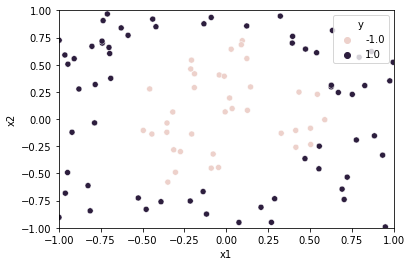

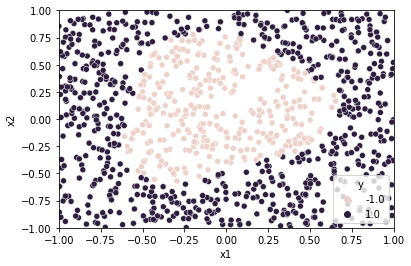

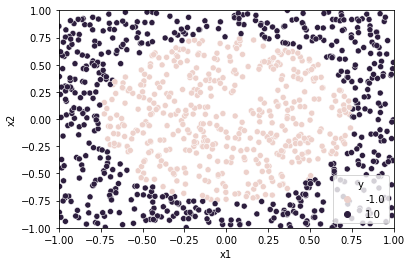

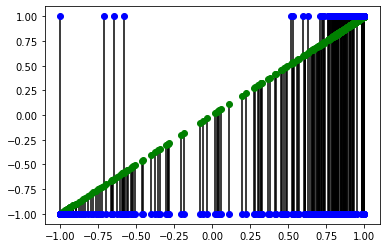

In [20]:
NeuralNetwork()

Pre Adjusting Ein 2.7501494873789114
Final Weights [array([[-1.88383983, -1.19426367,  5.76160304],
       [ 0.83848513, -4.87436732,  2.00615294],
       [-2.6707443 , -6.10227708, -4.78433465]]), array([[ 0.20242069,  3.72096253, -0.7206103 ,  0.08841725],
       [ 1.81377019, -0.78943436,  0.96289878, -0.43673482],
       [-2.06614795, -0.07011635,  3.24485271, -3.36285023]]), array([[ 0.89683148,  1.32243672,  0.51429392, -1.22681591],
       [ 0.59830843,  0.29170785,  0.74026632, -0.03281984],
       [-0.60637273, -0.88937634, -0.73902717,  0.7041248 ],
       [ 0.4959182 , -2.28814359,  0.2277498 , -0.93216324],
       [ 1.09219244,  2.11588771,  1.05471559, -1.99292572],
       [ 0.30847404,  0.89939597,  0.53521838,  2.41333958],
       [ 1.56462502,  0.05178255,  0.66669819,  0.16543204],
       [-0.44695192, -2.0059905 , -1.60241139,  1.87942675],
       [ 1.11891687,  2.31852339,  1.20986896, -2.16850644]]), array([[ 0.13868709,  0.30770692,  0.09025537, -0.26110008, -0.338

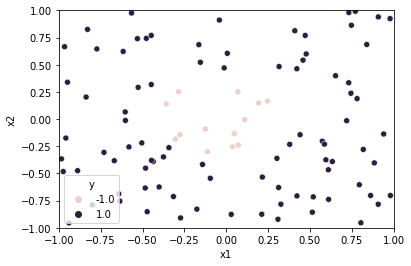

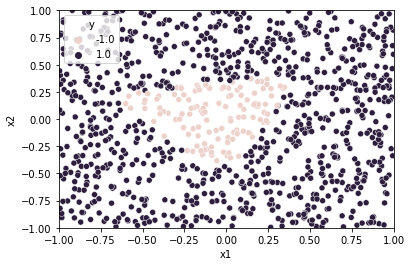

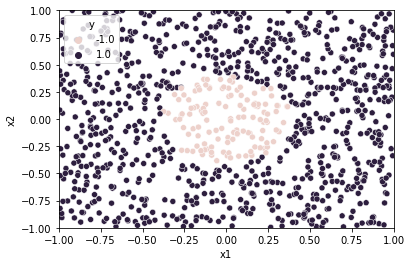

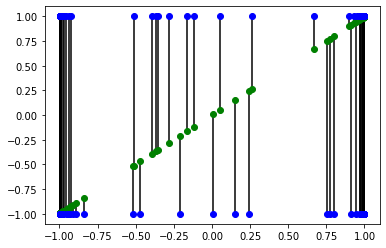

In [137]:
NeuralNetwork()

Pre Adjusting Ein 1.0616766229363517
Final Weights [array([[  6.0851364 , -10.20730458,   5.39626922],
       [  4.14476048,   3.52333452,   8.91128988],
       [ -7.51374704,  -1.15303661,  14.01310455]]), array([[ 5.35071069, -5.46189559, -5.37332265,  4.03529772],
       [-2.23937938,  0.66693124,  4.52293503, -5.19664441],
       [-5.87029556,  3.37941309,  1.73655208, -4.53829831]]), array([[-1.98602294, -1.66086254, -0.58449675,  2.37343502],
       [ 1.66221994,  0.98686616,  1.93123313, -0.12165069],
       [ 0.05790655, -2.30689104,  1.66106169,  1.7373534 ],
       [ 0.63897453,  2.67044587, -1.71061568, -1.09381362],
       [-0.30820183, -1.28999176,  2.05498108,  1.2915371 ],
       [ 1.79937492,  0.85753913, -0.1370241 , -2.11006066],
       [ 1.39383494,  0.34038165,  0.68078722,  0.18518626],
       [-0.11367276, -1.04423106,  0.87625123,  0.69673781],
       [ 1.88860274,  0.64447748, -0.99511622, -1.61298526]]), array([[ 0.50576694, -0.66932189, -0.30550808, -0.5581427

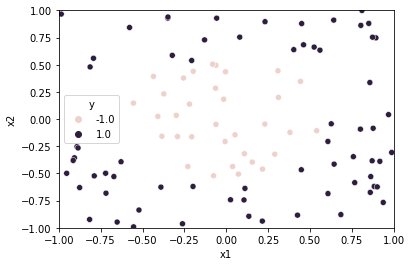

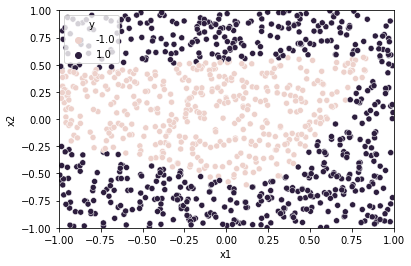

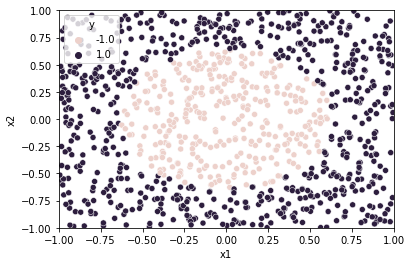

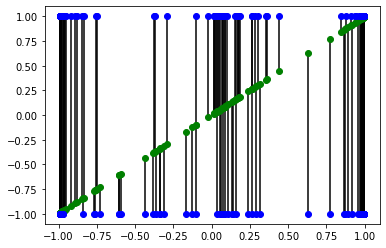

In [139]:
#0-1 sigmoidal function does not work because it gives a zero or one as ouput from activation func but in order to get 

In [86]:
sum([[[1,2],[1,2]],[[1,2],[1,2]]],[])

[[1, 2], [1, 2], [1, 2], [1, 2]]

In [163]:
np.round([1.3,2])

array([1., 2.])

In [119]:
np.sum(np.array([[1,2],[1,3]]),axis=1)

array([3, 4])

In [72]:
X**2

array([[45.75163683, 56.05962688],
       [62.87518185, 70.9582767 ]])

In [173]:
1/(1-e**.04)

-24.50333324444784